## 0 Importación de imágenes desde Excel

In [4]:
import pandas as pd
import os
import requests

import cv2
import numpy as np
from tensorflow.keras.models import load_model

import numpy as np
import os, os.path
from PIL import Image

from random import sample
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt

import tensorflow as tf


In [5]:
from keras import Sequential
from keras import optimizers
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential,Model
from keras.layers import LSTM, Dense, Bidirectional, Input,Dropout,BatchNormalization,CuDNNLSTM, GRU, CuDNNGRU, Embedding, GlobalMaxPooling1D, GlobalAveragePooling1D, Flatten
from keras import backend as K
from keras import initializers, regularizers, constraints
from sklearn.model_selection import KFold, cross_val_score, train_test_split

from tensorflow import keras
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model 
from tensorflow.keras.applications import imagenet_utils
from sklearn.metrics import confusion_matrix


from tensorflow.python.framework import graph_util
from tensorflow.python.framework import graph_io
from keras import backend as K
import h5py
import tensorflow.compat.v1 as tf

from tensorflow.keras import backend as K
from tensorflow.keras.models import load_model


from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, Flatten, BatchNormalization, Conv2D, MaxPool2D, UpSampling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix
import itertools
import shutil
import glob
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

# MODELO 0

Modelo creado desde 0

## 1 Importación de imagenes desde links

In [ ]:
# Cargamos el dataset
train_data = pd.read_csv('train_clean.csv')

# Creamos la carpeta para guardar las imágenes
if not os.path.exists('train_images'):
    os.makedirs('train_images')

# Iteramos sobre cada fila del dataset y descargamos las imágenes
for index, row in train_data.iterrows():
    image_id = row['id']
    image_url = row['url']
    image_path = os.path.join('train_images', f'{image_id}.jpg')
    
#Errores HTTP
    try:
        response = requests.get(image_url, stream=True, headers={'User-Agent': 'Mozilla/5.0'})
        response.raise_for_status()

        with open(image_path, 'wb') as image_file:
            for chunk in response.iter_content(1024):
                image_file.write(chunk)
    except requests.exceptions.HTTPError as err:
        print(f'HTTP Error: {err}')
        continue
    except:
        os.remove(image_path)
        continue


HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/d/d9/Fellegvar_-_panoramio_%289%29.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/8/84/MuralFestival2014-Rone%28Italie%29.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/7/79/%E6%9C%9D%E5%A4%A9%E5%AE%AB%E7%89%8C%E5%9D%8A-%E6%AB%BA%E6%98%9F%E9%97%A8-%E6%98%8E%E6%9C%AB%EF%BC%8C%E6%9C%9D%E5%A4%A9%E5%AE%AB%E9%83%A8%E5%88%86%E5%BB%BA%E7%AD%91%E6%AF%81%E4%BA%8E%E6%88%98%E7%81%AB%E3%80%82%E6%B8%85%E4%BB%A3%E5%BA%B7%E7%86%99%E3%80%81%E4%B9%BE%E9%9A%86%E6%97%B6%E6%9C%9F%EF%BC%8C%E9%9A%8F%E7%9D%80%E6%B1%9F%E5%8D%97%E7%A4%BE%E4%BC%9A%E7%BB%8F%E6%B5%8E%E7%9A%84%E6%81%A2%E5%A4%8D%E5%92%8C_-_panoramio.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/4/4f/Monument_to_lab_mouse-3.JPG
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimed

HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/8/82/Mappa_fortificazioni_austro-ungariche_in_nord_Italia.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/9/97/IJVCapasShrine2.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/6/67/Lido_S_Maria_Elisabetta.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/a/af/Kagghan_Valley.JPG
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/e/ee/%E4%B8%80%E8%B2%AB%E9%81%93%E7%8E%89%E5%B1%B1%E5%AF%B6%E5%85%89%E8%81%96%E5%A0%82_Yiguangdao_Yushan_Baoguang_Temple_-_panoramio.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/a/a0/%D0%A5%D0%B0%D0%BD_%D0%A8%D0%B0%D1%82%D1%8B%D1%80_%D0%BD%D0%B0_%D0%B7%D0%B0%D0%BA%D0%B0%D1%82%D0%B5_-_panoramio.jpg
HTTP Error: 404 Client

HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/3/36/Main_wall.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/0/08/Paris_-_panoramio_%28430%29.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/f/f6/Wracamy_z_Lip.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/a/a0/Pembangunan_Masjid_Raya_Sumbar_Des_201709.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/e/e4/Takanawasan0%C9%BE.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/d/d4/Zyourakuzi0%C9%A8.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/f/fe/Eger%2C_Eszterh%C3%A1zy_%28Szabads%C3%A1g%29_t%C3%A9r%2C_L%C3%ADceum_a_F%C5%91sz%C3%A9kesegyh%C3%A1z_fel%C3%A9_vezet%C5%91_l%C3%A9pcs%C5%9

HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/7/74/St._Maria_Magdalena_und_Lazarus_%28K%C3%B6ln%29_%286%29.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/7/79/Charles_eyck%2C_rosone_del_transetto_dlela_chiesa_di_santa_catyerina_a_eindhoven%2C_1951.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/e/e6/Dongdeamun_Design_Palaza%2C_Seoul_%288%29_%2841073378652%29.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/d/d7/Caryophyllales_-_Echinocactus_grusonii_20.jpg
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/6/66/Calambajf2765_08.JPG
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/wikipedia/commons/b/ba/Pafris-Le_Bon_March%C3%A912.JPG
HTTP Error: 404 Client Error: Not Found for url: https://upload.wikimedia.org/

# 2 Carga de imagenes 

In [3]:
# si ponemos la r es el directorio en el que estamos y despues ponemos la carpeta que queremos
img_folder= r'train_images'  
img_folder

'train_images'

In [4]:
path = 'train_images'
valid_extensions = ['.jpg', '.jpeg', '.png', '.bmp']
imgs_resized = []

for filename in os.listdir(path):
    ext = os.path.splitext(filename)[1]
    if ext.lower() not in valid_extensions:
        continue
    
    img_path = os.path.join(path, filename)
    try:
        with Image.open(img_path) as img:
            print(f'{filename} loaded')
            img = img.resize((100, 100)) # Redimensionar la imagen a 100x100 píxeles
            img_array = np.array(img)  # Convertir la imagen a un array NumPy
            imgs_resized.append(img_array)  # Agregar el array a la lista de imágenes redimensionadas
    except OSError as e:
        print(f'Error al cargar la imagen {filename}: {e}')



000235ce813517a1.jpg loaded
00116d7dae9a53cb.jpg loaded
00119f21c3717902.jpg loaded
0013137aab503e38.jpg loaded
001574f21efb4d85.jpg loaded
0018b44aa634f1a5.jpg loaded
001a1cc519b03e6a.jpg loaded
001cd787f1e9a803.jpg loaded
001eeb28415c1bc6.jpg loaded
002937eca90711e5.jpg loaded
002b386016930458.jpg loaded
002b7e9e3c424a24.jpg loaded
0031e3773cf6a594.jpg loaded
0033c5c0d02aded7.jpg loaded
0037d6af2257a25e.jpg loaded
003ada1ad7c8c166.jpg loaded
003af0f1fea7122c.jpg loaded
003b4c1e69e9d316.jpg loaded
003f74128e3533a9.jpg loaded
00429b0a692bc6ec.jpg loaded
00448b3c375ce4e1.jpg loaded
0047410d27c47687.jpg loaded
004d3a7b87f8fcba.jpg loaded
00524522c16ab89e.jpg loaded
0055d998795b8479.jpg loaded
006082aa47ce04d5.jpg loaded
0060892b0129adf3.jpg loaded
006573bf20252301.jpg loaded
00674be8b109ef1e.jpg loaded
00688f43a0dc9295.jpg loaded
006909e421628597.jpg loaded
0069a15c4585306b.jpg loaded
006a1559b97ff41d.jpg loaded
006b52540e8d931e.jpg loaded
006ecdc89c402703.jpg loaded
0082fd4214b3c2c7.jpg

03f68e851bcafa44.jpg loaded
03fb435560beb52d.jpg loaded
040105e91c91ef7d.jpg loaded
0406f6a75e54043a.jpg loaded
0416ad4775ee6e2f.jpg loaded
041cd76b86e702bc.jpg loaded
041d4340d2ba8815.jpg loaded
04212ee6193e4a3b.jpg loaded
042341400aebec5e.jpg loaded
0429922042e095c7.jpg loaded
042cc4989f77bc33.jpg loaded
042d10326613b32f.jpg loaded
04337349eebe0ebc.jpg loaded
04346925ab0bde0a.jpg loaded
0438e60f048d0e87.jpg loaded
043d2826956c7b46.jpg loaded
043e17bd2acbaa49.jpg loaded
0440d9ed42a28258.jpg loaded
04428c675265e309.jpg loaded
0444954e0f2cf19b.jpg loaded
0451e793374318b7.jpg loaded
045525ac62c5356c.jpg loaded
04562a03d90c67cf.jpg loaded
045be3071db61cf1.jpg loaded
045c71a0fb24f0a4.jpg loaded
045f242b7fbbedd0.jpg loaded
046348487de2d2fe.jpg loaded
0464f89fb751c67c.jpg loaded
04683a631c1db100.jpg loaded
046d4c2540559731.jpg loaded
046f8a394dc914d2.jpg loaded
046fcfb221cac838.jpg loaded
047082ddb9e31a55.jpg loaded
0471b4dc8a69cb5a.jpg loaded
0474c4dd457c9521.jpg loaded
0475cbaa5624517f.jpg

0814221593f531cc.jpg loaded
08159d484c2de129.jpg loaded
0819dd9509d0dfd2.jpg loaded
081ab081cf01834b.jpg loaded
081d5d2d5102183c.jpg loaded
08278d01eef9f4ce.jpg loaded
0829a7c9d088f53d.jpg loaded
0834ebaa3d668723.jpg loaded
08352cb4805164ae.jpg loaded
0835321d8d621646.jpg loaded
083930b78c9f00c8.jpg loaded
083dc56f44481778.jpg loaded
083e4cc589023694.jpg loaded
084a1097fb8a7daf.jpg loaded
0851a257e5e872ef.jpg loaded
0857b020e1d7f7b8.jpg loaded
08584b59d97bcf0b.jpg loaded
0864a52e98fc58ac.jpg loaded
0868230d53da0a74.jpg loaded
086994dd0513d41a.jpg loaded
086f2f9785dfa510.jpg loaded
087611a1847e6ff4.jpg loaded
08765c235badb950.jpg loaded
0876f3e5f6b3d3b6.jpg loaded
087882de6192cce9.jpg loaded
087a60c676a71779.jpg loaded
087c3cb6193b1257.jpg loaded
087f5c9af6117889.jpg loaded
0883f89abc1b0207.jpg loaded
08872149a794cebe.jpg loaded
08891bd47d83d6b9.jpg loaded
088b9e5e7b6cea55.jpg loaded
089b76142bee2464.jpg loaded
08a012f224d50005.jpg loaded
08a2670c49ced680.jpg loaded
08a50640543b8591.jpg

0c4737449310ddb2.jpg loaded
0c585ae1f79eac64.jpg loaded
0c58e32ae5f6edea.jpg loaded
0c5c6a70d97cc6ba.jpg loaded
0c6175924bdfb2be.jpg loaded
0c617c2d573a36ad.jpg loaded
0c623e879c4c08ec.jpg loaded
0c6267498ff9b931.jpg loaded
0c6e00f9683d2826.jpg loaded
0c7560d1473f138b.jpg loaded
0c7d67a4f567da03.jpg loaded
0c806c2844d80389.jpg loaded
0c8478921eac2850.jpg loaded
0c8568f3aba24410.jpg loaded
0c8c8c5aa49cc173.jpg loaded
0c8f1dbfca7459d0.jpg loaded
0c8f372ed2df040b.jpg loaded
0c8f77dc8d1f3cab.jpg loaded
0c8fb8cb7bee39ee.jpg loaded
0c99e64da704005e.jpg loaded
0c9dab5c7a721d0b.jpg loaded
0ca3db8c5a4d48cd.jpg loaded
0cb505df036d578c.jpg loaded
0cb69761dd4c9510.jpg loaded
0cb755e545cc477f.jpg loaded
0cb813a3685c5f2d.jpg loaded
0cc1d924de8a77fa.jpg loaded
0cc80bce0ee8c49f.jpg loaded
0cc9d1f6ef27382f.jpg loaded
0cccfac0b7e86a87.jpg loaded
0cd88b3a7edd18f0.jpg loaded
0cd8dc747a9cc326.jpg loaded
0cdb03fa1aa8d06c.jpg loaded
0cdfc39f1976862b.jpg loaded
0ce245f9882396b6.jpg loaded
0ce70d5b0f0557d4.jpg

112a86b8614f4b3e.jpg loaded
112bcc1562f925ac.jpg loaded
112d98e6a8c9fb0a.jpg loaded
1131c148715051a9.jpg loaded
11325cbae84f0f88.jpg loaded
113808cc89509d16.jpg loaded
1139301c1fcffa8d.jpg loaded
11430ce893751b42.jpg loaded
114347c938d5f7b1.jpg loaded
11442cb38044cccd.jpg loaded
1148d028ecee0733.jpg loaded
11496469c8f1a19d.jpg loaded
114d031e2c847c26.jpg loaded
1157097a4cf59b6e.jpg loaded
1161c426bfdce576.jpg loaded
1162c0af89c9008b.jpg loaded
1164735e1df12340.jpg loaded
11815b715931f380.jpg loaded
11833e1642cc55fc.jpg loaded
118449d098ee76e2.jpg loaded
1184a701c555212f.jpg loaded
118c0242bc89af59.jpg loaded
118d14453e86266f.jpg loaded
118e0c9b8f3db616.jpg loaded
118f35f9834bedc5.jpg loaded
11900f2377fc96f0.jpg loaded
1192277bc899f891.jpg loaded
1193716a555ca69b.jpg loaded
119e6082315d8a6a.jpg loaded
11a11d80699734e7.jpg loaded
11a21952437b15f1.jpg loaded
11a7a95e3a0f43ca.jpg loaded
11a897ad2924ef20.jpg loaded
11aaf93a9712033f.jpg loaded
11ad2c7c88ea2b93.jpg loaded
11ae8315f38876f9.jpg

1525ead1482f4aa1.jpg loaded
1529622bf709fee0.jpg loaded
152d4ea57e58a959.jpg loaded
15405043d9bfefb3.jpg loaded
1541a0e6a0cb842f.jpg loaded
15450ae4fbbf09bc.jpg loaded
154b687ddaa1050f.jpg loaded
154bd31b3f45138e.jpg loaded
154ee62dfe93b8ae.jpg loaded
15549fabd9c3e9d8.jpg loaded
155532c8458b1450.jpg loaded
1555c718a0fbfb4a.jpg loaded
1555eb3b3eab12ef.jpg loaded
155646ba1328e902.jpg loaded
1558116934cd491b.jpg loaded
1558721b73e81aa0.jpg loaded
1558afaf2703d7ae.jpg loaded
156267d0426c33a4.jpg loaded
15647f4c5feb749f.jpg loaded
1564d30ebda76f6c.jpg loaded
15650e5bf060885d.jpg loaded
156a480e532cb869.jpg loaded
156be97d22f28d1e.jpg loaded
156dd8d57cda249b.jpg loaded
15734d3000728dd8.jpg loaded
15745934feda5ee5.jpg loaded
1577de887abb226a.jpg loaded
1577dea39dd77622.jpg loaded
1578037bb8dac1a6.jpg loaded
157a0a5586d655e3.jpg loaded
157cb9b64c3e8219.jpg loaded
157de21958f5e381.jpg loaded
15815994b794ac95.jpg loaded
1582801a25d6802b.jpg loaded
15829abb07669e3f.jpg loaded
1585292183c5f27f.jpg

18d7139d555e9bf4.jpg loaded
18d7756589f091b2.jpg loaded
18da2ddc1a94829d.jpg loaded
18dbbb96241f4978.jpg loaded
18e184dca1653461.jpg loaded
18ec031002d7dd3b.jpg loaded
18ef86f52417c164.jpg loaded
18f177fffafaa875.jpg loaded
18f44084c808ad52.jpg loaded
18f60ebf8ac77788.jpg loaded
18f77c07d5b7005a.jpg loaded
19081ab298d205b9.jpg loaded
19082901ed4355ef.jpg loaded
190dec76ef79768b.jpg loaded
1913d15d9fc1d3cc.jpg loaded
1916262e2025c5ae.jpg loaded
19164f7f7ae7fc71.jpg loaded
1916e79af410fa38.jpg loaded
191fc29a534e11b5.jpg loaded
1922a496991b5460.jpg loaded
1923ee3b72980ac0.jpg loaded
19251b3dcc224a01.jpg loaded
19257975c8c62853.jpg loaded
1925f855f51efd49.jpg loaded
192c276c25fc58db.jpg loaded
192c66fa0e918b3d.jpg loaded
19304dd7ca5ca6e1.jpg loaded
19329a2f394b5c16.jpg loaded
1932d061d19ed246.jpg loaded
193487e762ef143d.jpg loaded
19366136e59e2206.jpg loaded
193bf5239206fb70.jpg loaded
193d71debbe11ea9.jpg loaded
193e3b536d527931.jpg loaded
193e6820dc238703.jpg loaded
1942ceb5c0385fd7.jpg

1d1e0bf52684073d.jpg loaded
1d1e4d893557e623.jpg loaded
1d1ea9e043d2d4f7.jpg loaded
1d1ffe57187ddf31.jpg loaded
1d209b5ed54ecd52.jpg loaded
1d28be6d084bf8fb.jpg loaded
1d2afc0dc6c3dfad.jpg loaded
1d2c5ea11d52d300.jpg loaded
1d3d05f98db6bb04.jpg loaded
1d3df09a147e8e2b.jpg loaded
1d4232ffea02784c.jpg loaded
1d432dcc65b294e7.jpg loaded
1d477fc7eaada179.jpg loaded
1d4befe0dbbd8e8c.jpg loaded
1d4c8c8df3df22e8.jpg loaded
1d4eab43b01fe7ec.jpg loaded
1d4f7202d07acccc.jpg loaded
1d5d133c7dc1cd58.jpg loaded
1d5d35deb9277005.jpg loaded
1d63ff73b7940591.jpg loaded
1d65df41bb8fe184.jpg loaded
1d67b49b560ebf5c.jpg loaded
1d700da536e25f78.jpg loaded
1d7027949c952209.jpg loaded
1d709803048cbde8.jpg loaded
1d7a89a4878d3262.jpg loaded
1d7d5baa6e0a97e9.jpg loaded
1d7d8849d27a928f.jpg loaded
1d7e1785c8747938.jpg loaded
1d8025d0b79fc7de.jpg loaded
1d81e0afc8dd874f.jpg loaded
1d84bab0384d9456.jpg loaded
1d87aff4a22d1ed3.jpg loaded
1d9246358efc8934.jpg loaded
1d933a779f648698.jpg loaded
1d9512eac340bafe.jpg

C:\Users\Lidia\anaconda3\envs\TFG\Lib\site-packages\PIL\JpegImagePlugin.py:835: UserWarning: Image appears to be a malformed MPO file, it will be interpreted as a base JPEG file
  warnings.warn(


200cf8b17a75d30f.jpg loaded
200d2e61871b942f.jpg loaded
20100e2df25ba631.jpg loaded
2014bd9ebc11288d.jpg loaded
2015499a7c359862.jpg loaded
2016d4994ac25b74.jpg loaded
2017f6d035427d0b.jpg loaded
2018abc4c112c997.jpg loaded
20214c70a2f9bae6.jpg loaded
2021f0398af82200.jpg loaded
2025536bb97030cb.jpg loaded
20262b9dfdd015c6.jpg loaded
202ad242ee976126.jpg loaded
202cd79556f30760.jpg loaded
2030d5287baf9401.jpg loaded
203a229a75e4b1fd.jpg loaded
203ba71fc3a26b73.jpg loaded
203cc12e14a2b37a.jpg loaded
203ecda169b3ed16.jpg loaded
203f13c3f8eda65e.jpg loaded
204829a25f1dd8e7.jpg loaded
20535023f5fb413d.jpg loaded
2053d0a17c736122.jpg loaded
2059b4554ca929b2.jpg loaded
205be2374c768e29.jpg loaded
205c906872bf43fa.jpg loaded
205c9fa4da1197c1.jpg loaded
206293a3e416dda3.jpg loaded
2064195a8a44a6cd.jpg loaded
206525f3019870c6.jpg loaded
206619286ed1304f.jpg loaded
206a2653a7b27815.jpg loaded
206f33ec1cc7549b.jpg loaded
207088febf752bf6.jpg loaded
20716a7ae6d249ba.jpg loaded
207179fb00df5034.jpg

24814010c4b772dc.jpg loaded
2483f81ec9f7548b.jpg loaded
2487c770f7bee11b.jpg loaded
2489dab43fe75013.jpg loaded
248bc878398a261e.jpg loaded
248ed636f891f531.jpg loaded
2491f27313a19345.jpg loaded
2496caa157f74e0b.jpg loaded
249be6e538d9a9a2.jpg loaded
24a5f9efd87b3ee0.jpg loaded
24aaebf464df8e4a.jpg loaded
24ab456537b995fb.jpg loaded
24accb8c6c7035ca.jpg loaded
24b223e07a46bae4.jpg loaded
24bc1487e094bf1c.jpg loaded
24c300466262fc87.jpg loaded
24c6df59de3e2a8e.jpg loaded
24ca7ca8b303f6b1.jpg loaded
24cbe8e3a3378b1f.jpg loaded
24d266411f2b6d64.jpg loaded
24da10166c1698bb.jpg loaded
24dbc29077169817.jpg loaded
24dc957b6fbcaa8a.jpg loaded
24e009bfbd482bef.jpg loaded
24e860a5042f9f19.jpg loaded
24f0a17baf90f391.jpg loaded
24f28c468ad335a9.jpg loaded
24f36b83f5b286b1.jpg loaded
24f7f7eaa69adda4.jpg loaded
24f9852397580a23.jpg loaded
25018f41e0ec7018.jpg loaded
25028e64375d85d9.jpg loaded
250ce73e2919ce18.jpg loaded
250d981ece37f8bf.jpg loaded
2513a781312f51c8.jpg loaded
2525f0f71d34a68f.jpg

28f9cf80e8bbddcb.jpg loaded
28f9e9eb7179434c.jpg loaded
28fbae74a825147b.jpg loaded
290a803cdff6f836.jpg loaded
290d6daf8eb921b1.jpg loaded
2913f1f9f8063112.jpg loaded
2914e144287100cc.jpg loaded
29162caf08c75d1a.jpg loaded
29224715ae327565.jpg loaded
29239a2565354560.jpg loaded
29245439c42ba64c.jpg loaded
2927a1e89154d6f1.jpg loaded
292c0efe82b3914b.jpg loaded
292d2bff30bd99c1.jpg loaded
292e743150773a54.jpg loaded
2935812159bd378d.jpg loaded
2942222f91cb13d4.jpg loaded
2943aca04086b89b.jpg loaded
29468f70e82573ae.jpg loaded
294727c3ff3c1871.jpg loaded
294857bec6cf3ab0.jpg loaded
294d463748684c56.jpg loaded
2952748382512dd3.jpg loaded
2956dcf81c980296.jpg loaded
29575a80ad3d36c7.jpg loaded
29579e47f5c28055.jpg loaded
2957dccc3e417f67.jpg loaded
295c54b6658eee8b.jpg loaded
295c6541f893e8f6.jpg loaded
295e684c9b4a93ec.jpg loaded
296028fa62df26fc.jpg loaded
29627be04e1f3d83.jpg loaded
2962e341e0263e8d.jpg loaded
2965ff0fe1cd238d.jpg loaded
29719a211b22c7f9.jpg loaded
2971a7e523d050f1.jpg

2d02d821f32e3cf3.jpg loaded
2d04c15cdabad692.jpg loaded
2d0e04c65547680b.jpg loaded
2d1431c51be7291d.jpg loaded
2d1926485ddf087c.jpg loaded
2d1989a50ffb2bdd.jpg loaded
2d29e9b4352fbcfe.jpg loaded
2d2d5289aabb599d.jpg loaded
2d309d6a07df24fd.jpg loaded
2d3ed8f45af77f81.jpg loaded
2d455541003834fa.jpg loaded
2d47fa913888092c.jpg loaded
2d4b8945bfbb5c7e.jpg loaded
2d51028214f983f4.jpg loaded
2d62607ca9044db0.jpg loaded
2d6a5b5df83f0367.jpg loaded
2d6f5081741727fb.jpg loaded
2d73a7aed8081790.jpg loaded
2d79523c5b9a59e3.jpg loaded
2d923fdfda326738.jpg loaded
2d9fc911d28d97d5.jpg loaded
2d9fe7461f2fe6a7.jpg loaded
2da5762431977fcb.jpg loaded
2da89305c3bf8af1.jpg loaded
2da956de4be23f8d.jpg loaded
2db176ff61318097.jpg loaded
2db21ac458e7edaf.jpg loaded
2db3fe9c48b769e3.jpg loaded
2db508efc4538c0b.jpg loaded
2db70d34ce4b57d4.jpg loaded
2db9345e0f0872a8.jpg loaded
2dba0d5b54a5eb7f.jpg loaded
2dbb3df5d101c5c0.jpg loaded
2dbfa0089c37c1c7.jpg loaded
2dcb1a33c5a9c7aa.jpg loaded
2dcbe22e23c27ddc.jpg

31517a034d2ba84f.jpg loaded
3152079ad38dd7b4.jpg loaded
3154849484902d89.jpg loaded
3156c8b06af5017c.jpg loaded
315b8790aa0f1c59.jpg loaded
315ddeb776eae3d5.jpg loaded
315ed8928fbc1145.jpg loaded
315f49037667aa70.jpg loaded
3164f7502fb63163.jpg loaded
3167fc45a588589c.jpg loaded
3168ed6a2b164e31.jpg loaded
316e03dea33e4d11.jpg loaded
31735de54f9022b8.jpg loaded
3173922b9f5b9384.jpg loaded
3174480d9f9dbd9a.jpg loaded
31751af9f36980c2.jpg loaded
317674e9facf9ec9.jpg loaded
3178d5cc58c1b2f0.jpg loaded
3179003c57419927.jpg loaded
317af8259d965f4b.jpg loaded
317bd9b66957abd8.jpg loaded
317ee0f0937f8552.jpg loaded
317ef49fe9644a88.jpg loaded
3181770a1fa55132.jpg loaded
3181e664d75b8a15.jpg loaded
3183c945baf81931.jpg loaded
31869532279918c2.jpg loaded
3194a7121b9dc913.jpg loaded
3197e3948defc6ff.jpg loaded
319e41e5adbc66ff.jpg loaded
319fb760048315d3.jpg loaded
31a8c4f969878a8a.jpg loaded
31adcc6d06da823e.jpg loaded
31b4ad27c336231a.jpg loaded
31b7c236d4c3a442.jpg loaded
31bcb24b85425aac.jpg

35a974e48f65ca62.jpg loaded
35abef1edf628605.jpg loaded
35b12c69b91f0e33.jpg loaded
35b18a365e6c8345.jpg loaded
35b31c60dec90422.jpg loaded
35b765267646fe9f.jpg loaded
35ba49a0cd8967fe.jpg loaded
35bd7da0a0f50fbb.jpg loaded
35be6d8e9f0b53bc.jpg loaded
35c15809ed530e33.jpg loaded
35c21d7977dc30a7.jpg loaded
35c641cdef24ed0a.jpg loaded
35c7117114cf563b.jpg loaded
35cb374a6d576f0e.jpg loaded
35d02926c7668ebb.jpg loaded
35d1cc4912d4668a.jpg loaded
35d8a3755bead7b8.jpg loaded
35df0614077e7444.jpg loaded
35e7c8ecea173e3c.jpg loaded
35e96c99746d7dbc.jpg loaded
35ec9a9e7a33e1e6.jpg loaded
35f8d8f31eadd0fe.jpg loaded
35fdcdc381dc527d.jpg loaded
35fe375a3752fae3.jpg loaded
36011b88526f9107.jpg loaded
36038f8776f4a0c9.jpg loaded
360397d9a111c798.jpg loaded
3608524aed619743.jpg loaded
360d4f8349774052.jpg loaded
3616bdddd4b7c3f5.jpg loaded
3617d51af6b4832e.jpg loaded
36212bad7c7c6b8b.jpg loaded
36236d4657f884f8.jpg loaded
36262a22e28c4764.jpg loaded
362d9c6c26c0121c.jpg loaded
362e98880d26bc24.jpg

39d37530fb3d81dc.jpg loaded
39d40fa5229d6b08.jpg loaded
39d7e603beb2fc32.jpg loaded
39dad7a3570bf1a4.jpg loaded
39e8eaa2817a004d.jpg loaded
39e8f6919d0449d8.jpg loaded
39f17b53526eee12.jpg loaded
39f1d444582a6550.jpg loaded
39f6ebeb26d87da2.jpg loaded
39f7240ba5f75d89.jpg loaded
39fdd98329f39443.jpg loaded
3a0013530b715527.jpg loaded
3a08cb4b101db5c7.jpg loaded
3a092c0fb747c2a4.jpg loaded
3a0ceaf1a8451807.jpg loaded
3a0f16068b325456.jpg loaded
3a0f7f345ca820c4.jpg loaded
3a1654c32346cb8c.jpg loaded
3a183767a7cccde4.jpg loaded
3a185372d8bd77b1.jpg loaded
3a1c2ff01c12281c.jpg loaded
Error al cargar la imagen 3a1c2ff01c12281c.jpg: image file is truncated (4 bytes not processed)
3a1db11fa3f42e82.jpg loaded
3a22c748c3ce8290.jpg loaded
3a245e5decf065df.jpg loaded
3a2733ef18fb3ebc.jpg loaded
3a281454dfc80853.jpg loaded
3a299080a5f94dd8.jpg loaded
3a2b6fcda060bdb6.jpg loaded
3a34049c784ab6ab.jpg loaded
3a382955aa38f237.jpg loaded
3a3d84eef84ced1a.jpg loaded
3a43ac6dfb8ff0ba.jpg loaded
3a441143

3e378ba604ad3e94.jpg loaded
3e37c6940184a9da.jpg loaded
3e39596fcb3412f4.jpg loaded
3e3bf86d98638f9d.jpg loaded
3e3fe6ab1629b227.jpg loaded
3e41c1d9874bc393.jpg loaded
3e437f7f87a89426.jpg loaded
3e51325c716be6b2.jpg loaded
3e52902d8038f4c7.jpg loaded
3e52f6cf1fc30cb7.jpg loaded
3e5a5fd6be8cf3aa.jpg loaded
3e5a6fd84abc1076.jpg loaded
3e6148e10948f40c.jpg loaded
3e620a6f32af602c.jpg loaded
3e6439f457a8758a.jpg loaded
3e65a9c43c05355f.jpg loaded
3e66ff83dbd6c8be.jpg loaded
3e68cf3dc6bd24da.jpg loaded
3e6b83dce56a0a7d.jpg loaded
3e77ac27bda60617.jpg loaded
3e79461828320f09.jpg loaded
3e79c6dad687533c.jpg loaded
3e7ca311cfb65ce2.jpg loaded
3e7d3771bb74c5a1.jpg loaded
3e7e0edfe01874ec.jpg loaded
3e80b31c8b47b654.jpg loaded
3e80d2cfa021614e.jpg loaded
3e8c9f6b7accadab.jpg loaded
3e8cf3fdc313d00a.jpg loaded
3e917724dd0854fa.jpg loaded
3e949e6083748d5a.jpg loaded
3e97509f379ccf97.jpg loaded
3e9cf6c3460f8062.jpg loaded
3e9d68e04690ad34.jpg loaded
3ea6ec014bc74a2b.jpg loaded
3eac42fbda16a5e4.jpg

421faead1c16894f.jpg loaded
4221a01b91875ed0.jpg loaded
4221ab4706aaf2c8.jpg loaded
422b6d5df28b009b.jpg loaded
4230e5da1f25a44d.jpg loaded
42344e397b812861.jpg loaded
42386cd7ca15ea27.jpg loaded
423b376cc0be2b79.jpg loaded
423ca935042cd6b4.jpg loaded
42498207dbb44870.jpg loaded
424cbc979ad03030.jpg loaded
425192c04c07ef50.jpg loaded
4258235e42011399.jpg loaded
4259c388a225ee77.jpg loaded
425b19156a0545ce.jpg loaded
42646d40144d2f14.jpg loaded
4265e56b717ca5ba.jpg loaded
4268b1b6693365b2.jpg loaded
426942be4cf74ef6.jpg loaded
4269aeaa37b8b54f.jpg loaded
426cb6dd4284f026.jpg loaded
427dbb8da310cc3f.jpg loaded
42804496ad18c290.jpg loaded
42821e3977ea9be1.jpg loaded
4289f8c25fca009b.jpg loaded
428a12a40f199235.jpg loaded
428d030bb4d28b06.jpg loaded
428f33b8458079d6.jpg loaded
42910d763f3e5318.jpg loaded
42919f3229087686.jpg loaded
4294d8310a24b3e9.jpg loaded
429e89d411537b90.jpg loaded
42a3cba831690851.jpg loaded
42a6f8769ebe4654.jpg loaded
42a83cc8efb417b5.jpg loaded
42a8b3038a8d4d24.jpg

4670bc2d9b07f682.jpg loaded
4678750f2ea23252.jpg loaded
467ad7bc627cc0b9.jpg loaded
467b6dcca94ecbef.jpg loaded
467bb8ebc4328495.jpg loaded
467da5223ef9dfdc.jpg loaded
468272f95a99a4ca.jpg loaded
4684e913fd327dab.jpg loaded
46886d7e3f0ca114.jpg loaded
4688d934e649a2a1.jpg loaded
468a6f8cb08525b7.jpg loaded
468c983159228834.jpg loaded
468eb55f5f3221b8.jpg loaded
46929f2ff8a2244e.jpg loaded
46948e124529aa4f.jpg loaded
46953921a3525dc1.jpg loaded
4695739392fe00bf.jpg loaded
4696ad8d49bb275a.jpg loaded
4697bd692b357a44.jpg loaded
4698f80a34bacc49.jpg loaded
469ae662ab63cb02.jpg loaded
46a20986665b0ec8.jpg loaded
46a5ba6f483cff82.jpg loaded
46a6ef37c60fffef.jpg loaded
46adba5858e9d8a8.jpg loaded
46b2467a38d8e796.jpg loaded
46b9c58bc5974924.jpg loaded
46ba225f43ffbd2e.jpg loaded
46bc8cf5b5b3ee5d.jpg loaded
46bd7fbee79c9598.jpg loaded
46c0291ee1fbc56d.jpg loaded
46c165242e224189.jpg loaded
46c2eb81e44267a3.jpg loaded
46c37b5c5cd7cc1b.jpg loaded
46c6db3053562cc4.jpg loaded
46cd3fe6bb62e860.jpg

4a2908945e69be18.jpg loaded
4a2a4ac258139c2f.jpg loaded
4a307f354e8add4b.jpg loaded
4a31c921200b98b9.jpg loaded
4a34babe36f28aed.jpg loaded
4a35329c17451e8e.jpg loaded
4a3d32c787560ac5.jpg loaded
4a3d694eb23d9144.jpg loaded
4a3d95034ad57096.jpg loaded
4a3efea89f1ada43.jpg loaded
4a43a6689f06dfaa.jpg loaded
4a51756207d27091.jpg loaded
4a570dd2653c01b5.jpg loaded
4a576efa9c108110.jpg loaded
4a587560fbcea424.jpg loaded
4a5960289696f480.jpg loaded
4a5a04aebff23a48.jpg loaded
4a5b191d0ae7c07e.jpg loaded
4a5f825feba2b4a8.jpg loaded
4a631ebf1e71915f.jpg loaded
4a643084af9d0d94.jpg loaded
4a646abf343a9d99.jpg loaded
4a6934bbaf4637dd.jpg loaded
4a6d0c7a4f6a4453.jpg loaded
4a6e867fd5e19ae6.jpg loaded
4a72228151148a1c.jpg loaded
4a780ccf8cd7101f.jpg loaded
4a793740ae310f3c.jpg loaded
4a82f6e43ce52c0e.jpg loaded
4a8b20f6063576b5.jpg loaded
4a907eaf223b7e98.jpg loaded
4a96ad386cc19b28.jpg loaded
4a9732d8623f5650.jpg loaded
4a9d89ac167691d0.jpg loaded
4a9e87d4119ae3ac.jpg loaded
4aa21522bb1339b5.jpg

4e83376c2d723523.jpg loaded
4e8d2f6bc95af910.jpg loaded
4e8de0749162a081.jpg loaded
4e8f1c1557642330.jpg loaded
4e8f78eb7366bed7.jpg loaded
4e9153f5816d4c44.jpg loaded
4e953af7f2b423c9.jpg loaded
4e9c82aeb169ed46.jpg loaded
4e9dc1f492ae89af.jpg loaded
4e9de5c663eabb52.jpg loaded
4eabeaafac13555f.jpg loaded
4ebc2479246f4a87.jpg loaded
4ebf851ae564aa2b.jpg loaded
4ec94e5c8d455e0c.jpg loaded
4ecc82b0562df18d.jpg loaded
4ecdbee7dbe60b81.jpg loaded
4ecddc0f558794e9.jpg loaded
4ecec4876ced737d.jpg loaded
4ecf200ba4d4cf81.jpg loaded
4ed0510d86e93609.jpg loaded
4ed6b7871da574d6.jpg loaded
4ed70f7aca405df7.jpg loaded
4ed9eacb5330bf2f.jpg loaded
4ede4bcf4c27226d.jpg loaded
4ede51294213aa49.jpg loaded
4ee0f8a9c939416b.jpg loaded
4ee4e7e85513484d.jpg loaded
4ee58c74ff29a98f.jpg loaded
4ee60a1a943c101b.jpg loaded
4ee62b782fd5d1e4.jpg loaded
4eed242688a8f9bd.jpg loaded
4ef03271f56e6092.jpg loaded
4ef64f0399051321.jpg loaded
4ef67629599efee3.jpg loaded
4f09ab6039aa5d16.jpg loaded
4f11df5f33c93963.jpg

524a269fc7fbc793.jpg loaded
524a3fb6fb57fc6f.jpg loaded
524bf830af98b12c.jpg loaded
5250f9f67ba146e9.jpg loaded
52529be8513567d3.jpg loaded
52556713c0bc68dc.jpg loaded
5259ce858e9c5846.jpg loaded
525c86f8155afff1.jpg loaded
525d611b27e71100.jpg loaded
525f590e19dd9e2c.jpg loaded
5262c258eaa1ebf9.jpg loaded
52660d6f3e14a2de.jpg loaded
526ba03d515a845a.jpg loaded
5270254d0f8a648a.jpg loaded
527041cf00eadcd7.jpg loaded
52709800044ca50f.jpg loaded
527224db3509c5e2.jpg loaded
5272be14be57c9e4.jpg loaded
5278070d22520bfa.jpg loaded
527a03245c543784.jpg loaded
527c6e143b82acc2.jpg loaded
527eb963f76a6b2e.jpg loaded
52830dd5c63085cf.jpg loaded
5286694c994bba2c.jpg loaded
528ac72b0acb6ead.jpg loaded
528bd0286e48e8f2.jpg loaded
52936492564d0185.jpg loaded
5296145c440feea7.jpg loaded
52965215b182e2f0.jpg loaded
5298e3e846745da3.jpg loaded
529a744641f35896.jpg loaded
529cefd855b3f1a1.jpg loaded
529efabeca973ef3.jpg loaded
52a165dcc203a268.jpg loaded
52a3fc827adf0214.jpg loaded
52a7be9b029bc141.jpg

55d246a33c456ac4.jpg loaded
55d4793438ac8a55.jpg loaded
55db17dda6c309de.jpg loaded
55db314d3fd79733.jpg loaded
55dbbb34edc2226d.jpg loaded
55f00629c6285013.jpg loaded
55f1ea634929515e.jpg loaded
55f403dea4c91228.jpg loaded
55f9901e1e2901ed.jpg loaded
5601fd16499ddda9.jpg loaded
5605ea780928e47f.jpg loaded
5609ebe28548b8ab.jpg loaded
560a9503d4484d4b.jpg loaded
56128ad033b95486.jpg loaded
56131eb48276b5b5.jpg loaded
561b0bb411ac9590.jpg loaded
561b46fdd7daa676.jpg loaded
561b69121b22adf4.jpg loaded
561cdedbe99d42c3.jpg loaded
561dbb6215d87303.jpg loaded
56247b1b53a43600.jpg loaded
5629af42dcfd6eee.jpg loaded
562b397025371e33.jpg loaded
5632252a5e53dd9a.jpg loaded
56323495fc0040a4.jpg loaded
56337de6fcaeb792.jpg loaded
56350d50cd50db34.jpg loaded
5635f3b5b2abd909.jpg loaded
56387c9b6d963654.jpg loaded
563bdbf5ebfdcfc0.jpg loaded
563d77c6c95aaeae.jpg loaded
563db19580540b23.jpg loaded
563ec183905757cb.jpg loaded
5640005da2617acd.jpg loaded
5643fbd4615a1f4f.jpg loaded
564872c91b305320.jpg

59aee18be437255d.jpg loaded
59b43cdb3b84b535.jpg loaded
59b5a0ba97da1e54.jpg loaded
59b90e2cd5a23281.jpg loaded
59bb934e0a1ba4d9.jpg loaded
59bd31ea8c262a82.jpg loaded
59bf9fe1845cd0fd.jpg loaded
59c780e426e718c4.jpg loaded
59cc349a43bd7ff0.jpg loaded
59ce32718ee79082.jpg loaded
59d04bf757f7265a.jpg loaded
59d619717f7dff6f.jpg loaded
59d9076b5524c1dd.jpg loaded
59dbbb450c7a390f.jpg loaded
59e1760fec79b28e.jpg loaded
59e2422d347e278f.jpg loaded
59e7d8983e649af9.jpg loaded
59eb82f340005fc7.jpg loaded
59ec3c91367b6bc0.jpg loaded
59ec98eee2ca6502.jpg loaded
59f06c4cb03c471a.jpg loaded
59f1e98c19ce2dbc.jpg loaded
59f4a71f400542cb.jpg loaded
59f7a9d374bc7365.jpg loaded
59f8a22953646e25.jpg loaded
59fcca05ce34dc14.jpg loaded
59ff5819ff19f3f2.jpg loaded
59fff743552d0dc6.jpg loaded
5a013bb9de6631ce.jpg loaded
5a0c6b3da2e9944e.jpg loaded
5a0cb38595a4f17a.jpg loaded
5a0e1fdde81c29ea.jpg loaded
5a19286d6b28a65c.jpg loaded
5a2142ca200d1d29.jpg loaded
5a256bc172332f00.jpg loaded
5a25a00988a47f3b.jpg

5e007ea58608d76b.jpg loaded
5e0aa6c397bc2db2.jpg loaded
5e0b52a7bbc2825a.jpg loaded
5e1122cf8e802a9a.jpg loaded
5e132494b9c07ded.jpg loaded
5e17b48fad2165b2.jpg loaded
5e1e366c4ca3a3c8.jpg loaded
5e2a9e7c3a6a9523.jpg loaded
5e2c549ee8baeed0.jpg loaded
5e2ca44f378c3501.jpg loaded
5e325020d50eaf6d.jpg loaded
5e38143f836a27cd.jpg loaded
5e3b749c295fc4b6.jpg loaded
5e3c8bb98e500764.jpg loaded
5e4620aba55e78aa.jpg loaded
5e493f4884afec8b.jpg loaded
5e4bc5c647c07a2f.jpg loaded
5e59e9e234016a8d.jpg loaded
5e60d5c54032eebb.jpg loaded
5e6a29534761c5fe.jpg loaded
5e6ed6a598235143.jpg loaded
5e6f4072b5674b12.jpg loaded
5e6fd08e4abfc3cd.jpg loaded
5e76a23478765ce7.jpg loaded
5e7bc09fe5501759.jpg loaded
5e8ccc4672d8648a.jpg loaded
5e8dac49e3c1e765.jpg loaded
5e90f26b544b57fd.jpg loaded
5e91a6c946796714.jpg loaded
5e963dddbae9ec80.jpg loaded
5e9642caee0cf41f.jpg loaded
5e97cbafb6b11056.jpg loaded
5e97f01e6344a4ea.jpg loaded
5e9987e9ddfac2ac.jpg loaded
5e9b11d1161e10c5.jpg loaded
5e9ff9a99f9433aa.jpg

621967bd002a8aac.jpg loaded
621eec55ed6223a9.jpg loaded
6220b8f8786db8d3.jpg loaded
622411fb0ac8d324.jpg loaded
6231bc5fdd30b4d5.jpg loaded
6232c502ed6a9ead.jpg loaded
623839088e7c7064.jpg loaded
624284ad8350db17.jpg loaded
62488f4ce9064982.jpg loaded
6248fed7293eb3b1.jpg loaded
624ac3fe7cabe582.jpg loaded
624ae80821ba9c07.jpg loaded
624aeee802c24d96.jpg loaded
624e98f5f3ff56d2.jpg loaded
624f54dc4ff630f4.jpg loaded
625234f39c382050.jpg loaded
6252a5e3149494ce.jpg loaded
6252b3e9d6648c5d.jpg loaded
625838471fc423fb.jpg loaded
6260587d4e570ef1.jpg loaded
6262189f6fab80b5.jpg loaded
62629244f3d3f67e.jpg loaded
6267d357893520ca.jpg loaded
62688c27aefc2946.jpg loaded
6271d6c9af1c376f.jpg loaded
6276f2bd10f60825.jpg loaded
6277f489deef87fe.jpg loaded
6281817181d2d500.jpg loaded
6282233b75cdc7d2.jpg loaded
6283d84cd2c6667a.jpg loaded
6285245f5c3688d4.jpg loaded
6289001689a36444.jpg loaded
628b009b8e538944.jpg loaded
6290cac22bc8bbf9.jpg loaded
629272b07c8d29df.jpg loaded
629291fd19474525.jpg

65c69c25a52f7b4a.jpg loaded
65c6febcc69b8262.jpg loaded
65cd9c68578e869e.jpg loaded
65d12d5774ee2c9a.jpg loaded
65da71a81798d2ca.jpg loaded
65debbd526670c6f.jpg loaded
65e491ddaf0e1edc.jpg loaded
65e4cc10525e3286.jpg loaded
65eab33d70f5a52d.jpg loaded
65eb6ec453ff3562.jpg loaded
65efdfbc30994e8e.jpg loaded
65f25d5bed9c23d6.jpg loaded
65f29a55ab313d52.jpg loaded
6603b137aebc153f.jpg loaded
660f3d4d49aa6f04.jpg loaded
660f423cc9c3f47d.jpg loaded
660fd5d56420759e.jpg loaded
66124e8c52252b19.jpg loaded
66129413ff53e076.jpg loaded
6613ccc503320bb4.jpg loaded
6616f6781137662e.jpg loaded
662014d113371c9b.jpg loaded
6621f660fa890a1e.jpg loaded
66242990d02c9141.jpg loaded
662746245b7ea017.jpg loaded
6633544265b98323.jpg loaded
663b8a16f036a535.jpg loaded
663c87d5d11c1040.jpg loaded
663e3630d94e98cd.jpg loaded
664178d8693dfbe5.jpg loaded
6641e7cb9aec64a9.jpg loaded
664248702d7fe0ae.jpg loaded
6646efe6c5be2bac.jpg loaded
664ad46523751ee4.jpg loaded
6652181247ba0bcd.jpg loaded
6654b3ba6e0641f6.jpg

69d359cabaca5e14.jpg loaded
69d4c1263008f82a.jpg loaded
69ddb51116a77de8.jpg loaded
69e66ee47a9a2309.jpg loaded
69e7739e2974cd01.jpg loaded
69ea12770dea1b54.jpg loaded
69eae70878ffcdb6.jpg loaded
69eb3dee9379e5ad.jpg loaded
69f546123827e6f3.jpg loaded
69f8f665da2759d5.jpg loaded
69fa233432ec4c70.jpg loaded
69fbded52ed89272.jpg loaded
6a029886082f19d8.jpg loaded
6a02a2a2945ad067.jpg loaded
6a0347de3ae9987b.jpg loaded
6a147a7a95209e25.jpg loaded
6a15e80be33dcc7b.jpg loaded
6a18d1461f7e05fb.jpg loaded
6a1a7ca642da3c4c.jpg loaded
6a2625879481dd20.jpg loaded
6a26e07a87e40529.jpg loaded
6a2bbf27be456287.jpg loaded
6a2bea9489c6e370.jpg loaded
6a2c61e2175c8b76.jpg loaded
6a2e72913fa49ab3.jpg loaded
6a30c259014b2179.jpg loaded
6a421ad7d760c61b.jpg loaded
6a49ba83295ed5ca.jpg loaded
6a4c9bb950822391.jpg loaded
6a4d0159be2cdeb9.jpg loaded
6a5701c5ee26764f.jpg loaded
6a59031216a7d40f.jpg loaded
6a59b39cf0d57134.jpg loaded
6a5b1401cd9f1030.jpg loaded
6a628dd477272a99.jpg loaded
6a6908591fc7e39c.jpg

6e16ed1fb9ff46eb.jpg loaded
6e176c052002d6e4.jpg loaded
6e17da486ce98c69.jpg loaded
6e1aed65f4fa9458.jpg loaded
6e1d0a3707ef5f77.jpg loaded
6e27df457a85638b.jpg loaded
6e284c48cc65634d.jpg loaded
6e292f33416eb420.jpg loaded
6e2a35d28af6f95a.jpg loaded
6e2a586985c460e5.jpg loaded
6e2a80814d24d4aa.jpg loaded
6e2aabde4f7bd495.jpg loaded
6e3c631683d22860.jpg loaded
6e3e8dbd9e8808ad.jpg loaded
6e3f818ab874500c.jpg loaded
6e3f9a781b7ce686.jpg loaded
6e45b18d83b32cda.jpg loaded
6e46ce7726b13d92.jpg loaded
6e4a4be01bc754ab.jpg loaded
6e4aae5178aa1020.jpg loaded
6e4c59b668c24ab0.jpg loaded
6e4cb999cb8d8fd7.jpg loaded
6e50dcc0530cdd67.jpg loaded
6e515d122a223937.jpg loaded
6e53a7e02765689c.jpg loaded
6e57edc831596a5d.jpg loaded
6e5bde3c764239af.jpg loaded
6e5cb99224717c8e.jpg loaded
6e61ac9e8e8af200.jpg loaded
6e638e8bf0217022.jpg loaded
6e6dfdc85f399717.jpg loaded
6e71051b5b737b02.jpg loaded
6e716d62264d23a2.jpg loaded
6e726a88ab01f892.jpg loaded
6e728232dfcbd8af.jpg loaded
6e77c1f4e80f7c8d.jpg

71b2d111312248ba.jpg loaded
71b52aaa62240ddd.jpg loaded
71b7fd0769b9f46e.jpg loaded
71bc75ef5c1a11f2.jpg loaded
71c0542c6ffc2126.jpg loaded
71c9f10b5b381bd4.jpg loaded
71d07fce10b679c6.jpg loaded
71d522c5d2b2a507.jpg loaded
71f620234eaf8e7e.jpg loaded
71fa11478e46e555.jpg loaded
71fd70592d402b1f.jpg loaded
7201145e50cc6073.jpg loaded
7206650edd42cc3f.jpg loaded
7208e5351435813d.jpg loaded
72152d5bf412f1f1.jpg loaded
721661ef7c05f320.jpg loaded
7217b52e55a4d836.jpg loaded
721e64a205ab7417.jpg loaded
72204647361e8982.jpg loaded
722243875bf99a60.jpg loaded
7228294f1eba74fc.jpg loaded
7228e786e6726bb5.jpg loaded
722b9bf333a2237b.jpg loaded
722bfe243c5d4435.jpg loaded
722cd678a8bbafbc.jpg loaded
722de67b73267f71.jpg loaded
7230b1c3988dc0f5.jpg loaded
723416438a7d3907.jpg loaded
72343c6672e1f986.jpg loaded
7236658466cb7e6f.jpg loaded
7236ad7a06a96407.jpg loaded
72393ff2ad8c943f.jpg loaded
7243914167ec90bb.jpg loaded
7246e85414ca0bd8.jpg loaded
7247a880bcb14bb1.jpg loaded
7253d9577471e780.jpg

75b0b5887005012e.jpg loaded
75b1edcf027dd66c.jpg loaded
75b9f5f6ec84452c.jpg loaded
75bcb8f79f13ad5b.jpg loaded
75bd645efed110d7.jpg loaded
75be66d7f20a4782.jpg loaded
75c754e0f68b4ef1.jpg loaded
75ca10ee461baa50.jpg loaded
75d62e79fd8b5b46.jpg loaded
75db88a1efd59158.jpg loaded
75dbfc0ec2853e7d.jpg loaded
75ddaf702466fe30.jpg loaded
75dec8de8fda4ea0.jpg loaded
75e04e50a50d0ca6.jpg loaded
75e0c686239f6a7e.jpg loaded
75e4db8073fde459.jpg loaded
75e83f576d1f05f6.jpg loaded
75ed8166b660d699.jpg loaded
75f62d3042351828.jpg loaded
75fe6b5fe7c861d6.jpg loaded
76007e0988442c41.jpg loaded
7601e4992a6be64c.jpg loaded
7603e9b159146f3c.jpg loaded
7606940a0e3c4f5f.jpg loaded
760be68a071e9945.jpg loaded
7612a8f58bf29263.jpg loaded
76151d14b5d1d592.jpg loaded
7616594fd4576a7a.jpg loaded
76172c5f328fd172.jpg loaded
76194603586618e0.jpg loaded
761cc2926fbc83e4.jpg loaded
761daa5eded76313.jpg loaded
761e97f3187a33a0.jpg loaded
761f76bdc0c72c96.jpg loaded
761f7ec8a7f81fc4.jpg loaded
7620890ef0d0fbb0.jpg

79aec1299fa55314.jpg loaded
79afcd08ef9bbef3.jpg loaded
79b76e2f518e4c3a.jpg loaded
79b80a0a95e36a70.jpg loaded
79b9d518d2f81eae.jpg loaded
79be3d1128f4bf7b.jpg loaded
79c0bf31b9ddd52a.jpg loaded
79c1410c62a6206c.jpg loaded
79d1e453ca4a8f1d.jpg loaded
79d2c40696f9bb26.jpg loaded
79d402b2ad1dcb76.jpg loaded
79d6cec5adff18e3.jpg loaded
79d8bfd45520056c.jpg loaded
79dc611071348bbf.jpg loaded
79dce71dd9120315.jpg loaded
79de28d409d80b08.jpg loaded
79de418defc175f1.jpg loaded
79df5301a9d53c4c.jpg loaded
79e275e62c650745.jpg loaded
79ebdf34cfb1b892.jpg loaded
79ef6116fc0a6455.jpg loaded
79f9b37913d94262.jpg loaded
79fd81a024c721b7.jpg loaded
7a00c06dfc2ec827.jpg loaded
7a046a34c4185c54.jpg loaded
7a0c77db4c10f20a.jpg loaded
7a0c92d8d8df00f6.jpg loaded
7a0e42bc07e8d270.jpg loaded
7a10622a6934ae89.jpg loaded
7a12b3cc85fb8410.jpg loaded
7a152d10d7b23d9c.jpg loaded
7a1619e77cd31042.jpg loaded
7a16f0b995cc7abc.jpg loaded
7a17762a4251bace.jpg loaded
7a21a5ab7fa2a9a2.jpg loaded
7a226569b685300e.jpg

7dedb03d600c59c7.jpg loaded
7df22f68415303b3.jpg loaded
7dfb8f696d1eb560.jpg loaded
7dfc3924ec692756.jpg loaded
7dfe06562bd50a6b.jpg loaded
7e02e1a577fca866.jpg loaded
7e0463fd319a5b34.jpg loaded
7e061ac3178db4db.jpg loaded
7e0709152e731326.jpg loaded
7e0cc6496eabd375.jpg loaded
7e0dc7cb012820ef.jpg loaded
7e10706b2054355a.jpg loaded
7e16d127cfe5fcbe.jpg loaded
7e1c0ae4cb9fd1b7.jpg loaded
7e1d49a11690a169.jpg loaded
7e1fdb98f29079cc.jpg loaded
7e208ea8304f8684.jpg loaded
7e21357b00700517.jpg loaded
7e2319a4cc4540f4.jpg loaded
7e2373c86cca97c2.jpg loaded
7e242303ff2a50f0.jpg loaded
7e2857cdf7e818f4.jpg loaded
7e2b8b7a3775d5bf.jpg loaded
7e2cf05385498f3b.jpg loaded
7e2dce1f7125d7fe.jpg loaded
7e32ee6a6864ba0d.jpg loaded
7e372cc1d4996010.jpg loaded
7e3944c11652b681.jpg loaded
7e3c6b1c78ae03d2.jpg loaded
7e3dd833c887c318.jpg loaded
7e427994b5500fa3.jpg loaded
7e4c70d52e77cb52.jpg loaded
7e4f6eaa215aa88b.jpg loaded
7e51f0dac7f19e13.jpg loaded
7e5a4007ffb77920.jpg loaded
7e5a53b8171785f9.jpg

81dad1ca6eebbe30.jpg loaded
81dd595d99c0efbd.jpg loaded
81e83639f1b4b057.jpg loaded
81eea0d3cf3b9605.jpg loaded
81ef2a3b46c2431b.jpg loaded
81efa85ee252112f.jpg loaded
81f08a2f44fb609e.jpg loaded
81f63d6f5a76e371.jpg loaded
81f7f1c9b11f862f.jpg loaded
81faec695a3c3812.jpg loaded
8200620e87a27d41.jpg loaded
82012552b13689a0.jpg loaded
8201d3c42c9f64bd.jpg loaded
8203d81e906fe261.jpg loaded
82049ef91362bca3.jpg loaded
8206c4381db5093b.jpg loaded
8206e3d196c65f8f.jpg loaded
820e27aeb7625db0.jpg loaded
8211dc5e38a2c327.jpg loaded
8212858ef9ce4f98.jpg loaded
8215977a10411acb.jpg loaded
821ad1badee863f4.jpg loaded
821c040c0bad8ec2.jpg loaded
821c0fe8a1984414.jpg loaded
821d53bdbbab53b9.jpg loaded
8226bd46dd8a0fd4.jpg loaded
82272c07a751feb5.jpg loaded
822d423b377f4a95.jpg loaded
822ffd607ff216d5.jpg loaded
823e185519569ddb.jpg loaded
8246870bfa86752a.jpg loaded
8248672a8dc6f1ca.jpg loaded
8248817b1e5099bb.jpg loaded
824da9f69bf4928c.jpg loaded
824f4c30e3daf2f3.jpg loaded
824f89e24fbb5438.jpg

85d8501d1600af1d.jpg loaded
85dd7b550f8857fc.jpg loaded
85ddd8804538feb2.jpg loaded
85e20065939d43e7.jpg loaded
85e36b08f985b89d.jpg loaded
85e89effdc22e108.jpg loaded
85ea0dfa4d766458.jpg loaded
85ea7b814c60b350.jpg loaded
85ef701545c9f808.jpg loaded
85f187e6cdcccdfe.jpg loaded
85f6398b342cfb23.jpg loaded
85f6c21b00ee4a9f.jpg loaded
85fb84403bce41db.jpg loaded
85fcad305bbe2c43.jpg loaded
85ffcb25c6f43221.jpg loaded
86018ed7c3522f96.jpg loaded
8603a9403c3f7f7b.jpg loaded
860542bdea75ec89.jpg loaded
860a86ab8d4ccbed.jpg loaded
860c775ec9aff1bb.jpg loaded
8613e30d40a26c8e.jpg loaded
861721117e13124b.jpg loaded
86174fe29ed11e0b.jpg loaded
861781b28c5f4bdc.jpg loaded
8618f23c77c5e17c.jpg loaded
861c0064647f710c.jpg loaded
861f9eacdfcce415.jpg loaded
86219a37ecc85f9e.jpg loaded
862464855449769a.jpg loaded
86276ea4ca5c9ed8.jpg loaded
862937f37b80f681.jpg loaded
8629ebf707b4d6d8.jpg loaded
862cc168778a9c31.jpg loaded
863f0dac18f7eb63.jpg loaded
8640ec921e531028.jpg loaded
8641a4bb5b3c63d3.jpg

89df5b1ceac57dc2.jpg loaded
89e18292d33bd1a3.jpg loaded
89e2b21037913d76.jpg loaded
89e31dfc449749ee.jpg loaded
89e35b8dbfb3cea7.jpg loaded
89e5375a3d26126d.jpg loaded
89ed3b88e6cd735d.jpg loaded
89f831a6c56d116d.jpg loaded
89faeb8259b19ba4.jpg loaded
8a015eb79303b721.jpg loaded
8a0170461d7ae274.jpg loaded
8a02cbffa4a01dda.jpg loaded
8a056cbfcd98841d.jpg loaded
8a0db2b45865f879.jpg loaded
8a14498e4add29e9.jpg loaded
8a15cd86815a5336.jpg loaded
8a17f4afd87c0695.jpg loaded
8a1aae545f1962a1.jpg loaded
8a1c9ae39207fff6.jpg loaded
8a2a5b4b3c3ea640.jpg loaded
8a2b25abbe976c42.jpg loaded
8a2b3c5c4b80b568.jpg loaded
8a339c6bebeb3e92.jpg loaded
8a39f282f59ed7e1.jpg loaded
8a3b5ced347cf0d9.jpg loaded
8a3bfb479972a332.jpg loaded
8a41e6ab2975eae2.jpg loaded
8a429c822bee8324.jpg loaded
8a46d2517a9f3340.jpg loaded
8a47c17ea9b85fd9.jpg loaded
8a48004cf992caa7.jpg loaded
8a4e067c4cfbe5d9.jpg loaded
8a58963d050a51cd.jpg loaded
8a5ebc212e373a14.jpg loaded
8a5ef0b6e15b2432.jpg loaded
8a63c34082079e43.jpg

8e4f4fcf98bd0723.jpg loaded
8e4f91a7dc1dd3e4.jpg loaded
8e60639529b1cc82.jpg loaded
8e6067026f02bea9.jpg loaded
8e6600eb26a92b8d.jpg loaded
8e6f43c193f4e98f.jpg loaded
8e7ef091bae0fca8.jpg loaded
8e82969166c03633.jpg loaded
8e947d76a7541bbc.jpg loaded
8e9602fcf2741b3b.jpg loaded
8e9846329da6bded.jpg loaded
8e9ab50aaf097192.jpg loaded
8ea38e3439f792d1.jpg loaded
8ea5295b7cab7f8b.jpg loaded
8eb016835af828de.jpg loaded
8eb75a3eff2e1368.jpg loaded
8eba95e2a93a9d19.jpg loaded
8ecd78c0390c7800.jpg loaded
8ecdaca55b56110c.jpg loaded
8ecea38171322c54.jpg loaded
8ecf0626cb3eb855.jpg loaded
8ed4ce959b28f319.jpg loaded
8ed4d360ac408f5a.jpg loaded
8ed621978e326afc.jpg loaded
8ed6d3bd1d056d62.jpg loaded
8ed7322c324494cb.jpg loaded
8edb93427d169bc3.jpg loaded
8ee280554b062c0c.jpg loaded
8ee4796789616270.jpg loaded
8ee713d67caa402a.jpg loaded
8ee9559630dbc723.jpg loaded
8eec24083cd3e9d3.jpg loaded
8ef0ca08a6c4ec4a.jpg loaded
8ef450e326c01466.jpg loaded
8ef7c64f1b2ea099.jpg loaded
8ef966710d1bff77.jpg

929014a32e625201.jpg loaded
92951d699da69149.jpg loaded
9299879dafd91ed6.jpg loaded
929a0d83b52cfc24.jpg loaded
929c5bf61e911e0c.jpg loaded
929d7658241d0bda.jpg loaded
92a022c7ddc0bb23.jpg loaded
92a181d688e686ac.jpg loaded
92a83e9118987206.jpg loaded
92ab06fd743dc03e.jpg loaded
92ad231c01bd595f.jpg loaded
92b2596f20e1b8aa.jpg loaded
92b4055530859d0d.jpg loaded
92b486029acb7cac.jpg loaded
92b85260c7d5b2d5.jpg loaded
92c0f728259e5f81.jpg loaded
92c2b5da7637333a.jpg loaded
92c35b0b7730afe3.jpg loaded
92c8ad75f3cc7dde.jpg loaded
92ce139350a50e82.jpg loaded
92d08a0b9ef7d221.jpg loaded
92d3f26de2d33019.jpg loaded
92db4bffec0d0470.jpg loaded
92df3f9aeae73d1c.jpg loaded
92e22ceeca51d585.jpg loaded
92e6020f1fffb747.jpg loaded
92e9b5bf0cc83b07.jpg loaded
92ebcf69ec83400e.jpg loaded
92ecca332dc9a6d2.jpg loaded
92ed1b87c0c071f5.jpg loaded
92efcecc961537eb.jpg loaded
92f3f0611a41ff27.jpg loaded
92f5e31d33469da9.jpg loaded
92f7e5397572b1ef.jpg loaded
92fb0479b36a0e5f.jpg loaded
930527480b7696d1.jpg

963f8c9e7e52aa08.jpg loaded
9640b702539dd4b0.jpg loaded
9640c33075f14904.jpg loaded
9644fbb3e1eae722.jpg loaded
964583987d911451.jpg loaded
9649c21e509daf50.jpg loaded
964f1c0ee3795bc8.jpg loaded
9653a9170046b085.jpg loaded
9656513f3b107ab9.jpg loaded
9659ffd3c6616cbe.jpg loaded
965a302bc7923895.jpg loaded
96667ad00a2b6ccf.jpg loaded
9666b8603ef33cb4.jpg loaded
966b7431c542031d.jpg loaded
966dd3b7dbdafaa5.jpg loaded
966f1260a8e09b0b.jpg loaded
967112560495051e.jpg loaded
967281a59c81743e.jpg loaded
9675de02ef0c5c33.jpg loaded
967d742358ee8cfd.jpg loaded
967e42e5574170f3.jpg loaded
96837939d28e1082.jpg loaded
9686127cfb8c83d6.jpg loaded
96866cf5e9bc6d1d.jpg loaded
96872d9a8db01c9c.jpg loaded
968770ef20841a82.jpg loaded
968dff8b555d4570.jpg loaded
968f5881b1009ac0.jpg loaded
968f874e44bb12e9.jpg loaded
96928052aa348c31.jpg loaded
9697f5993173c483.jpg loaded
969a2e24dace249f.jpg loaded
969e016e85e3e51b.jpg loaded
96a06a1e53b20c88.jpg loaded
96a0bb6fe52945f3.jpg loaded
96a5768015d92b91.jpg

99e7f33b36748665.jpg loaded
99f1d04d39f90c65.jpg loaded
99fb950bc47986c1.jpg loaded
99fd99883a5d03b0.jpg loaded
9a059308efcef76f.jpg loaded
9a0c3a585a67700f.jpg loaded
9a106c3bdbd59e9b.jpg loaded
9a12baec15195cd7.jpg loaded
9a12cf1dfd0d5d34.jpg loaded
9a1b9ab9d1583915.jpg loaded
9a1c107c64d2d775.jpg loaded
9a1ea6a2a0890929.jpg loaded
9a2bd9372ed93159.jpg loaded
9a2e4c6d710307a9.jpg loaded
9a33bf0db719c605.jpg loaded
9a36fe26e8500e65.jpg loaded
9a38a6f378bec52f.jpg loaded
9a3ff6dd6436dd8e.jpg loaded
9a480d922dfcc054.jpg loaded
9a4ba50fde66cc6b.jpg loaded
9a4f4bd7aa327659.jpg loaded
9a54e76743047434.jpg loaded
9a56e0560b2f589a.jpg loaded
9a5f645e3b05c3f1.jpg loaded
9a6246c69ecd0c7e.jpg loaded
9a632f8cd97596b5.jpg loaded
9a64693a71d6bbb6.jpg loaded
9a6a4791869bb859.jpg loaded
9a6b9809ac57d448.jpg loaded
9a6e49d851200412.jpg loaded
9a712bf2d4c64d36.jpg loaded
9a73582e658d4ce8.jpg loaded
9a792f9a5ba0e316.jpg loaded
9a7faeff6bf98df5.jpg loaded
9a817380bfb6e467.jpg loaded
9a846a6e31a0fbbe.jpg

9e0f580efb68512e.jpg loaded
9e10a31c05e82c30.jpg loaded
9e10dab49a4e6703.jpg loaded
9e1ab0f41eec9b45.jpg loaded
9e242a6efad9e57d.jpg loaded
9e27f21bcaaa5b84.jpg loaded
9e345696d94026bb.jpg loaded
9e40e2737df8b672.jpg loaded
9e41a68654085124.jpg loaded
9e422aeb98f5e632.jpg loaded
9e4428341d9e0e4a.jpg loaded
9e47613dafab2807.jpg loaded
9e4ae4a2a7f3336d.jpg loaded
9e53529a1961ba96.jpg loaded
9e58f58ec7a62527.jpg loaded
9e5b05c335f6bebb.jpg loaded
9e5d835cb05631de.jpg loaded
9e5e0e438f257dc2.jpg loaded
9e5f79d72f72e388.jpg loaded
9e625bff4609091e.jpg loaded
9e6c83a077711df8.jpg loaded
9e6d0a3ebed4faaf.jpg loaded
9e6e70d56bc9f9ff.jpg loaded
9e72cae885d69916.jpg loaded
9e754a3200701b64.jpg loaded
9e7bd7302ee1400d.jpg loaded
9e8117a286bc56ae.jpg loaded
9e88dbed4d5fc2b6.jpg loaded
9e9472be62ffb733.jpg loaded
9ea439e121db4b92.jpg loaded
9eaccf97117c6e77.jpg loaded
9eb1ed155e3f8269.jpg loaded
9eb9618aa4818f28.jpg loaded
9ebe47b4ef2d07b4.jpg loaded
9ec2b60f88fb8e24.jpg loaded
9ed3e5f9c33b1d36.jpg

a271360c19d9a1c4.jpg loaded
a2754360d00f8882.jpg loaded
a275765f81c0e233.jpg loaded
a277666f7f0129a6.jpg loaded
a27a0d2a5ae61379.jpg loaded
a27cdc2ccacfc94d.jpg loaded
a27fee0adcda2370.jpg loaded
a282d66ca6eea95a.jpg loaded
a28344d7c62194fa.jpg loaded
a2839d5e58e20408.jpg loaded
a285a7b22802e016.jpg loaded
a285aa0e0ea865d1.jpg loaded
a2873874fedb9c94.jpg loaded
a2880c929f3c4ec9.jpg loaded
a28ee0c5768aff1c.jpg loaded
a28fe00f67ba102d.jpg loaded
a290ba7be6c6c26d.jpg loaded
a2954b8970379f0d.jpg loaded
a29c06958bfb85b3.jpg loaded
a29f55bce2246eed.jpg loaded
a2a07d17ab71f647.jpg loaded
a2a5ddfe5e43e7f5.jpg loaded
a2a7d4b44f78d6a3.jpg loaded
a2aa8daf90a3ec39.jpg loaded
a2ae3171294e04f2.jpg loaded
a2aed160475cbd05.jpg loaded
a2b6eb52ad2083cd.jpg loaded
a2b6ee94f11ba763.jpg loaded
a2baf0ec6eb18ea9.jpg loaded
a2bc496b101f18d4.jpg loaded
a2bf093d730548ec.jpg loaded
a2bf77cbb3149805.jpg loaded
a2c12aab271d4747.jpg loaded
a2c2490adcd9361d.jpg loaded
a2c41f0009a9bf25.jpg loaded
a2c59309b551bc34.jpg

C:\Users\Lidia\anaconda3\envs\TFG\Lib\site-packages\PIL\TiffImagePlugin.py:864: UserWarning: Corrupt EXIF data.  Expecting to read 2 bytes but only got 0. 
  warnings.warn(str(msg))


a3bd334d24e9599d.jpg loaded
a3c18f3edfe6eed2.jpg loaded
a3c9a6327de096e3.jpg loaded
a3ca50e4b9df5682.jpg loaded
a3cf162093a873fd.jpg loaded
a3d13e5a5a493f73.jpg loaded
a3d29bc15106264d.jpg loaded
a3d37596d0d8e69f.jpg loaded
a3e0b0465e0f31b2.jpg loaded
a3e257a06bdfa8c5.jpg loaded
a3e44fb3a99c5290.jpg loaded
a3e8fef9e97b7045.jpg loaded
a3eb767aea47af0c.jpg loaded
a3ebfe5e2e05b699.jpg loaded
a3ef0a741630c34c.jpg loaded
a3f093f99b66ffa7.jpg loaded
a3f0ba0864360171.jpg loaded
a3f0eb0b4709b98f.jpg loaded
a3f6cbb3ccc6de08.jpg loaded
a3f7e43d3fb5f966.jpg loaded
a3f89a6d87cbb9f3.jpg loaded
a3f8da8e0ca6b8e5.jpg loaded
a3fd01848b2fae06.jpg loaded
a3fd95e28c6345fb.jpg loaded
a3ffa52d1aef4d9b.jpg loaded
a402138819cdadb0.jpg loaded
a402a7308b18b307.jpg loaded
a402e2ddd7e8277a.jpg loaded
a40423348c09e4d6.jpg loaded
a404cd1ad3699398.jpg loaded
a4056e91e8c2bea5.jpg loaded
a40583e0a6ff416a.jpg loaded
a40941e20cc22dee.jpg loaded
a40de1870531a6ab.jpg loaded
a4101ab1029301ce.jpg loaded
a410b38c180a2c5a.jpg

a73af968320c181d.jpg loaded
a7460038d78b3009.jpg loaded
a74608d5987b01cf.jpg loaded
a74729f6b687aad0.jpg loaded
a747643492526564.jpg loaded
a749558bdcfdfcd9.jpg loaded
a74cc476398ee609.jpg loaded
a74df9535016e266.jpg loaded
a74f3235ae757a80.jpg loaded
a75367ed799f517c.jpg loaded
a756dd13a580a18d.jpg loaded
a756dd789169277a.jpg loaded
a75b1066a44ce482.jpg loaded
a75c7c1c133310b0.jpg loaded
a760cb66df83f30a.jpg loaded
a768351bbe0aa079.jpg loaded
a768f211b1d9dfbe.jpg loaded
a76c01641b2eff83.jpg loaded
a76de1ab9f076aee.jpg loaded
a77a7f3987a2d89b.jpg loaded
a78090869bd1a64e.jpg loaded
a783a911665a60d3.jpg loaded
a783ef0db2dd4bbe.jpg loaded
a7842d419402076a.jpg loaded
a784461a3eb84d80.jpg loaded
a785523d7c208b17.jpg loaded
a78b0e02e83fa5b1.jpg loaded
a78e8652661892b4.jpg loaded
a793f42c7ec4fb9f.jpg loaded
a7945e8b2e708ca4.jpg loaded
a79871f0e930e1bb.jpg loaded
a799ba99898dca3c.jpg loaded
a799d84e7a9ede2a.jpg loaded
a79a38e013d8b287.jpg loaded
a79b77fcb9429a8e.jpg loaded
a79dbf07ec363497.jpg

ab02a87e6994e186.jpg loaded
ab056a2c248cb3d6.jpg loaded
ab0e21ee83a84a10.jpg loaded
ab10bd73b6c16296.jpg loaded
ab12e2ace6957c01.jpg loaded
ab160db10e8e5da8.jpg loaded
ab17b543f03c77ca.jpg loaded
ab1a58d8bc106792.jpg loaded
ab1be48b707ad8e2.jpg loaded
ab22f032ee630932.jpg loaded
ab23192cbd17cc1c.jpg loaded
ab2a23932e9599b2.jpg loaded
ab2bbf9379669fd0.jpg loaded
ab3281c0b0e6d8ea.jpg loaded
ab35eb66d9d378fc.jpg loaded
ab3a81161c426fd3.jpg loaded
ab3aa35b52adef44.jpg loaded
ab403c349d4ed3ef.jpg loaded
ab4384d5d9628587.jpg loaded
ab455e14227be471.jpg loaded
ab475a0bcfe6ec3b.jpg loaded
ab4f77e0b7cfae02.jpg loaded
ab4fd16a277a874d.jpg loaded
ab4ff44b1010808f.jpg loaded
ab511d5d5ad69d7e.jpg loaded
ab538de5f9219ae6.jpg loaded
ab56a115517af31c.jpg loaded
ab5e4edd5c11dd97.jpg loaded
ab6628182c8f38a7.jpg loaded
ab67f344d33df5b3.jpg loaded
ab68e9ccd8ac0cca.jpg loaded
ab6c494bd857b3af.jpg loaded
ab6e7cd7bdbc74de.jpg loaded
ab71d1d3c1bd6579.jpg loaded
ab7368265fd25a65.jpg loaded
ab744a5a26dce0c7.jpg

aed4488191f6fe21.jpg loaded
aedae68cbe16baaa.jpg loaded
aedb5e8317bfd25b.jpg loaded
aedf82b93772c1b9.jpg loaded
aee7e01e6e95ea9f.jpg loaded
aee80e00c9c40f3e.jpg loaded
aee92c5d8c274268.jpg loaded
aeeb2d43db65f078.jpg loaded
aef013666532bbdf.jpg loaded
aef8128213429d88.jpg loaded
aef8d4c754053353.jpg loaded
aef8d7e19a24a5cd.jpg loaded
aef9ec32a7612fdb.jpg loaded
aefc6d43298caf2f.jpg loaded
af0566bc268831b0.jpg loaded
af094ccdfb0d7981.jpg loaded
af0bc239abc78032.jpg loaded
af11d086f24c62cd.jpg loaded
af13363ff4b65a1e.jpg loaded
af165ead25dadcc9.jpg loaded
af194d54a832fd94.jpg loaded
af1af0d5c3c15bfd.jpg loaded
af1c72da8c754c79.jpg loaded
af1fd3385f09ac75.jpg loaded
af2576140cab4c89.jpg loaded
af27cf8f409a2d7f.jpg loaded
af33af1b567c6dbf.jpg loaded
af366b83dfa02987.jpg loaded
af3d1e797ac8affe.jpg loaded
af413337bcc7c704.jpg loaded
af41dfb461da4910.jpg loaded
af4498961433c6b6.jpg loaded
af47184b1692ad52.jpg loaded
af4765d6b52766ac.jpg loaded
af4bfcdcb1ec359c.jpg loaded
af5111ee543e8a24.jpg

b253f55d6b86409e.jpg loaded
b2546354200186f7.jpg loaded
b2549c9087cc0eaa.jpg loaded
b2591b12b2755257.jpg loaded
b25958d304bb71d3.jpg loaded
b2761f6f423c02e1.jpg loaded
b277b992e22f7bae.jpg loaded
b27949a1cc11467b.jpg loaded
b27c07a30a84561a.jpg loaded
b28350b1956d0f35.jpg loaded
b288db25323fae40.jpg loaded
b28ffc4d2188534a.jpg loaded
b2901b47717cfc36.jpg loaded
b291ea3a868aa2b1.jpg loaded
b292b5ee1bb9d05c.jpg loaded
b292f732613be08d.jpg loaded
b295aa679b374f0b.jpg loaded
b29a984daf726785.jpg loaded
b29c72be7a2b1035.jpg loaded
b2a02d4da6a5fa69.jpg loaded
b2a2bc0fa82a0736.jpg loaded
b2a7c2d34debb0ec.jpg loaded
b2ac0b5933a98990.jpg loaded
b2ae12357e965178.jpg loaded
b2aef527f2d49f3e.jpg loaded
b2b1b1c3edf2b3dd.jpg loaded
b2b26950b9b4ad28.jpg loaded
b2b2d74970c98afd.jpg loaded
b2b85e705004c818.jpg loaded
b2b9d8d22bf93303.jpg loaded
b2bb860911dab00b.jpg loaded
b2c080b736b9beac.jpg loaded
b2c2e21ac6371df8.jpg loaded
b2c302169a78e1a2.jpg loaded
b2c32c4d8c5a01d7.jpg loaded
b2ccff678f4a775f.jpg

b5f5df03a9e7a9af.jpg loaded
b5f5f77e86b4aace.jpg loaded
b5f6b87a102c6714.jpg loaded
b5f8106699ac9491.jpg loaded
b5f96659ae2e6608.jpg loaded
b5ff36f17cb6e009.jpg loaded
b604803ce98914fe.jpg loaded
b608c337cb15c4ec.jpg loaded
b608d0b26ef547e0.jpg loaded
b60a4b75519fcfb8.jpg loaded
b60dd76f77f1caf0.jpg loaded
b6180fa68c2cc08f.jpg loaded
b61b0cf7b1c09345.jpg loaded
b61dca49edfaee92.jpg loaded
b61fb1972ab880b4.jpg loaded
b6204b50cc4a054d.jpg loaded
b624337b11a5e5d2.jpg loaded
b625642f70eda180.jpg loaded
b6282f1bdcf2a694.jpg loaded
b629f243a5ab1822.jpg loaded
b62a1f1e190d19f1.jpg loaded
b62c422954a0b85b.jpg loaded
b62f2d96ff8d1172.jpg loaded
b62f7dac73398a69.jpg loaded
b62fa79079f52c48.jpg loaded
b6306619c22f0dc5.jpg loaded
b632f5cba6dc7486.jpg loaded
b63b84d994fd4da3.jpg loaded
b63bc3f52f447a37.jpg loaded
b63f83f5b9a8392c.jpg loaded
b64290a9b5f4f729.jpg loaded
b6443a6583e0227b.jpg loaded
b6447f20992a0172.jpg loaded
b6456dd4bf15f140.jpg loaded
b64c87d9686732fc.jpg loaded
b64f4ed904c0fcd2.jpg

C:\Users\Lidia\anaconda3\envs\TFG\Lib\site-packages\PIL\Image.py:3176: DecompressionBombWarning: Image size (95525000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


b90e2fb5a852a5ee.jpg loaded
b90f5a4c2bb6c19b.jpg loaded
b910447b73583ce0.jpg loaded
b913da9b9809c7b2.jpg loaded
b91950d66d3cabd2.jpg loaded
b920c77dd3d7dfc0.jpg loaded
b924e7bba111b413.jpg loaded
b92a505f730d8319.jpg loaded
b92dee104a51e309.jpg loaded
b9330d168fa64a8b.jpg loaded
b934c4b41f447771.jpg loaded
b93770bcf38342d7.jpg loaded
b942c46a9c755a10.jpg loaded
b948371b8b566f71.jpg loaded
b94963d42e95aef7.jpg loaded
b94cd0ab69593b41.jpg loaded
b94d69a123f52c59.jpg loaded
b9527331418ba92c.jpg loaded
b9591da78a01c162.jpg loaded
b95995ed8f8dd188.jpg loaded
b959ffa4730e7894.jpg loaded
b95ab4201e6a271d.jpg loaded
b95ff26f28cfe03b.jpg loaded
b96129263e6f5f54.jpg loaded
b96a7c973e4efed3.jpg loaded
b96b4641a14de9f4.jpg loaded
b96e9db917d8c5ab.jpg loaded
b9719fa31637537f.jpg loaded
b975291a03a32035.jpg loaded
b97716ddad115a1d.jpg loaded
b978e46cea66d51f.jpg loaded
b97a589fa9abd640.jpg loaded
b97b5fd988744904.jpg loaded
b97c29d79e838b5b.jpg loaded
b97e1aa3a1bf1079.jpg loaded
b989fa65761648fb.jpg

bcf7a20454fa2d61.jpg loaded
bcfc3b6a39161c8b.jpg loaded
bd068134ddd474b0.jpg loaded
bd07db77372f8c59.jpg loaded
bd08037ffe6c612b.jpg loaded
bd090540a33a8a75.jpg loaded
bd0ca91b207958ee.jpg loaded
bd13f19d67e20f72.jpg loaded
bd2a16d9bf682ef8.jpg loaded
bd2c24bc7e2d1b4f.jpg loaded
bd2c333efe4cb729.jpg loaded
bd2fbb50b6ac3eb0.jpg loaded
bd309bdc3159958d.jpg loaded
bd314866d58fcdc9.jpg loaded
bd3219d7fbebc403.jpg loaded
bd33ea98dd6b565d.jpg loaded
bd3b109ec3c20422.jpg loaded
bd3b3aff0803786a.jpg loaded
bd3f1cb2df1ffc1a.jpg loaded
bd45181179774307.jpg loaded
bd464138521343bb.jpg loaded
bd49b39cd5fdbe5b.jpg loaded
bd4c203b6d7970cf.jpg loaded
bd592b08af07ff5f.jpg loaded
bd5a9dab0f5ed843.jpg loaded
bd5df589527faf58.jpg loaded
bd65574b9815607b.jpg loaded
bd6d08bc08e72c4c.jpg loaded
bd7747c6d47711a6.jpg loaded
bd78ddca7ea5500c.jpg loaded
bd7b58424e8594a1.jpg loaded
bd7e786e0c0a09be.jpg loaded
bd81bda890775ed7.jpg loaded
bd87aa60473dee78.jpg loaded
bd892ffa7691ddd4.jpg loaded
bd8e34b6c7d264c5.jpg

c0a6fffc2bfe0527.jpg loaded
c0a7277e45a6b5a7.jpg loaded
c0aa602950814fcc.jpg loaded
c0b53a6230976311.jpg loaded
c0b5fd52f160ed2e.jpg loaded
c0b6ff03865676bb.jpg loaded
c0c0801c315e5ab3.jpg loaded
c0c281398698120e.jpg loaded
c0c92426f11aec13.jpg loaded
c0cdba876de316fd.jpg loaded
c0d0621a208ad8c5.jpg loaded
c0d66ea72ddc1e8a.jpg loaded
c0dd343f0b5cb17c.jpg loaded
c0dd994e21c9d08a.jpg loaded
c0dde8ac606f589d.jpg loaded
c0df949534c98558.jpg loaded
c0e108a32ea7ad49.jpg loaded
c0e387e1809a69c8.jpg loaded
c0e39a15639286cf.jpg loaded
c0e3fcc1be5359f0.jpg loaded
c0ec78350b993091.jpg loaded
c0ec8323c294a208.jpg loaded
c0f43ef260dfa3f5.jpg loaded
c0f8af180a2e2e3f.jpg loaded
c10585863f27185e.jpg loaded
c107f1933d93c4dc.jpg loaded
c10984d7082dae44.jpg loaded
c10dde5e6d674bb3.jpg loaded
c10f019fc0d111ad.jpg loaded
c11189018521a54e.jpg loaded
c114c2b8ab61a36f.jpg loaded
c11b6490b7662ec5.jpg loaded
c11f7d961f9dada0.jpg loaded
c12a9f42294a5d93.jpg loaded
c12ccdacbede79b8.jpg loaded
c12cee8df8dfeee8.jpg

c4e0b114570b68f2.jpg loaded
c4e47cd83c1a9f15.jpg loaded
c4ec51310df3d18c.jpg loaded
c4f7ce0fbf9873ef.jpg loaded
c4f8945016af6b3d.jpg loaded
c4f8ace5b7d850fd.jpg loaded
c4feece533e2c795.jpg loaded
c50a49e178921957.jpg loaded
c50cdf86fbf81159.jpg loaded
c50cf8b6f2ebcae5.jpg loaded
c50e56abc88d54b1.jpg loaded
c50fcf292a792413.jpg loaded
c518c20e9233a34c.jpg loaded
c519ccaf683eef6f.jpg loaded
c51b7cb5638baec4.jpg loaded
c51d9acee4a5b66b.jpg loaded
c51efa0074d699f0.jpg loaded
c5257efbd4752318.jpg loaded
c52a9ba225b1687f.jpg loaded
c52eada07de841e2.jpg loaded
c52f2123de184906.jpg loaded
c5376e4c566002db.jpg loaded
c53b48affcb0b08f.jpg loaded
c53fe01100ff424c.jpg loaded
c54d5cc68f82fed2.jpg loaded
c55005a475cc0074.jpg loaded
c5531065b5205e85.jpg loaded
c56225854b9c7727.jpg loaded
c562ff0a6f319674.jpg loaded
c56bf5c8338aa76a.jpg loaded
c56d1e1d7dd40091.jpg loaded
c56f2ca1efd037cc.jpg loaded
c578d45c2f01e146.jpg loaded
c58a15a598a62e47.jpg loaded
c58aa2cd201b2607.jpg loaded
c590d8b027aeb62d.jpg

c8d9a985818d344c.jpg loaded
c8dccce05acc1bf6.jpg loaded
c8de2acef5107e37.jpg loaded
c8def07a31b47e47.jpg loaded
c8df62d400ee1a01.jpg loaded
c8e39f555edd1ddd.jpg loaded
c8e688007bbc23f4.jpg loaded
c8e7dd8b8cf9c97a.jpg loaded
c8e81fb26a7374d9.jpg loaded
c8ef9139de7e5949.jpg loaded
c8f0aec873fb3c9e.jpg loaded
c8f2d7e94aaa59a3.jpg loaded
c8f3d0d7205dfae0.jpg loaded
c8f79e89ec8cfd01.jpg loaded
c8fb90edf0634bee.jpg loaded
c90083d0c37391d0.jpg loaded
c906458b0c14fa2f.jpg loaded
c9078a9a53b6b392.jpg loaded
c90b153fa05f0114.jpg loaded
c90e1d9a409032c1.jpg loaded
c90f3ff38b4582a8.jpg loaded
c9171d7ded7df43d.jpg loaded
c920d714f0a47748.jpg loaded
c923dc2921c9dc36.jpg loaded
c9301e567249288a.jpg loaded
c9303dd63938c90b.jpg loaded
c93865895b6800fe.jpg loaded
c93abd7cd147a640.jpg loaded
c93b041fe11a9fb7.jpg loaded
c93d9943cdfb1fb4.jpg loaded
c94065c20f294cfb.jpg loaded
c94349f75eea0800.jpg loaded
c9435154770c6cac.jpg loaded
c94a56999f8a9111.jpg loaded
c94c9249b2b0b310.jpg loaded
c94d2b5b7ea74f16.jpg

cdb12df43131af96.jpg loaded
cdb1bdbb61a605b9.jpg loaded
cdb411faa6227e11.jpg loaded
cdb6c3ae1a19c63f.jpg loaded
cdc781cadf91fb8f.jpg loaded
cdcb16ba83212e7e.jpg loaded
cddfdeee4697533c.jpg loaded
cde3061d9e9619ad.jpg loaded
cde649a3e747fb90.jpg loaded
cde7aa74c6a0d976.jpg loaded
cde876d813403213.jpg loaded
cdfa5242e56c2539.jpg loaded
cdffe0d2803001e1.jpg loaded
ce09ec636e990f1e.jpg loaded
ce0bd296170da912.jpg loaded
ce10aa36b70eb192.jpg loaded
ce11c1edb0390b2f.jpg loaded
ce136a589c14999d.jpg loaded
ce13bbc046f03be2.jpg loaded
ce1889a1e195e544.jpg loaded
ce2785291a7b5a99.jpg loaded
ce2dc3de5b751fd1.jpg loaded
ce32eab6382b1021.jpg loaded
ce352cb072ccc3dd.jpg loaded
ce3612ad19dca0ab.jpg loaded
ce3bf1d05138edff.jpg loaded
ce405f3a85fdf41b.jpg loaded
ce4151c651f11dc9.jpg loaded
ce42798e43a3b8be.jpg loaded
ce4418a14c5c9d9f.jpg loaded
ce443b6b99475e15.jpg loaded
ce44afc8196e66df.jpg loaded
ce452ed9e00a9fe3.jpg loaded
ce499c810e0769c9.jpg loaded
ce4ae48e7d9b4a4c.jpg loaded
ce4f4e0b75ffa7c4.jpg

d206663a74a65918.jpg loaded
d206a41769b76a0f.jpg loaded
d210e3bcb4ca9678.jpg loaded
d215bdeae416c24e.jpg loaded
d216709c035e1e0d.jpg loaded
d21856c8bd35fdbb.jpg loaded
d21bb3e0595a8a96.jpg loaded
d21bc1a5f078114c.jpg loaded
d21f15f576a8e494.jpg loaded
d221ec8c5b694b1f.jpg loaded
d23906c26acc390e.jpg loaded
d23cfcee9a7d1ab6.jpg loaded
d23d6cb0c874ac73.jpg loaded
d240ec69b446f80f.jpg loaded
d243fec59fb40043.jpg loaded
d247c54b6058f868.jpg loaded
d2487a104372bb95.jpg loaded
d24d41f90144bcfb.jpg loaded
d25424659100fc1e.jpg loaded
d2555fd5313e484a.jpg loaded
d25ad9133eb2fc07.jpg loaded
d25e237802165c26.jpg loaded
d2603ba12d8e7296.jpg loaded
d2652bf9cd197cd7.jpg loaded
d265790905d798d3.jpg loaded
d266a904553345a6.jpg loaded
d2693dbedc3c1773.jpg loaded
d26df0780eaf24d7.jpg loaded
d26fe83a167a8c6d.jpg loaded
d2715220631fbf8c.jpg loaded
d27251dc2c6bcccd.jpg loaded
d274832019dbda1a.jpg loaded
d277be5e4e9a0a43.jpg loaded
d278e89ffb7658c2.jpg loaded
d27bda30a85f0aef.jpg loaded
d27f2c1d8d3c4400.jpg

d642075a468fd496.jpg loaded
d6462c1d9b836b6f.jpg loaded
d64a275faa0ee084.jpg loaded
d64f16050670dfd9.jpg loaded
d65420d28bf8b668.jpg loaded
d65c9b6b69578491.jpg loaded
d65d42104c64db56.jpg loaded
d66385451f3f14e9.jpg loaded
d6656a75b47b2412.jpg loaded
d669bbb53ac5551a.jpg loaded
d66c2b01f5ae57d4.jpg loaded
d66e3e968372f636.jpg loaded
d66f9972c0d4ee23.jpg loaded
d672bd737bbe1276.jpg loaded
d677adb6a126e1aa.jpg loaded
d67845f621f3eed2.jpg loaded
d678dc90edaf687d.jpg loaded
d68a1eb81d44b611.jpg loaded
d68e0febf76e15e6.jpg loaded
d68e5655087213ef.jpg loaded
d68f78612a1e143f.jpg loaded
d691885f4da7cecb.jpg loaded
d695053916e27531.jpg loaded
d6959ef6260630e5.jpg loaded
d698ce4a7bb47eb9.jpg loaded
d69f043c08454b84.jpg loaded
d6a38108ae02d2bc.jpg loaded
d6acb79716bc1ecd.jpg loaded
d6ad994fb59e1fa5.jpg loaded
d6ae525cc7693700.jpg loaded
d6b44ecf55c6ab1d.jpg loaded
d6b5a588720be17e.jpg loaded
d6b5cbc26b35a3fd.jpg loaded
d6ba3aa35bb1da68.jpg loaded
d6bf37856d4ade93.jpg loaded
d6c92bfac8d41960.jpg

da5aeaf9f028d652.jpg loaded
da5f37a5d270e735.jpg loaded
da6303997605f2e4.jpg loaded
da66f6c9130b8e6d.jpg loaded
da6a0c6000dc36fc.jpg loaded
da6b342499b7c26a.jpg loaded
da6ff0aeb6867df2.jpg loaded
da7234e46e1b8e95.jpg loaded
da72a4ab5fc16479.jpg loaded
da75ddab5d9742d2.jpg loaded
da7a2c30a4564f2e.jpg loaded
da814f64814aebce.jpg loaded
da9535050ba8d59b.jpg loaded
da961c9038747829.jpg loaded
da9a0d4b82eba7c4.jpg loaded
da9f4335c2f3add9.jpg loaded
daabc9ac59649068.jpg loaded
daadb3ffd129d107.jpg loaded
dab7465c78e9e960.jpg loaded
daba8c2cf158b38b.jpg loaded
dac3126ddf9919bf.jpg loaded
dacc396295b27771.jpg loaded
dace26551bf91a74.jpg loaded
dad1de84a1b328db.jpg loaded
dad36955089cc5a8.jpg loaded
dadcef8a901ad029.jpg loaded
dadd079767a53203.jpg loaded
dadd9ff32c7e0378.jpg loaded
dadf6b9004587d49.jpg loaded
dae345259dc0d951.jpg loaded
dae3f3ce474058e0.jpg loaded
dae97d402e1dbab8.jpg loaded
daed0f4d051973f4.jpg loaded
daefe4637d5d924d.jpg loaded
dafa813dca82451f.jpg loaded
dafd16a5ad18e43e.jpg

df19bfe4caa234af.jpg loaded
df1bc5969705d03d.jpg loaded
df1dcf376f098c04.jpg loaded
df2084963e3a0c7c.jpg loaded
df20e015b5f181b9.jpg loaded
df219a58adc5826e.jpg loaded
df235022afc69a54.jpg loaded
df237da0d0dc9f1e.jpg loaded
df29bf066326f891.jpg loaded
df2b867447db9806.jpg loaded
df2ba228a302bf51.jpg loaded
df2bcbb28c56e6c4.jpg loaded
df2d99bac315dfdd.jpg loaded
df2ef6f208bf45a7.jpg loaded
df33e2f12c05e324.jpg loaded
df34418a47612e89.jpg loaded
df3ec5708f826f45.jpg loaded
df40049806aabb1d.jpg loaded
df42dd3a4feffb59.jpg loaded
df4a198e9bc5ee57.jpg loaded
df4dd06fc73bb7a4.jpg loaded
df55ef3377c57158.jpg loaded
df5aa2f8db21ea23.jpg loaded
df5cb0863e5f0c44.jpg loaded
df5e7934f71f70b4.jpg loaded
df641e5cb54a91c2.jpg loaded
df6e777e7ab95a4a.jpg loaded
df72695bafc00bc1.jpg loaded
df7271e6b493b9d4.jpg loaded
df73756e2c2cb74c.jpg loaded
df75b11c39524736.jpg loaded
df78374be56d29b1.jpg loaded
df78f1460863c9ae.jpg loaded
df7a54bd9e90761c.jpg loaded
df82897d7178f551.jpg loaded
df82f53c200142dd.jpg

e37255452582ba80.jpg loaded
e3743d18f3f70a9d.jpg loaded
e37fde876ad05a29.jpg loaded
e386fce5c299b640.jpg loaded
e38812bb08ea16ac.jpg loaded
e38a847420541768.jpg loaded
e38c61a65ae20348.jpg loaded
e39289709dc1edad.jpg loaded
e392fe546bc71941.jpg loaded
e39c516fe6bc914a.jpg loaded
e39cca8526509f92.jpg loaded
e39cfc9a2c5602b4.jpg loaded
e39df8e72a1c7350.jpg loaded
e39eb85b5c36dfd6.jpg loaded
e3a41ffe929835da.jpg loaded
e3a7fae726d873df.jpg loaded
e3aab7219d00c70b.jpg loaded
e3aea2943b6c9982.jpg loaded
e3afe4b9fb49b5a2.jpg loaded
e3b16c2c129fb25a.jpg loaded
e3b527e60863deb7.jpg loaded
e3b6ddc50ac61a78.jpg loaded
e3b7d26db02bb052.jpg loaded
e3ba9ca671694696.jpg loaded
e3bf0d4dafd52dc1.jpg loaded
e3c3b02a3340cd40.jpg loaded
e3c64725ec43fc53.jpg loaded
e3c7689f636b4073.jpg loaded
e3c96183ac0f4232.jpg loaded
e3cb0d541539c06f.jpg loaded
e3cf2b95b1bc125c.jpg loaded
e3d56ee0c9d3e76f.jpg loaded
e3dc71aba60096fc.jpg loaded
e3df75c4bfc979a8.jpg loaded
e3e62bc4fdb3dbf0.jpg loaded
e3e8b9e23df536f9.jpg

e7477d7f360aec1e.jpg loaded
e749f9b29e4a71ab.jpg loaded
e74aef4ae3b16d01.jpg loaded
e74b35df3f07c4eb.jpg loaded
e74e70b277c33079.jpg loaded
e75436904ef8863c.jpg loaded
e755e4a61330bba7.jpg loaded
e758115735c7e193.jpg loaded
e75d9db30ececade.jpg loaded
e75f7b6eb74b2bf5.jpg loaded
e76033872fd2245b.jpg loaded
e76075c81e8d5848.jpg loaded
e763f2edaec238db.jpg loaded
e764f3cc89090312.jpg loaded
e7651146d523b89a.jpg loaded
e766c39ab054b712.jpg loaded
e766e3aef8584685.jpg loaded
e767b5e491d47bda.jpg loaded
e76c3a22e2527627.jpg loaded
e7714548824172d6.jpg loaded
e7773b9ec13da18f.jpg loaded
e77b308a2a6d9626.jpg loaded
e77cf8c3fc35c5fc.jpg loaded
e7850c5145ae2c4d.jpg loaded
e78de46d41c1ee60.jpg loaded
e790465fad91f697.jpg loaded
e791599e6f19be84.jpg loaded
e7928cf87cfab550.jpg loaded
e794900691c59bf4.jpg loaded
e7961d529a969902.jpg loaded
e79afbad0850f028.jpg loaded
e79b3e15d8d9179e.jpg loaded
e79e6750645f4626.jpg loaded
e79ef6e5378598c6.jpg loaded
e79fd5677b189846.jpg loaded
e7a10f9c082d5e39.jpg

eb277c5a49c56cd8.jpg loaded
eb2ad9127fba5d89.jpg loaded
eb30cca165ca840a.jpg loaded
eb332c37e523a637.jpg loaded
eb3b300af473300c.jpg loaded
eb3b750c608fac05.jpg loaded
eb436c90455c7a90.jpg loaded
eb4fe098c22fbc74.jpg loaded
eb54742ad615c3d5.jpg loaded
eb59bafaac77420b.jpg loaded
eb5b8bbb9e21610d.jpg loaded
eb5c4a149f693a98.jpg loaded
eb5e3d1a2bbdca23.jpg loaded
eb5ef906e3a006c4.jpg loaded
eb64dc8b659b040d.jpg loaded
eb67409d4b34d985.jpg loaded
eb674ebaea16cede.jpg loaded
eb69aea308c5a0d7.jpg loaded
eb77505f1436df6d.jpg loaded
eb7a184692a512f3.jpg loaded
eb7a96818d2b706a.jpg loaded
eb7bc22000f1c501.jpg loaded
eb7f7d04dd5054f4.jpg loaded
eb884bb939d93245.jpg loaded
eb8a5547bb9540e0.jpg loaded
eb8d9c57b848c924.jpg loaded
eb954704bb579c98.jpg loaded
eb98761e90beb0b6.jpg loaded
eba0240c06fd28a7.jpg loaded
eba2b523b8ff8d84.jpg loaded
eba2bfee4c4e8f14.jpg loaded
ebaaad3e6be553c5.jpg loaded
ebab82047e0e952a.jpg loaded
ebae59c64d6f6a15.jpg loaded
ebb7f23fcc73c79e.jpg loaded
ebb835b380b823b1.jpg

ef2ae65ee8548f33.jpg loaded
ef2c9cbed1dc2f5a.jpg loaded
ef2f9c94e2fbd4ab.jpg loaded
ef36050696467afc.jpg loaded
ef3bc1eda756ba1d.jpg loaded
ef3f906b138f7b05.jpg loaded
ef41defd3510593f.jpg loaded
ef46f42bd6f758a1.jpg loaded
ef4abcd9c3ea1116.jpg loaded
ef4b1f27e217bd7a.jpg loaded
ef4e664d11605908.jpg loaded
ef5554972ae0929b.jpg loaded
ef5779c537590fa9.jpg loaded
ef5f6e7281e45627.jpg loaded
ef6543d05ab04b8a.jpg loaded
ef6999644662d5d5.jpg loaded
ef6f5535e7b8280c.jpg loaded
ef74857aa20c013e.jpg loaded
ef75f6d8208ec8ca.jpg loaded
ef7637f67478200c.jpg loaded
ef7fd0a477056365.jpg loaded
ef80759b3df3472c.jpg loaded
ef862fb263d0f356.jpg loaded
ef87318665be51f6.jpg loaded
ef8935da92c3b6b0.jpg loaded
ef8a491349618b37.jpg loaded
ef8f615841c20fed.jpg loaded
ef932b11d6e9403d.jpg loaded
ef98e3a3d85f5d10.jpg loaded
ef9f452a3d44de20.jpg loaded
efaf70a200512c53.jpg loaded
efb4505acb3748b8.jpg loaded
efb45321539c94a1.jpg loaded
efbb2214ee224568.jpg loaded
efbfe021e152c116.jpg loaded
efc931669276bc72.jpg

f37280126feebb16.jpg loaded
f377499cfbd8db61.jpg loaded
f3783ff9646f74f8.jpg loaded
f37bb400470bcb13.jpg loaded
f37e8a06d7e9a348.jpg loaded
f37fcb1c9e3c06f5.jpg loaded
f38b1b1e67de5075.jpg loaded
f38f09af0b871fa5.jpg loaded
f38f69669800527c.jpg loaded
f38fc2b7eee86165.jpg loaded
f39778b07f31ae18.jpg loaded
f39998e4a9127e76.jpg loaded
f3a380e430225975.jpg loaded
f3a5002b94adfa6c.jpg loaded
f3a80064b9bce119.jpg loaded
f3a911afab839b48.jpg loaded
f3adc814238d519e.jpg loaded
f3adf449fb1dca85.jpg loaded
f3b2bd9c4f5503d0.jpg loaded
f3ba4ff6ebf54c28.jpg loaded
f3c2f4d993b74326.jpg loaded
f3c321d381de151a.jpg loaded
f3c3393df0b9063c.jpg loaded
f3c503be42368c86.jpg loaded
f3cac3ace5227c22.jpg loaded
f3cc55b0c370caab.jpg loaded
f3ccbb75b4bcf9ad.jpg loaded
f3d01f29bfe625f4.jpg loaded
f3de60731c595abe.jpg loaded
f3de8d2657e441b4.jpg loaded
f3e4c5a6603c5c12.jpg loaded
f3e5d5d1e5deafb4.jpg loaded
f3e73da0d5e88604.jpg loaded
f3ec91e78b12964e.jpg loaded
f3ed4e76c74fe379.jpg loaded
f3ee58a47c3c1cbd.jpg

f7e223f61e2667ba.jpg loaded
f7e262b5bf3a0954.jpg loaded
f7e29c3327be866e.jpg loaded
f7e2c0c2b4123f62.jpg loaded
f7e714be484c8ae1.jpg loaded
f7e8ac5a6dba0cac.jpg loaded
f7ed4fe8bebf57e9.jpg loaded
f7f05a4a2b3bf7d8.jpg loaded
f7f0abf82d61d6d1.jpg loaded
f7f2166c02a232a0.jpg loaded
f7f41adaef0ea9a4.jpg loaded
f7f5d5266bbbabbd.jpg loaded
f7fdf325763421e7.jpg loaded
f8020752dff23672.jpg loaded
f802308206b2641b.jpg loaded
f8039bd5c33ea3d1.jpg loaded
f805ecd062a9aea4.jpg loaded
f80fd350ac070e9e.jpg loaded
f810551adaa354f2.jpg loaded
f812bcad9d827863.jpg loaded
f8146b21ceae6d92.jpg loaded
f819aaf0646b2bdb.jpg loaded
f81a43f52cf6debb.jpg loaded
f81f51432c46bf41.jpg loaded
f82f78bcfc80d66d.jpg loaded
f8330067caf75dd7.jpg loaded
f83522716df83404.jpg loaded
f844fb77028648c6.jpg loaded
f8472b57b737468a.jpg loaded
f848dcd5b2e4650d.jpg loaded
f8522755ec02c101.jpg loaded
f85434dac25bcf45.jpg loaded
f85901e73a02355a.jpg loaded
f85a9d4e06aa9f4b.jpg loaded
f85fc2e9fc69d1ad.jpg loaded
f86068d19a65d2b1.jpg

fc5a348c83c760eb.jpg loaded
fc5d34576f2c0d35.jpg loaded
fc5f6e538c9c5143.jpg loaded
fc604b2b38575c4e.jpg loaded
fc64b52d821647f7.jpg loaded
fc698afcc238ced4.jpg loaded
fc733a590f40b138.jpg loaded
fc74d252f0c564ba.jpg loaded
fc750b97c93f2fee.jpg loaded
fc75fcd972d46dbc.jpg loaded
fc769553c6e506a9.jpg loaded
fc7849cd9b053dbd.jpg loaded
fc787a5594fe31eb.jpg loaded
fc791ab4038f0ba4.jpg loaded
fc7a2d5b95eba51e.jpg loaded
fc7a7336b48b901b.jpg loaded
fc7f24b03a56543f.jpg loaded
fc815b37b59c6e87.jpg loaded
fc8188be0cea60cf.jpg loaded
fc881316659ff638.jpg loaded
fc89d953ba06994f.jpg loaded
fc8a24d696c7dc31.jpg loaded
fc8a994e72e82915.jpg loaded
fc8bdd88cf3681ff.jpg loaded
fc9c962ba51ad951.jpg loaded
fc9fcdcda27b4eaf.jpg loaded
fca73129ea6c9476.jpg loaded
fca8f2b34f327f74.jpg loaded
fcaff6543c2e4f8d.jpg loaded
fcb266799e3fb567.jpg loaded
fcb5baeff231bad9.jpg loaded
fcb80b8772dbeaec.jpg loaded
fcb87b83f82e64d7.jpg loaded
fcb99dbe958181a3.jpg loaded
fcba04873f776371.jpg loaded
fcc1566c6b50317a.jpg

## 2.1 Dimensión de las imagenes  (100,100,3)

In [5]:
#Visualizamos cuales tienen una forma incorrecta para el modelo
for i in range(len(imgs_resized)):
    if imgs_resized[i].shape != (100, 100, 3):
        print(f"La imagen {i} tiene una forma incorrecta de {imgs_resized[i].shape}")


La imagen 23 tiene una forma incorrecta de (100, 100)
La imagen 82 tiene una forma incorrecta de (100, 100, 4)
La imagen 106 tiene una forma incorrecta de (100, 100)
La imagen 117 tiene una forma incorrecta de (100, 100)
La imagen 205 tiene una forma incorrecta de (100, 100)
La imagen 239 tiene una forma incorrecta de (100, 100)
La imagen 286 tiene una forma incorrecta de (100, 100)
La imagen 354 tiene una forma incorrecta de (100, 100)
La imagen 475 tiene una forma incorrecta de (100, 100)
La imagen 516 tiene una forma incorrecta de (100, 100)
La imagen 631 tiene una forma incorrecta de (100, 100)
La imagen 666 tiene una forma incorrecta de (100, 100)
La imagen 693 tiene una forma incorrecta de (100, 100)
La imagen 746 tiene una forma incorrecta de (100, 100)
La imagen 795 tiene una forma incorrecta de (100, 100, 4)
La imagen 812 tiene una forma incorrecta de (100, 100)
La imagen 984 tiene una forma incorrecta de (100, 100)
La imagen 1018 tiene una forma incorrecta de (100, 100)
La im

In [6]:
# Cambiamos dimensión

for i in range(len(imgs_resized)):
    if imgs_resized[i].shape != (100, 100, 3):
        print(f"La imagen {i} tiene una forma incorrecta de {imgs_resized[i].shape}")
        if imgs_resized[i].shape == (100, 100):  # Verificar si la imagen es en escala de grises
            img = Image.fromarray(imgs_resized[i]).convert("RGB")   # Convertir imagen a RGB
        elif imgs_resized[i].shape == (100, 100, 4):
            img = Image.fromarray(imgs_resized[i]).convert("RGB")    # Convertir imagen RGBA a RGB
        else:
            print(f"La imagen {i} no se puede corregir")     # La imagen no se puede corregir
            continue
        img_resized = img.resize((100, 100))   # Redimensionar imagen
        img_array = np.array(img_resized)   # Convertir imagen a un array NumPy
        imgs_resized[i] = img_array   # Reemplazar la imagen original en imgs_resized


La imagen 23 tiene una forma incorrecta de (100, 100)
La imagen 82 tiene una forma incorrecta de (100, 100, 4)
La imagen 106 tiene una forma incorrecta de (100, 100)
La imagen 117 tiene una forma incorrecta de (100, 100)
La imagen 205 tiene una forma incorrecta de (100, 100)
La imagen 239 tiene una forma incorrecta de (100, 100)
La imagen 286 tiene una forma incorrecta de (100, 100)
La imagen 354 tiene una forma incorrecta de (100, 100)
La imagen 475 tiene una forma incorrecta de (100, 100)
La imagen 516 tiene una forma incorrecta de (100, 100)
La imagen 631 tiene una forma incorrecta de (100, 100)
La imagen 666 tiene una forma incorrecta de (100, 100)
La imagen 693 tiene una forma incorrecta de (100, 100)
La imagen 746 tiene una forma incorrecta de (100, 100)
La imagen 795 tiene una forma incorrecta de (100, 100, 4)
La imagen 812 tiene una forma incorrecta de (100, 100)
La imagen 984 tiene una forma incorrecta de (100, 100)
La imagen 1018 tiene una forma incorrecta de (100, 100)
La im

In [7]:
for i in range(len(imgs_resized)):
    print(f"La forma de la imagen {i} es {imgs_resized[i].shape}")


La forma de la imagen 0 es (100, 100, 3)
La forma de la imagen 1 es (100, 100, 3)
La forma de la imagen 2 es (100, 100, 3)
La forma de la imagen 3 es (100, 100, 3)
La forma de la imagen 4 es (100, 100, 3)
La forma de la imagen 5 es (100, 100, 3)
La forma de la imagen 6 es (100, 100, 3)
La forma de la imagen 7 es (100, 100, 3)
La forma de la imagen 8 es (100, 100, 3)
La forma de la imagen 9 es (100, 100, 3)
La forma de la imagen 10 es (100, 100, 3)
La forma de la imagen 11 es (100, 100, 3)
La forma de la imagen 12 es (100, 100, 3)
La forma de la imagen 13 es (100, 100, 3)
La forma de la imagen 14 es (100, 100, 3)
La forma de la imagen 15 es (100, 100, 3)
La forma de la imagen 16 es (100, 100, 3)
La forma de la imagen 17 es (100, 100, 3)
La forma de la imagen 18 es (100, 100, 3)
La forma de la imagen 19 es (100, 100, 3)
La forma de la imagen 20 es (100, 100, 3)
La forma de la imagen 21 es (100, 100, 3)
La forma de la imagen 22 es (100, 100, 3)
La forma de la imagen 23 es (100, 100, 3)
La

La forma de la imagen 3590 es (100, 100, 3)
La forma de la imagen 3591 es (100, 100, 3)
La forma de la imagen 3592 es (100, 100, 3)
La forma de la imagen 3593 es (100, 100, 3)
La forma de la imagen 3594 es (100, 100, 3)
La forma de la imagen 3595 es (100, 100, 3)
La forma de la imagen 3596 es (100, 100, 3)
La forma de la imagen 3597 es (100, 100, 3)
La forma de la imagen 3598 es (100, 100, 3)
La forma de la imagen 3599 es (100, 100, 3)
La forma de la imagen 3600 es (100, 100, 3)
La forma de la imagen 3601 es (100, 100, 3)
La forma de la imagen 3602 es (100, 100, 3)
La forma de la imagen 3603 es (100, 100, 3)
La forma de la imagen 3604 es (100, 100, 3)
La forma de la imagen 3605 es (100, 100, 3)
La forma de la imagen 3606 es (100, 100, 3)
La forma de la imagen 3607 es (100, 100, 3)
La forma de la imagen 3608 es (100, 100, 3)
La forma de la imagen 3609 es (100, 100, 3)
La forma de la imagen 3610 es (100, 100, 3)
La forma de la imagen 3611 es (100, 100, 3)
La forma de la imagen 3612 es (1

In [8]:
correct_shape = True

for i in range(len(imgs_resized)):
    if imgs_resized[i].shape != (100, 100, 3):
        print(f"La imagen {i} tiene una forma incorrecta de {imgs_resized[i].shape}")
        correct_shape = False

if correct_shape:
    print("Todas las imágenes tienen la forma correcta de (100, 100, 3)")


Todas las imágenes tienen la forma correcta de (100, 100, 3)


## 2.2 Visualización de imágenes

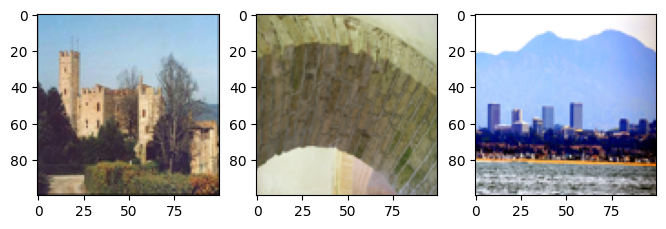

In [9]:

# Mostrar un número aleatorio de imágenes
num_imgs_to_show = 3
random_imgs = sample(imgs_resized, num_imgs_to_show)

fig = plt.figure(figsize=(8, 8))
columns = 3
rows = num_imgs_to_show
for i in range(1, columns * rows + 1):
    try:
        img = random_imgs[i-1]
        fig.add_subplot(rows, columns, i)
        plt.imshow(img)
    except IndexError:
        break
plt.show()

## 2.3 Conversión de imágenes a array NumPy

In [10]:
# Convertir la lista de imágenes redimensionadas a un array NumPy
imgs_array = np.array(imgs_resized)

# Normalizar los valores de los píxeles a un rango de 0 a 1
imgs_array = imgs_array / 255.0

# Ajustar la forma del array
imgs_array = imgs_array.reshape(-1, 100, 100, 3)

In [11]:
print(type(imgs_array))

<class 'numpy.ndarray'>


In [12]:
imgs_array.shape # Esa es la forma del array de las imágenes redimensionadas y normalizadas. Tiene una longitud de 18423 imágenes, cada una de tamaño 100x100 píxeles y 3 canales de color (rojo, verde y azul). Ahora, estás listo para construir tu modelo de colorización de imágenes.

(18423, 100, 100, 3)

# 3 Conversión de imágenes a escala de Grises

In [13]:
# Convertir las imágenes a escala de grises
imgs_gray = np.dot(imgs_array[...,:3], [0.2989, 0.5870, 0.1140])
# Estos números [0.2989, 0.5870, 0.1140] son los pesos utilizados para convertir una imagen a escala de grises utilizando una combinación lineal de los valores de los canales de color rojo, verde y azul (RGB).

In [14]:
imgs_gray.shape

(18423, 100, 100)

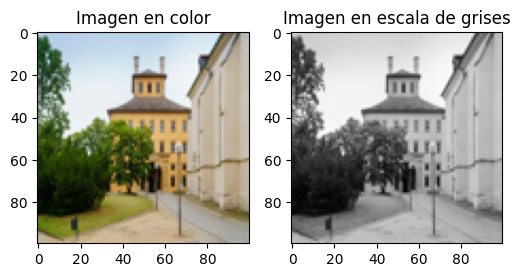

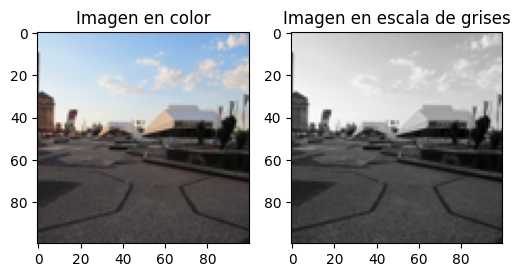

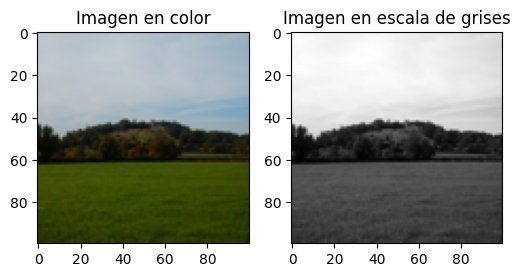

In [15]:
# Iterar sobre cada par de imágenes y mostrarlas
for i in range(3):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(6, 3))
    # Mostrar la imagen en color
    axes[0].imshow(imgs_array[i])
    axes[0].set_title("Imagen en color")
    # Mostrar la imagen en escala de grises
    axes[1].imshow(imgs_gray[i], cmap='gray')
    axes[1].set_title("Imagen en escala de grises")
    plt.show()


# 4 Normalización

In [16]:
# Verificar que los valores estén normalizados
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(imgs_array), np.max(imgs_array)))
print("Valores de imgs_gray: mínimo = {}, máximo = {}".format(np.min(imgs_gray), np.max(imgs_gray)))

Valores de imgs_array: mínimo = 0.0, máximo = 1.0
Valores de imgs_gray: mínimo = 0.0, máximo = 0.9998999999999999


# 5 Train y test

In [17]:
# Dividir los datos en entrenamiento y prueba
X_train_gray, X_test_gray, X_train, X_test = train_test_split(imgs_gray, imgs_array, test_size=0.2)

In [18]:
print("Dimensiones de X_train_gray:", X_train_gray.shape)
print("Dimensiones de X_test_gray:", X_test_gray.shape)
print("Dimensiones de X_train:", X_train.shape)
print("Dimensiones de X_test:", X_test.shape)

Dimensiones de X_train_gray: (14738, 100, 100)
Dimensiones de X_test_gray: (3685, 100, 100)
Dimensiones de X_train: (14738, 100, 100, 3)
Dimensiones de X_test: (3685, 100, 100, 3)


In [19]:
np.save('X_train_gray.npy', X_train_gray)
np.save('X_test_gray.npy', X_test_gray)
np.save('X_train.npy', X_train)
np.save('X_test.npy', X_test)

In [3]:
import numpy as np

# Cargar los conjuntos de datos desde los archivos .npy
X_train_gray = np.load('X_train_gray.npy')
X_test_gray = np.load('X_test_gray.npy')
X_train = np.load('X_train.npy')
X_test = np.load('X_test.npy')

# 6 MODELO 0

In [6]:
# Entrada en escala de grises de 100 x 100 píxeles
input_shape = (100, 100, 1)

model = Sequential()

# Codificador
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape))
model.add(Conv2D(64, (3, 3), activation='relu', strides=2, padding='same'))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(32, (3, 3), activation='relu', strides=2, padding='same'))

# Decodificador
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(3, (3, 3), activation='sigmoid', padding='same'))

model.compile(optimizer='adam', loss='mse')

# Mostrar el resumen de la red neuronal
model.summary()
    

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 100, 100, 64)      640       
                                                                 
 conv2d_1 (Conv2D)           (None, 50, 50, 64)        36928     
                                                                 
 conv2d_2 (Conv2D)           (None, 50, 50, 32)        18464     
                                                                 
 conv2d_3 (Conv2D)           (None, 25, 25, 32)        9248      
                                                                 
 conv2d_4 (Conv2D)           (None, 25, 25, 32)        9248      
                                                                 
 up_sampling2d (UpSampling2D  (None, 50, 50, 32)       0         
 )                                                               
                                                        

# 7 TEST VALIDATION

In [5]:
# Entrenamiento del modelo
epochs = 10
batch_size = 32

history = model.fit(X_train_gray, X_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test_gray, X_test))


Epoch 1/10
461/461 [==============================] - 570s 1s/step - loss: 0.0126 - val_loss: 0.0085
Epoch 2/10
461/461 [==============================] - 541s 1s/step - loss: 0.0082 - val_loss: 0.0078
Epoch 3/10
461/461 [==============================] - 513s 1s/step - loss: 0.0073 - val_loss: 0.0086
Epoch 4/10
461/461 [==============================] - 536s 1s/step - loss: 0.0069 - val_loss: 0.0065
Epoch 5/10
461/461 [==============================] - 544s 1s/step - loss: 0.0065 - val_loss: 0.0063
Epoch 6/10
461/461 [==============================] - 533s 1s/step - loss: 0.0063 - val_loss: 0.0063
Epoch 7/10
461/461 [==============================] - 512s 1s/step - loss: 0.0061 - val_loss: 0.0059
Epoch 8/10
461/461 [==============================] - 510s 1s/step - loss: 0.0059 - val_loss: 0.0060
Epoch 9/10
461/461 [==============================] - 509s 1s/step - loss: 0.0058 - val_loss: 0.0057
Epoch 10/10
461/461 [==============================] - 509s 1s/step - loss: 0.0057 - val_lo

In [6]:
df_history = pd.DataFrame(history.history)
df_history.to_csv('history_modelo_finetuning.csv', index=False)

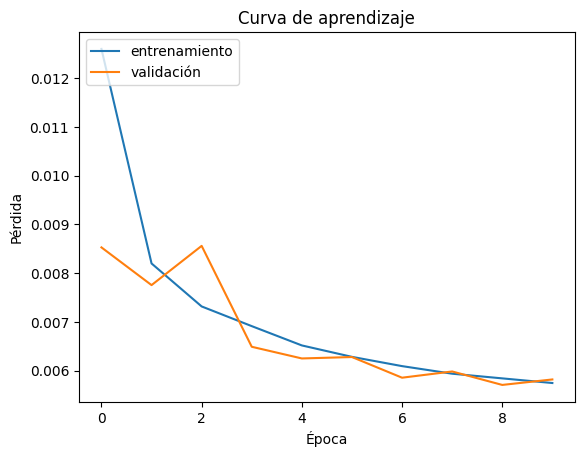

In [7]:
# Graficar la curva de aprendizaje
plt.plot(df_history['loss'])
plt.plot(df_history['val_loss'])
plt.title('Curva de aprendizaje')
plt.ylabel('Pérdida')
plt.xlabel('Época')
plt.legend(['entrenamiento', 'validación'], loc='upper left')
plt.show()


In [17]:
model.save("modelo0.h5")

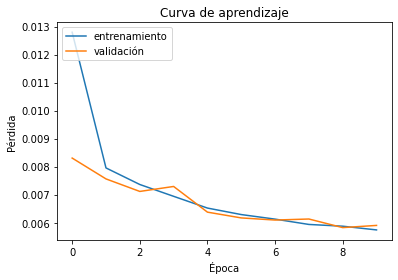

In [56]:
# Cargar el modelo
modelo0 = load_model('modelo0.h5')

# Cargar la historia de entrenamiento desde un archivo CSV
df_history = pd.read_csv('history_modelo0.csv')

# Graficar la curva de aprendizaje
plt.plot(df_history['loss'])
plt.plot(df_history['val_loss'])
plt.title('Curva de aprendizaje')
plt.ylabel('Pérdida')
plt.xlabel('Época')
plt.legend(['entrenamiento', 'validación'], loc='upper left')
plt.show()


In [58]:
result = modelo0.evaluate(X_test_gray, X_test)
print("Pérdida en datos de prueba: ", result)

116/116 [==============================] - 341s 3s/step - loss: 0.0059
Pérdida en datos de prueba:  0.005902362521737814


In [59]:
y_pred = modelo0.predict(X_test_gray)
# Comparar las predicciones con las etiquetas verdaderas
# y calcular cualquier métrica de rendimiento adicional que necesites

In [60]:
X_sample = X_test_gray[:5]
y_sample = y_pred[:5]

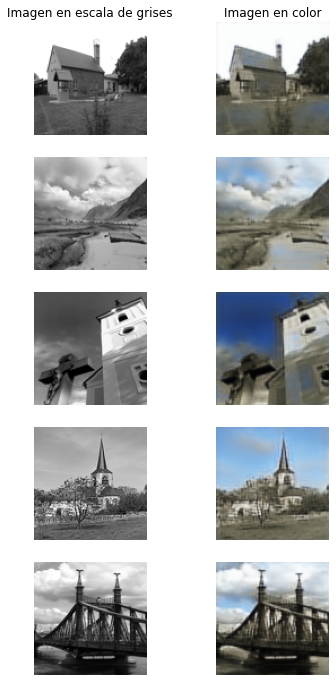

In [61]:
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(6, 12))

# Mostrar las imágenes de entrada y salida 
for i in range(5):
    ax[i, 0].imshow(X_sample[i], cmap='gray')
    ax[i, 1].imshow(y_sample[i])
    ax[i, 0].axis('off')
    ax[i, 1].axis('off')

# Etiquetar las subfiguras
ax[0, 0].set_title('Imagen en escala de grises')
ax[0, 1].set_title('Imagen en color')

plt.show()

# 8. COLOREAR FOTOS DE TERRASSA CON MODELO 0

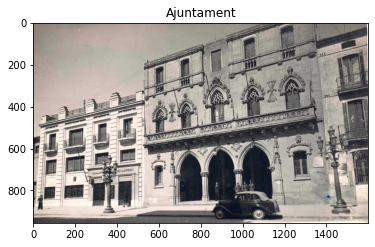

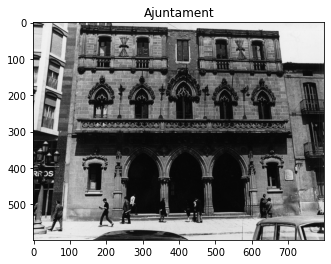

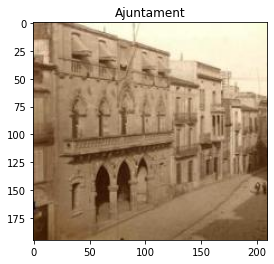

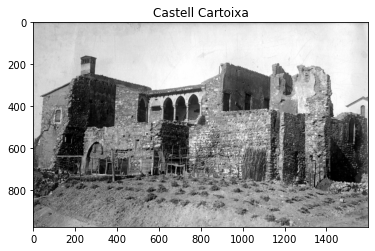

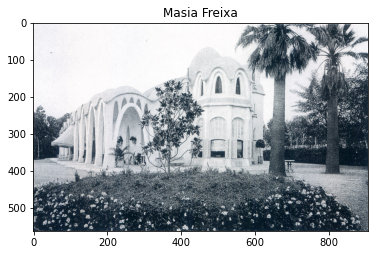

...

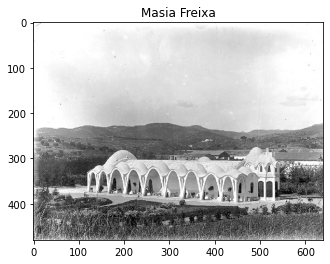

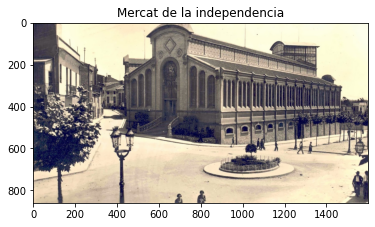

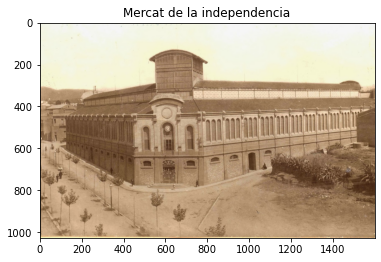

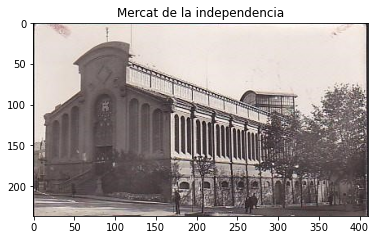

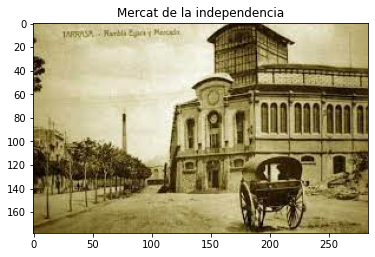

In [68]:
import os
import cv2
import matplotlib.pyplot as plt

def load_images(path):
    images = {}
    for monumento in os.listdir(path):
        images[monumento] = []
        monumento_path = os.path.join(path, monumento)
        for filename in os.listdir(monumento_path):
            if filename.endswith('.jpg'):
                img_path = os.path.join(monumento_path, filename)
                img = cv2.imread(img_path)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                images[monumento].append(img)
                plt.figure()
                plt.imshow(img)
                plt.title(monumento)
    return images

path = 'Terrassa antiga'
images = load_images(path)


In [8]:
# Función para cargar las imágenes y redimensionarlas a 100x100
def cargar_imagenes(path):
    imagenes = []
    for monumento in os.listdir(path):
        monumento_path = os.path.join(path, monumento)
        for filename in os.listdir(monumento_path):
            if filename.endswith('.jpg'):
                img_path = os.path.join(monumento_path, filename)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                img_100x100 = cv2.resize(img, (100, 100))
                imagenes.append(img_100x100)
    return np.array(imagenes)

In [9]:
imagenes_Terrassa = cargar_imagenes('Terrassa antiga')
print(imagenes_Terrassa.shape)

(11, 100, 100)


In [10]:
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(imagenes_Terrassa), np.max(imagenes_Terrassa)))

Valores de imgs_array: mínimo = 0, máximo = 255


In [11]:
imagenes_Terrassa_norm = imagenes_Terrassa/255.0

In [12]:
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(imagenes_Terrassa_norm), np.max(imagenes_Terrassa_norm)))

Valores de imgs_array: mínimo = 0.0, máximo = 1.0


In [13]:
# Hacer las predicciones
reconstrucciones = model.predict(imagenes_Terrassa_norm)

1/1 [==============================] - 1s 1s/step


Terrassa en blanco y negro	Terrassa en color


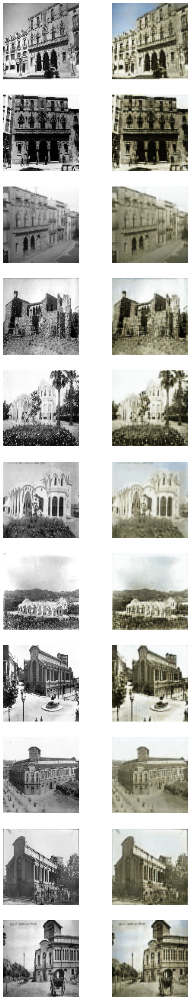

In [14]:
import matplotlib.pyplot as plt

# Crear una figura con dos subplots
fig, axs = plt.subplots(nrows=11, ncols=2, figsize=(8, 40))

print("Terrassa en blanco y negro\tTerrassa en color")

# Iterar sobre las imágenes y sus reconstrucciones y mostrarlas en los subplots
for i in range(11):
    axs[i, 0].imshow(imagenes_Terrassa_norm[i], cmap='gray')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(reconstrucciones[i])
    axs[i, 1].axis('off')

# Mostrar la figura
plt.show()


In [15]:
# Crear una carpeta para guardar los resultados
if not os.path.exists("resultados"):
    os.makedirs("resultados")

# Iterar sobre las imágenes y sus reconstrucciones y guardarlas en la carpeta resultados
for i in range(len(imagenes_Terrassa_norm)):
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4)) # Crear una figura con dos subplots

# Mostrar las imágenes en los subplots
    axs[0].imshow(imagenes_Terrassa_norm[i], cmap='gray')
    axs[0].set_title("Terrassa en blanco y negro")
    axs[1].imshow(reconstrucciones[i])
    axs[1].set_title("Terrassa en color")

# Guardar la figura en la carpeta resultados con un nombre descriptivo
    plt.savefig(f"resultados/terrassa_{i}_colorized.png")
    
# Cerrar la figura
    plt.close(fig)


In [16]:
# Crear la carpeta "Resultados Ajuntament" si no existe
if not os.path.exists("resultados"):
    os.makedirs("resultados")

# Iterar sobre las imágenes y sus reconstrucciones y guardar solo las reconstrucciones en la carpeta "Resultados Ajuntament"
for i in range(len(imagenes_Terrassa_norm)):
    # Verificar si el archivo ya existe antes de guardarlo
    if not os.path.isfile(f"resultados/todassolo_{i}_colorized.png"):
        plt.imsave(f"resultados/todassolo_{i}_colorized.png", reconstrucciones[i])


# Fine-tunning con modelo 0

Fotografias actuales del Ayuntamiento de Terrassa

In [5]:
path = 'Terrassa ara'
valid_extensions = ['.jpg', '.jpeg', '.png', '.bmp']

# Inicializar listas para cada tipo de imagen
ajuntament_imgs = []
castell_cartoixa_imgs = []
masia_freixa_imgs = []
mercat_independencia_imgs = []

for root, dirs, files in os.walk(path):
    for filename in files:
        ext = os.path.splitext(filename)[1]
        if ext.lower() not in valid_extensions:
            continue

        img_path = os.path.join(root, filename)
        try:
            with Image.open(img_path) as img_ara:
                print(f'{filename} loaded')
                img_ara = img_ara.resize((100, 100)) # Redimensionar la imagen a 100x100 píxeles
                img_array_ara = np.array(img_ara)  # Convertir la imagen a un array NumPy

                # Agregar el array a la lista correspondiente según el tipo de imagen
                if 'Ajuntament' in root:
                    ajuntament_imgs.append(img_array_ara)
                elif 'Castell Cartoixa' in root:
                    castell_cartoixa_imgs.append(img_array_ara)
                elif 'Masia Freixa' in root:
                    masia_freixa_imgs.append(img_array_ara)
                elif 'Mercat de la independencia' in root:
                    mercat_independencia_imgs.append(img_array_ara)
        except OSError as e:
            print(f'Error al cargar la imagen {filename}: {e}')

print(f'Total de imágenes cargadas para Ajuntament: {len(ajuntament_imgs)}')
print(f'Total de imágenes cargadas para Castell Cartoixa: {len(castell_cartoixa_imgs)}')
print(f'Total de imágenes cargadas para Masia Freixa: {len(masia_freixa_imgs)}')
print(f'Total de imágenes cargadas para Mercat de la Independencia: {len(mercat_independencia_imgs)}')


02LluísMuncunillParellada-Ajuntament de Terrassa.JPG loaded
1200px-62_Ajuntament_de_Terrassa.jpg loaded
1200_1630920611GALAESPIN_04_(1).jpg loaded
1200_1630920612GALAESPIN_03 (1).jpg loaded
1200_1630920612GALAESPIN_03.jpg loaded
16019ec9-9d33-4e4b-8e0f-711c9c8bb828_alta-libre-aspect-ratio_default_0.jpg loaded
2515_1431456808.jpg loaded
4318703.jpg loaded
45af3924-609c-4639-a40a-c965a7f90001_alta-libre-aspect-ratio_default_0.jpg loaded
46616018545_8104c5e8af_b.jpg loaded
5fa4343924ce7.jpeg loaded
61900653_gBUjtFOooXfOWzfUGhOP_Dz_SSFu85uEwEwMAOsKM1A.jpg loaded
62_Ajuntament_de_Terrassa.jpg loaded
Ajuntament-de-Terrassa-vistes-Nebridi-Aroztegui-scaled.jpg loaded
ajuntament-terrassa (1).jpg loaded
Ajuntament-Terrassa-3.jpg loaded
ajuntament-terrassa.jpg loaded
ajuntament_0 (1).jpg loaded
ajuntament_0 (2).jpg loaded
ajuntament_0.jpg loaded
Ajuntament_de_Terrassa_(1) (1).jpg loaded
Ajuntament_de_Terrassa_(1).jpg loaded
ayuntamiento_terrasa.jpg loaded
default.jpg loaded
descarga.jpg loaded
e7

In [10]:
print(type(ajuntament_imgs))

<class 'list'>


In [6]:
# Convertir la lista de imágenes redimensionadas a un array NumPy
ajuntament_array_ara = np.array(ajuntament_imgs)
castell_cartoixa_array_ara = np.array(castell_cartoixa_imgs)
masia_freixa_array_ara = np.array(masia_freixa_imgs)
mercat_independencia_array_ara = np.array(mercat_independencia_imgs)


In [7]:
print(type(ajuntament_array_ara))

<class 'numpy.ndarray'>


In [8]:
ajuntament_array_ara.shape

(38, 100, 100, 3)

In [9]:
# Verificar que los valores estén normalizados
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(ajuntament_array_ara), np.max(ajuntament_array_ara)))
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(castell_cartoixa_array_ara), np.max(castell_cartoixa_array_ara)))
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(masia_freixa_array_ara), np.max(masia_freixa_array_ara)))
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(mercat_independencia_array_ara), np.max(mercat_independencia_array_ara)))


Valores de imgs_array: mínimo = 0, máximo = 255
Valores de imgs_array: mínimo = 0, máximo = 255
Valores de imgs_array: mínimo = 0, máximo = 255
Valores de imgs_array: mínimo = 0, máximo = 255


In [10]:
# Normalizar los valores de los píxeles a un rango de 0 a 1
ajuntament_array_ara = ajuntament_array_ara / 255.0
castell_cartoixa_array_ara = castell_cartoixa_array_ara / 255.0
masia_freixa_array_ara = masia_freixa_array_ara / 255.0
mercat_independencia_array_ara = mercat_independencia_array_ara / 255.0

In [11]:
# Verificar que los valores estén normalizados
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(ajuntament_array_ara), np.max(ajuntament_array_ara)))
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(castell_cartoixa_array_ara), np.max(castell_cartoixa_array_ara)))
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(masia_freixa_array_ara), np.max(masia_freixa_array_ara)))
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(mercat_independencia_array_ara), np.max(mercat_independencia_array_ara)))


Valores de imgs_array: mínimo = 0.0, máximo = 1.0
Valores de imgs_array: mínimo = 0.0, máximo = 1.0
Valores de imgs_array: mínimo = 0.0, máximo = 1.0
Valores de imgs_array: mínimo = 0.0, máximo = 1.0


In [12]:
# Convertir las imágenes a escala de grises
ajuntament_gray_ara = np.dot(ajuntament_array_ara[...,:3], [0.2989, 0.5870, 0.1140])
castell_cartoixa_gray_ara = np.dot(castell_cartoixa_array_ara[...,:3], [0.2989, 0.5870, 0.1140])
masia_freixa_gray_ara = np.dot(masia_freixa_array_ara[...,:3], [0.2989, 0.5870, 0.1140])
mercat_independencia_gray_ara = np.dot(mercat_independencia_array_ara[...,:3], [0.2989, 0.5870, 0.1140])

In [18]:
# Guardar los vectores en formato NumPy
np.save("ajuntament_array_ara.npy", ajuntament_array_ara)
np.save("castell_cartoixa_array_ara.npy", castell_cartoixa_array_ara)
np.save("masia_freixa_array_ara.npy", masia_freixa_array_ara)
np.save("mercat_independencia_array_ara.npy", mercat_independencia_array_ara)
np.save("ajuntament_gray_ara.npy", ajuntament_gray_ara)
np.save("castell_cartoixa_gray_ara.npy", castell_cartoixa_gray_ara)
np.save("masia_freixa_gray_ara.npy", masia_freixa_gray_ara)
np.save("mercat_independencia_gray_ara.npy", mercat_independencia_gray_ara)

In [6]:
ajuntament_array_ara = np.load('ajuntament_array_ara.npy')
ajuntament_gray_ara = np.load('ajuntament_gray_ara.npy')
castell_cartoixa_array_ara = np.load('castell_cartoixa_array_ara.npy')
castell_cartoixa_gray_ara = np.load('castell_cartoixa_gray_ara.npy')
masia_freixa_array_ara = np.load('masia_freixa_array_ara.npy')
masia_freixa_gray_ara = np.load('masia_freixa_gray_ara.npy')
mercat_independencia_array_ara = np.load('mercat_independencia_array_ara.npy')
mercat_independencia_gray_ara = np.load('mercat_independencia_gray_ara.npy')

In [26]:
ajuntament_gray_ara.shape

(38, 100, 100)

In [27]:
X_train_gray.shape

(14738, 100, 100)

In [13]:
train_ajuntament = np.concatenate((X_train, ajuntament_array_ara), axis=0)
train_castell_cartoixa= np.concatenate((X_train, castell_cartoixa_array_ara), axis=0)
train_masia_freixa= np.concatenate((X_train, masia_freixa_array_ara), axis=0)
train_mercat_independencia=np.concatenate((X_train, mercat_independencia_array_ara), axis=0)


In [14]:
train_ajuntament_gray = np.concatenate((X_train_gray, ajuntament_gray_ara), axis=0)
train_castell_cartoixa_gray= np.concatenate((X_train_gray, castell_cartoixa_gray_ara), axis=0)
train_masia_freixa_gray= np.concatenate((X_train_gray, masia_freixa_gray_ara), axis=0)
train_mercat_independencia_gray=np.concatenate((X_train_gray, mercat_independencia_gray_ara), axis=0)

In [22]:
# Guardar los vectores
np.save('train_ajuntament.npy', train_ajuntament)
np.save('train_castell_cartoixa.npy', train_castell_cartoixa)
np.save('train_masia_freixa.npy', train_masia_freixa)
np.save('train_mercat_independencia.npy', train_mercat_independencia)
np.save('train_ajuntament_gray.npy', train_ajuntament_gray)
np.save('train_castell_cartoixa_gray.npy', train_castell_cartoixa_gray)
np.save('train_masia_freixa_gray.npy', train_masia_freixa_gray)
np.save('train_mercat_independencia_gray.npy', train_mercat_independencia_gray)

## AJUNTAMENT DE TERRASSA

In [4]:
train_ajuntament = np.load('train_ajuntament.npy')
train_ajuntament_gray = np.load('train_ajuntament_gray.npy')
X_test_gray = np.load('X_test_gray.npy')
X_test = np.load('X_test.npy')

In [5]:
# Entrenamiento del modelo
epochs = 10
batch_size = 32

history10 = model.fit(train_ajuntament_gray, train_ajuntament, epochs=epochs, batch_size=batch_size, validation_data=(X_test_gray, X_test))

Epoch 1/10
462/462 [==============================] - 548s 1s/step - loss: 0.0127 - val_loss: 0.0084
Epoch 2/10
462/462 [==============================] - 518s 1s/step - loss: 0.0079 - val_loss: 0.0076
Epoch 3/10
462/462 [==============================] - 512s 1s/step - loss: 0.0074 - val_loss: 0.0070
Epoch 4/10
462/462 [==============================] - 508s 1s/step - loss: 0.0069 - val_loss: 0.0065
Epoch 5/10
462/462 [==============================] - 509s 1s/step - loss: 0.0065 - val_loss: 0.0061
Epoch 6/10
462/462 [==============================] - 506s 1s/step - loss: 0.0063 - val_loss: 0.0064
Epoch 7/10
462/462 [==============================] - 515s 1s/step - loss: 0.0060 - val_loss: 0.0061
Epoch 8/10
462/462 [==============================] - 509s 1s/step - loss: 0.0059 - val_loss: 0.0061
Epoch 9/10
462/462 [==============================] - 512s 1s/step - loss: 0.0058 - val_loss: 0.0056
Epoch 10/10
462/462 [==============================] - 510s 1s/step - loss: 0.0057 - val_lo

In [6]:
df_history10 = pd.DataFrame(history10.history)
df_history10.to_csv('history_modelo_finetuning_10.csv', index=False)

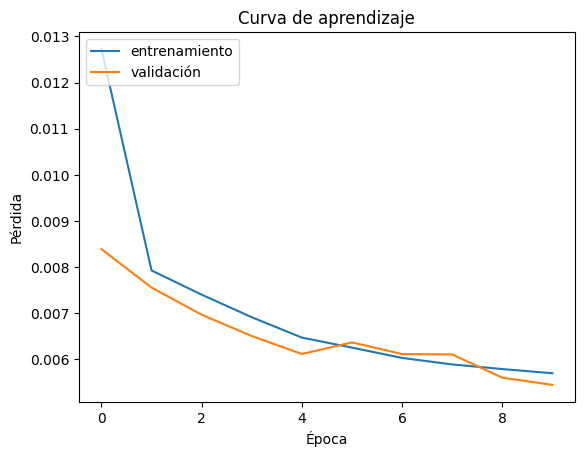

In [7]:
# Graficar la curva de aprendizaje
plt.plot(df_history10['loss'])
plt.plot(df_history10['val_loss'])
plt.title('Curva de aprendizaje')
plt.ylabel('Pérdida')
plt.xlabel('Época')
plt.legend(['entrenamiento', 'validación'], loc='upper left')
plt.show()

In [15]:
def cargar_imagenes(path):
    imagenes = []
    ajuntament_path = os.path.join(path, 'Ajuntament')
    for filename in os.listdir(ajuntament_path):
        if filename.endswith('.jpg') or filename.endswith('.jpeg'):
            img_path = os.path.join(ajuntament_path, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            img_100x100 = cv2.resize(img, (100, 100))
            imagenes.append(img_100x100)
    return np.array(imagenes)

imagenes_Terrassa_ajuntament = cargar_imagenes('Terrassa antiga')
print(imagenes_Terrassa_ajuntament.shape)
imagenes_Terrassa_ajuntament_norm = imagenes_Terrassa_ajuntament/255.0

(4, 100, 100)


In [12]:
reconstrucciones_ajuntament = model.predict(imagenes_Terrassa_ajuntament_norm)

1/1 [==============================] - 1s 713ms/step


Ajuntament de Terrassa en blanco y negro	 Ajuntament de Terrassa en color


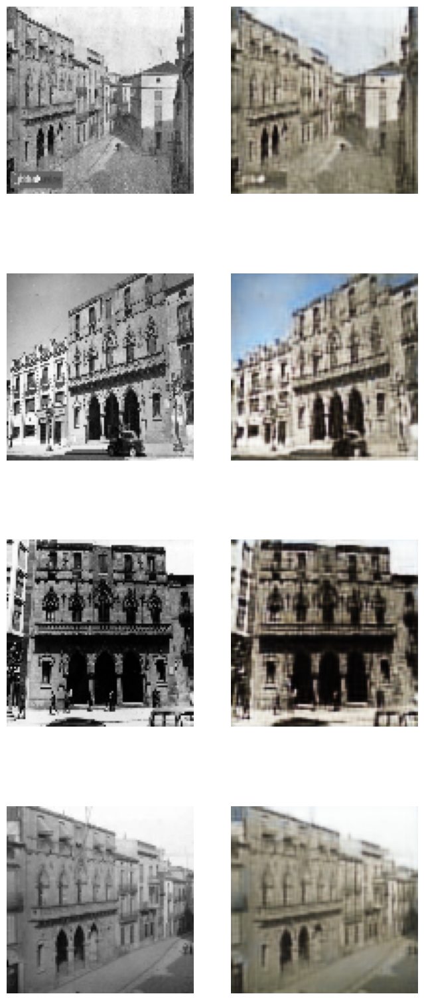

In [15]:
import matplotlib.pyplot as plt

# Crear una figura con dos subplots
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(8, 20))

print("Ajuntament de Terrassa en blanco y negro\t Ajuntament de Terrassa en color")

# Iterar sobre las imágenes y sus reconstrucciones y mostrarlas en los subplots
for i in range(4):
    axs[i, 0].imshow(imagenes_Terrassa_ajuntament_norm[i], cmap='gray')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(reconstrucciones_ajuntament[i])
    axs[i, 1].axis('off')

# Mostrar la figura
plt.show()


In [19]:
# Crear una carpeta para guardar los resultados
if not os.path.exists("Resultados Ajuntament"):
    os.makedirs("Resultados Ajuntament")

# Iterar sobre las imágenes y sus reconstrucciones y guardarlas en la carpeta resultados
for i in range(len(imagenes_Terrassa_ajuntament_norm)):
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4)) # Crear una figura con dos subplots

    # Mostrar las imágenes en los subplots
    axs[0].imshow(imagenes_Terrassa_ajuntament_norm[i], cmap='gray')
    axs[0].set_title("Ajuntament de Terrassa en blanco y negro")
    axs[1].imshow(reconstrucciones_ajuntament[i])
    axs[1].set_title("Ajuntament de Terrassa en color")

    # Guardar la figura en la carpeta resultados con un nombre descriptivo
    plt.savefig(f"Resultados Ajuntament/ajuntament_{i}_colorized.png")

    
    # Cerrar la figura
    plt.close(fig)


In [22]:
# Crear la carpeta "Resultados Ajuntament" si no existe
if not os.path.exists("Resultados Ajuntament"):
    os.makedirs("Resultados Ajuntament")

# Iterar sobre las imágenes y sus reconstrucciones y guardar solo las reconstrucciones en la carpeta "Resultados Ajuntament"
for i in range(len(imagenes_Terrassa_ajuntament_norm)):
    # Verificar si el archivo ya existe antes de guardarlo
    if not os.path.isfile(f"Resultados Ajuntament/ajuntamentsolo_{i}_colorized.png"):
        plt.imsave(f"Resultados Ajuntament/ajuntamentsolo_{i}_colorized.png", reconstrucciones_ajuntament[i])


## CASTELL CARTOIXA

In [23]:
train_castell_cartoixa = np.load('train_castell_cartoixa.npy')
train_castell_cartoixa_gray = np.load('train_castell_cartoixa_gray.npy')
X_test_gray = np.load('X_test_gray.npy')
X_test = np.load('X_test.npy')

In [24]:
# Entrenamiento del modelo
epochs = 10
batch_size = 32

history11 = model.fit(train_castell_cartoixa_gray, train_castell_cartoixa, epochs=epochs, batch_size=batch_size, validation_data=(X_test_gray, X_test))

Epoch 1/10
462/462 [==============================] - 561s 1s/step - loss: 0.0056 - val_loss: 0.0055
Epoch 2/10
462/462 [==============================] - 521s 1s/step - loss: 0.0055 - val_loss: 0.0055
Epoch 3/10
462/462 [==============================] - 512s 1s/step - loss: 0.0055 - val_loss: 0.0053
Epoch 4/10
462/462 [==============================] - 520s 1s/step - loss: 0.0055 - val_loss: 0.0055
Epoch 5/10
462/462 [==============================] - 508s 1s/step - loss: 0.0054 - val_loss: 0.0054
Epoch 6/10
462/462 [==============================] - 510s 1s/step - loss: 0.0053 - val_loss: 0.0054
Epoch 7/10
462/462 [==============================] - 509s 1s/step - loss: 0.0053 - val_loss: 0.0053
Epoch 8/10
462/462 [==============================] - 523s 1s/step - loss: 0.0053 - val_loss: 0.0052
Epoch 9/10
462/462 [==============================] - 525s 1s/step - loss: 0.0052 - val_loss: 0.0052
Epoch 10/10
462/462 [==============================] - 511s 1s/step - loss: 0.0051 - val_lo

In [25]:
df_history11 = pd.DataFrame(history11.history)
df_history11.to_csv('history_modelo_finetuning_11.csv', index=False)

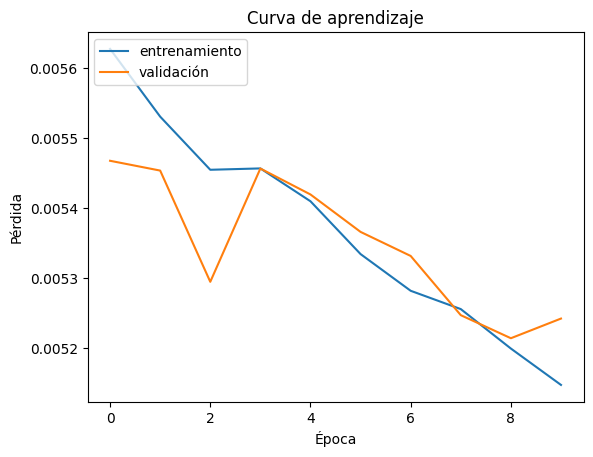

In [26]:
# Graficar la curva de aprendizaje
plt.plot(df_history11['loss'])
plt.plot(df_history11['val_loss'])
plt.title('Curva de aprendizaje')
plt.ylabel('Pérdida')
plt.xlabel('Época')
plt.legend(['entrenamiento', 'validación'], loc='upper left')
plt.show()

In [30]:
def cargar_imagenes(path):
    imagenes = []
    ajuntament_path = os.path.join(path, 'Castell Cartoixa')
    for filename in os.listdir(ajuntament_path):
        if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
            img_path = os.path.join(ajuntament_path, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            img_100x100 = cv2.resize(img, (100, 100))
            imagenes.append(img_100x100)
    return np.array(imagenes)

imagenes_Terrassa_castell = cargar_imagenes('Terrassa antiga')
print(imagenes_Terrassa_castell.shape)
imagenes_Terrassa_castell_norm = imagenes_Terrassa_castell/255.0

(3, 100, 100)


In [31]:
reconstrucciones_castell = model.predict(imagenes_Terrassa_castell_norm)

1/1 [==============================] - 0s 68ms/step


Castell de Terrassa en blanco y negro	 Castell en color


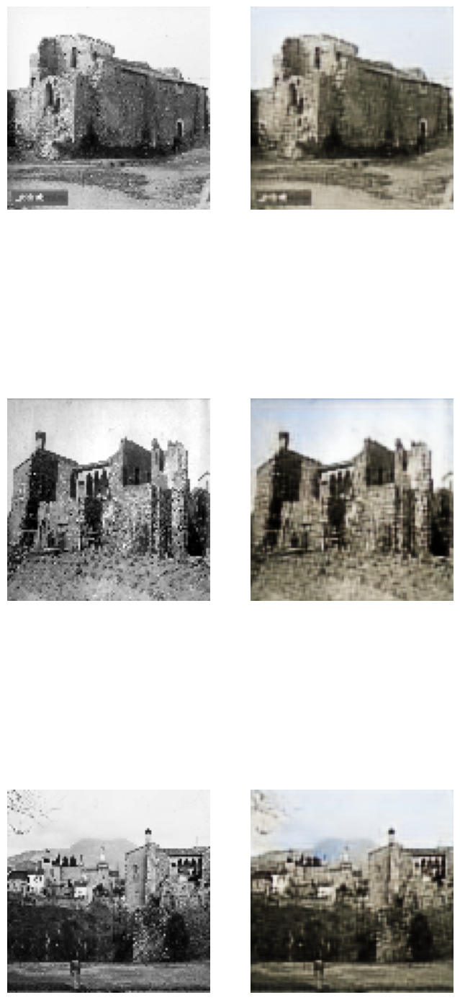

In [33]:
# Crear una figura con dos subplots
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(8, 20))

print("Castell de Terrassa en blanco y negro\t Castell en color")

# Iterar sobre las imágenes y sus reconstrucciones y mostrarlas en los subplots
for i in range(3):
    axs[i, 0].imshow(imagenes_Terrassa_castell_norm[i], cmap='gray')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(reconstrucciones_castell[i])
    axs[i, 1].axis('off')

# Mostrar la figura
plt.show()

In [34]:
# Crear una carpeta para guardar los resultados
if not os.path.exists("Resultados Castell"):
    os.makedirs("Resultados Castell")

# Iterar sobre las imágenes y sus reconstrucciones y guardarlas en la carpeta resultados
for i in range(len(imagenes_Terrassa_castell_norm)):
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4)) # Crear una figura con dos subplots

    # Mostrar las imágenes en los subplots
    axs[0].imshow(imagenes_Terrassa_castell_norm[i], cmap='gray')
    axs[0].set_title("Castell en blanco y negro")
    axs[1].imshow(reconstrucciones_castell[i])
    axs[1].set_title("Castell en color")

    # Guardar la figura en la carpeta resultados con un nombre descriptivo
    plt.savefig(f"Resultados Castell/Castell_{i}_colorized.png")

    
    # Cerrar la figura
    plt.close(fig)


In [35]:
# Crear la carpeta "Resultados Ajuntament" si no existe
if not os.path.exists("Resultados Castell"):
    os.makedirs("Resultados Castell")

# Iterar sobre las imágenes y sus reconstrucciones y guardar solo las reconstrucciones en la carpeta "Resultados Ajuntament"
for i in range(len(imagenes_Terrassa_castell_norm)):
    # Verificar si el archivo ya existe antes de guardarlo
    if not os.path.isfile(f"Resultados Castell/Castellsolo_{i}_colorized.png"):
        plt.imsave(f"Resultados Castell/Castellsolo_{i}_colorized.png", reconstrucciones_castell[i])


# MASIA FREIXA

In [36]:
train_masia = np.load('train_masia_freixa.npy')
train_masia_gray = np.load('train_masia_freixa_gray.npy')
X_test_gray = np.load('X_test_gray.npy')
X_test = np.load('X_test.npy')

In [37]:
# Entrenamiento del modelo
epochs = 10
batch_size = 32

history12 = model.fit(train_masia_gray, train_masia, epochs=epochs, batch_size=batch_size, validation_data=(X_test_gray, X_test))

Epoch 1/10
462/462 [==============================] - 554s 1s/step - loss: 0.0051 - val_loss: 0.0052
Epoch 2/10
462/462 [==============================] - 514s 1s/step - loss: 0.0051 - val_loss: 0.0049
Epoch 3/10
462/462 [==============================] - 508s 1s/step - loss: 0.0051 - val_loss: 0.0050
Epoch 4/10
462/462 [==============================] - 506s 1s/step - loss: 0.0050 - val_loss: 0.0054
Epoch 5/10
462/462 [==============================] - 506s 1s/step - loss: 0.0050 - val_loss: 0.0049
Epoch 6/10
462/462 [==============================] - 506s 1s/step - loss: 0.0051 - val_loss: 0.0049
Epoch 7/10
462/462 [==============================] - 511s 1s/step - loss: 0.0050 - val_loss: 0.0050
Epoch 8/10
462/462 [==============================] - 507s 1s/step - loss: 0.0049 - val_loss: 0.0049
Epoch 9/10
462/462 [==============================] - 506s 1s/step - loss: 0.0049 - val_loss: 0.0048
Epoch 10/10
462/462 [==============================] - 512s 1s/step - loss: 0.0049 - val_lo

In [38]:
df_history12 = pd.DataFrame(history12.history)
df_history12.to_csv('history_modelo_finetuning_12.csv', index=False)

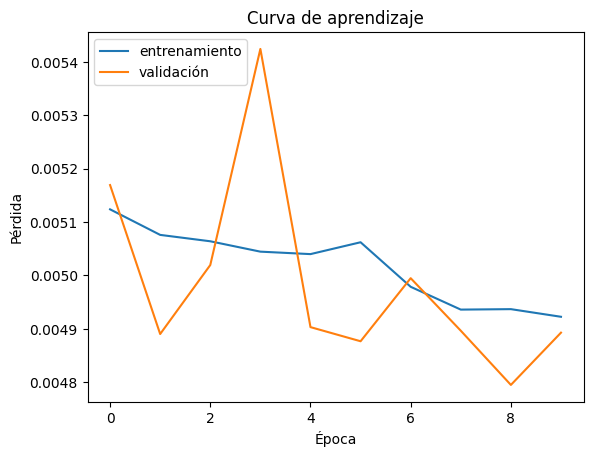

In [39]:
# Graficar la curva de aprendizaje
plt.plot(df_history12['loss'])
plt.plot(df_history12['val_loss'])
plt.title('Curva de aprendizaje')
plt.ylabel('Pérdida')
plt.xlabel('Época')
plt.legend(['entrenamiento', 'validación'], loc='upper left')
plt.show()

In [40]:
def cargar_imagenes(path):
    imagenes = []
    ajuntament_path = os.path.join(path, 'Masia Freixa')
    for filename in os.listdir(ajuntament_path):
        if filename.endswith('.jpg') or filename.endswith('.jpeg'):
            img_path = os.path.join(ajuntament_path, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            img_100x100 = cv2.resize(img, (100, 100))
            imagenes.append(img_100x100)
    return np.array(imagenes)

imagenes_Terrassa_masia = cargar_imagenes('Terrassa antiga')
print(imagenes_Terrassa_masia.shape)
imagenes_Terrassa_masia_norm = imagenes_Terrassa_masia/255.0

(3, 100, 100)


In [41]:
reconstrucciones_masia = model.predict(imagenes_Terrassa_masia_norm)

1/1 [==============================] - 0s 126ms/step


Masia de Terrassa en blanco y negro	 Masia en color


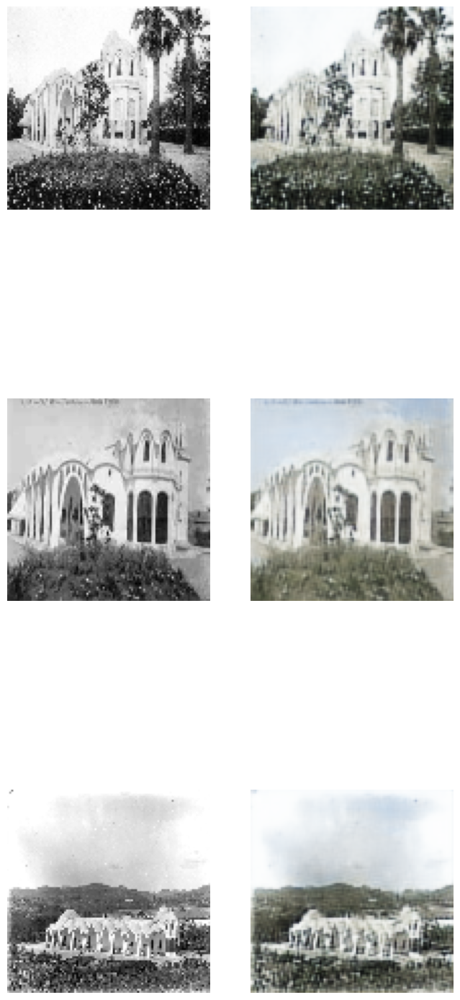

In [42]:
# Crear una figura con dos subplots
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(8, 20))

print("Masia de Terrassa en blanco y negro\t Masia en color")

# Iterar sobre las imágenes y sus reconstrucciones y mostrarlas en los subplots
for i in range(3):
    axs[i, 0].imshow(imagenes_Terrassa_masia_norm[i], cmap='gray')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(reconstrucciones_masia[i])
    axs[i, 1].axis('off')

# Mostrar la figura
plt.show()

In [45]:
# Crear una carpeta para guardar los resultados
if not os.path.exists("Resultados Masia"):
    os.makedirs("Resultados Masia")

# Iterar sobre las imágenes y sus reconstrucciones y guardarlas en la carpeta resultados
for i in range(len(imagenes_Terrassa_castell_norm)):
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4)) # Crear una figura con dos subplots

    # Mostrar las imágenes en los subplots
    axs[0].imshow(imagenes_Terrassa_masia_norm[i], cmap='gray')
    axs[0].set_title("Masia en blanco y negro")
    axs[1].imshow(reconstrucciones_masia[i])
    axs[1].set_title("Masia en color")

    # Guardar la figura en la carpeta resultados con un nombre descriptivo
    plt.savefig(f"Resultados Masia/Masia_{i}_colorized.png")

    
    # Cerrar la figura
    plt.close(fig)


In [47]:
# Crear la carpeta "Resultados Ajuntament" si no existe
if not os.path.exists("Resultados Masia"):
    os.makedirs("Resultados Masia")

# Iterar sobre las imágenes y sus reconstrucciones y guardar solo las reconstrucciones en la carpeta "Resultados Ajuntament"
for i in range(len(imagenes_Terrassa_masia_norm)):
    # Verificar si el archivo ya existe antes de guardarlo
    if not os.path.isfile(f"Resultados Masia/Masiasolo_{i}_colorized.png"):
        plt.imsave(f"Resultados Masia/Masiasolo_{i}_colorized.png", reconstrucciones_masia[i])


##  Mercat de la independencia

In [48]:
train_mercat = np.load('train_mercat_independencia.npy')
train_mercat_gray = np.load('train_mercat_independencia_gray.npy')
X_test_gray = np.load('X_test_gray.npy')
X_test = np.load('X_test.npy')

In [49]:
# Entrenamiento del modelo
epochs = 10
batch_size = 32

history13 = model.fit(train_mercat_gray, train_mercat, epochs=epochs, batch_size=batch_size, validation_data=(X_test_gray, X_test))

Epoch 1/10
462/462 [==============================] - 581s 1s/step - loss: 0.0049 - val_loss: 0.0048
Epoch 2/10
462/462 [==============================] - 520s 1s/step - loss: 0.0049 - val_loss: 0.0052
Epoch 3/10
462/462 [==============================] - 514s 1s/step - loss: 0.0049 - val_loss: 0.0051
Epoch 4/10
462/462 [==============================] - 510s 1s/step - loss: 0.0048 - val_loss: 0.0049
Epoch 5/10
462/462 [==============================] - 509s 1s/step - loss: 0.0048 - val_loss: 0.0049
Epoch 6/10
462/462 [==============================] - 511s 1s/step - loss: 0.0048 - val_loss: 0.0048
Epoch 7/10
462/462 [==============================] - 514s 1s/step - loss: 0.0048 - val_loss: 0.0048
Epoch 8/10
462/462 [==============================] - 511s 1s/step - loss: 0.0048 - val_loss: 0.0047
Epoch 9/10
462/462 [==============================] - 511s 1s/step - loss: 0.0048 - val_loss: 0.0047
Epoch 10/10
462/462 [==============================] - 509s 1s/step - loss: 0.0048 - val_lo

In [52]:
df_history13 = pd.DataFrame(history13.history)
df_history13.to_csv('history_modelo_finetuning_13.csv', index=False)

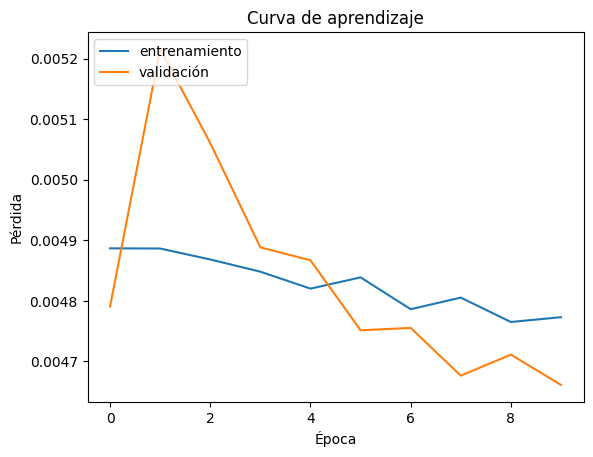

In [53]:
# Graficar la curva de aprendizaje
plt.plot(df_history13['loss'])
plt.plot(df_history13['val_loss'])
plt.title('Curva de aprendizaje')
plt.ylabel('Pérdida')
plt.xlabel('Época')
plt.legend(['entrenamiento', 'validación'], loc='upper left')
plt.show()

In [6]:
def cargar_imagenes(path):
    imagenes = []
    ajuntament_path = os.path.join(path, 'Mercat de la independencia')
    for filename in os.listdir(ajuntament_path):
        if filename.endswith('.jpg') or filename.endswith('.jpeg'):
            img_path = os.path.join(ajuntament_path, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            img_100x100 = cv2.resize(img, (100, 100))
            imagenes.append(img_100x100)
    return np.array(imagenes)

imagenes_Terrassa_mercat = cargar_imagenes('Terrassa antiga')
print(imagenes_Terrassa_mercat.shape)
imagenes_Terrassa_mercat_norm = imagenes_Terrassa_mercat/255.0

(4, 100, 100)


In [55]:
reconstrucciones_mercat = model.predict(imagenes_Terrassa_mercat_norm)

1/1 [==============================] - 0s 151ms/step


Masia de Terrassa en blanco y negro	 Masia en color


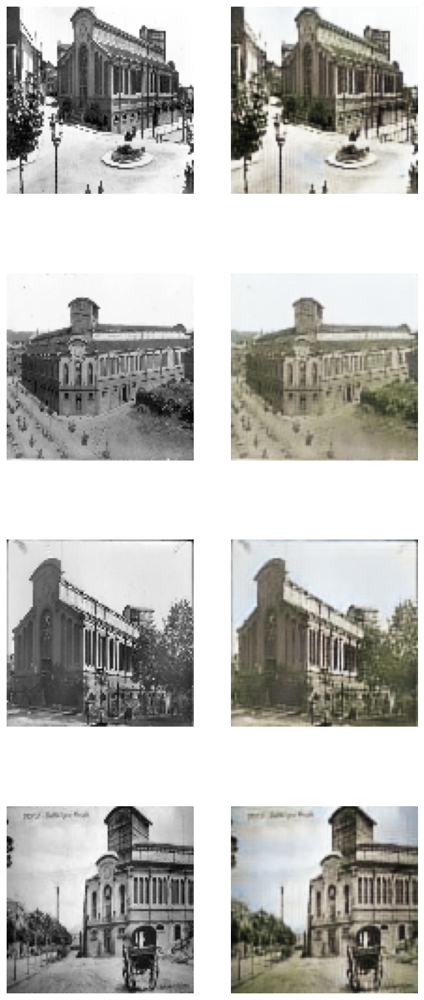

In [57]:
#Crear una figura con dos subplots
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(8, 20))

print("Masia de Terrassa en blanco y negro\t Masia en color")

# Iterar sobre las imágenes y sus reconstrucciones y mostrarlas en los subplots
for i in range(4):
    axs[i, 0].imshow(imagenes_Terrassa_mercat_norm[i], cmap='gray')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(reconstrucciones_mercat[i])
    axs[i, 1].axis('off')

# Mostrar la figura
plt.show()

In [58]:
# Crear una carpeta para guardar los resultados
if not os.path.exists("Resultados Mercat"):
    os.makedirs("Resultados Mercat")

# Iterar sobre las imágenes y sus reconstrucciones y guardarlas en la carpeta resultados
for i in range(len(imagenes_Terrassa_mercat_norm)):
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4)) # Crear una figura con dos subplots

    # Mostrar las imágenes en los subplots
    axs[0].imshow(imagenes_Terrassa_mercat_norm[i], cmap='gray')
    axs[0].set_title("Mercat de Terrassa en blanco y negro")
    axs[1].imshow(reconstrucciones_mercat[i])
    axs[1].set_title("Mercat de Terrassa en color")

    # Guardar la figura en la carpeta resultados con un nombre descriptivo
    plt.savefig(f"Resultados Mercat/mercat_{i}_colorized.png")

    
    # Cerrar la figura
    plt.close(fig)


In [59]:
# Crear la carpeta "Resultados Ajuntament" si no existe
if not os.path.exists("Resultados Mercat"):
    os.makedirs("Resultados Mercat")

# Iterar sobre las imágenes y sus reconstrucciones y guardar solo las reconstrucciones en la carpeta "Resultados Ajuntament"
for i in range(len(imagenes_Terrassa_mercat_norm)):
    # Verificar si el archivo ya existe antes de guardarlo
    if not os.path.isfile(f"Resultados Mercat/Mercatsolo_{i}_colorized.png"):
        plt.imsave(f"Resultados Mercat/Mercatsolo_{i}_colorized.png", reconstrucciones_mercat[i])


TODAS JUNTAS LAS IMÁGENES Y EN 252 X 252

In [4]:
path = 'Terrassa ara'
valid_extensions = ['.jpg', '.jpeg', '.png', '.bmp']
imgs_resized_ara = []

for root, dirs, files in os.walk(path):
    for filename in files:
        ext = os.path.splitext(filename)[1]
        if ext.lower() not in valid_extensions:
            continue

        img_path = os.path.join(root, filename)
        try:
            with Image.open(img_path) as img_ara:
                print(f'{filename} loaded')
                img_ara = img_ara.resize((252, 252)) # Redimensionar la imagen a 100x100 píxeles
                img_array_ara = np.array(img_ara)  # Convertir la imagen a un array NumPy
                imgs_resized_ara.append(img_array_ara)  # Agregar el array a la lista de imágenes redimensionada
        except OSError as e:
            print(f'Error al cargar la imagen {filename}: {e}')

print(f'Total de imágenes cargadas: {len(imgs_resized_ara)}')
print(f'Dimensión de las imágenes: {imgs_resized_ara[0].shape}')  # Verificar la dimensión de las imágenes


02LluísMuncunillParellada-Ajuntament de Terrassa.JPG loaded
1200px-62_Ajuntament_de_Terrassa.jpg loaded
1200_1630920611GALAESPIN_04_(1).jpg loaded
1200_1630920612GALAESPIN_03 (1).jpg loaded
1200_1630920612GALAESPIN_03.jpg loaded
16019ec9-9d33-4e4b-8e0f-711c9c8bb828_alta-libre-aspect-ratio_default_0.jpg loaded
2515_1431456808.jpg loaded
4318703.jpg loaded
45af3924-609c-4639-a40a-c965a7f90001_alta-libre-aspect-ratio_default_0.jpg loaded
46616018545_8104c5e8af_b.jpg loaded
5fa4343924ce7.jpeg loaded
61900653_gBUjtFOooXfOWzfUGhOP_Dz_SSFu85uEwEwMAOsKM1A.jpg loaded
62_Ajuntament_de_Terrassa.jpg loaded
Ajuntament-de-Terrassa-vistes-Nebridi-Aroztegui-scaled.jpg loaded
ajuntament-terrassa (1).jpg loaded
Ajuntament-Terrassa-3.jpg loaded
ajuntament-terrassa.jpg loaded
ajuntament_0 (1).jpg loaded
ajuntament_0 (2).jpg loaded
ajuntament_0.jpg loaded
Ajuntament_de_Terrassa_(1) (1).jpg loaded
Ajuntament_de_Terrassa_(1).jpg loaded
ayuntamiento_terrasa.jpg loaded
default.jpg loaded
descarga.jpg loaded
e7

In [10]:
# Convertir la lista de imágenes redimensionadas a un array NumPy
imgs_array_ara = np.array(imgs_resized_ara)

# Normalizar los valores de los píxeles a un rango de 0 a 1
imgs_array_ara = imgs_array_ara / 255.0

# Ajustar la forma del array
imgs_array_ara = imgs_array_ara.reshape(-1, 252, 252, 3)

In [11]:
print(type(imgs_array_ara))

<class 'numpy.ndarray'>


In [12]:
imgs_array_ara.shape

(112, 252, 252, 3)

In [13]:
# Verificar que los valores estén normalizados
print("Valores de imgs_array: mínimo = {}, máximo = {}".format(np.min(imgs_array_ara), np.max(imgs_array_ara)))
print("Valores de imgs_gray: mínimo = {}, máximo = {}".format(np.min(imgs_gray_ara), np.max(imgs_gray_ara)))

Valores de imgs_array: mínimo = 0.0, máximo = 1.0
Valores de imgs_gray: mínimo = 0.0, máximo = 0.9998999999999999


In [14]:
# Convertir las imágenes a escala de grises
imgs_gray_ara = np.dot(imgs_array_ara[...,:3], [0.2989, 0.5870, 0.1140])
# Estos números [0.2989, 0.5870, 0.1140] son los pesos utilizados para convertir una imagen a escala de grises utilizando una combinación lineal de los valores de los canales de color rojo, verde y azul (RGB).

In [15]:
# Dividir los datos en entrenamiento y prueba
X_train_gray_ara, X_test_gray_ara, X_train_ara, X_test_ara = train_test_split(imgs_gray_ara, imgs_array_ara, test_size=0.1)

In [16]:
print("Dimensiones de X_train_gray_ara:", X_train_gray_ara.shape)
print("Dimensiones de X_test_gray_ara:", X_test_gray_ara.shape)
print("Dimensiones de X_train_ara:", X_train_ara.shape)
print("Dimensiones de X_test_ara:", X_test_ara.shape)

Dimensiones de X_train_gray_ara: (100, 252, 252)
Dimensiones de X_test_gray_ara: (12, 252, 252)
Dimensiones de X_train_ara: (100, 252, 252, 3)
Dimensiones de X_test_ara: (12, 252, 252, 3)


In [17]:
print(type(X_train_gray_ara))

<class 'numpy.ndarray'>


In [18]:
# Entrada en escala de grises de 100 x 100 píxeles
input_shape = (252, 252, 1)

model1 = Sequential()

# Codificador
model1.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape))
model1.add(Conv2D(64, (3, 3), activation='relu', strides=2, padding='same'))
model1.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model1.add(Conv2D(32, (3, 3), activation='relu', strides=2, padding='same'))

# Decodificador
model1.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model1.add(UpSampling2D((2, 2)))
model1.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model1.add(UpSampling2D((2, 2)))
model1.add(Conv2D(3, (3, 3), activation='sigmoid', padding='same'))

model1.compile(optimizer='adam', loss='mse')

# Mostrar el resumen de la red neuronal
model1.summary()
    

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 252, 252, 64)      640       
                                                                 
 conv2d_8 (Conv2D)           (None, 126, 126, 64)      36928     
                                                                 
 conv2d_9 (Conv2D)           (None, 126, 126, 32)      18464     
                                                                 
 conv2d_10 (Conv2D)          (None, 63, 63, 32)        9248      
                                                                 
 conv2d_11 (Conv2D)          (None, 63, 63, 32)        9248      
                                                                 
 up_sampling2d_2 (UpSampling  (None, 126, 126, 32)     0         
 2D)                                                             
                                                      

In [19]:
epochs = 50
batch_size = 32
history2 = model1.fit(X_train_gray_ara, X_train_ara, epochs=epochs, batch_size=batch_size, validation_data=(X_test_gray_ara, X_test_ara))

Epoch 1/50
4/4 [==============================] - 28s 6s/step - loss: 0.0685 - val_loss: 0.0733
Epoch 2/50
4/4 [==============================] - 23s 5s/step - loss: 0.0621 - val_loss: 0.0676
Epoch 3/50
4/4 [==============================] - 26s 6s/step - loss: 0.0565 - val_loss: 0.0621
Epoch 4/50
4/4 [==============================] - 23s 5s/step - loss: 0.0508 - val_loss: 0.0532
Epoch 5/50
4/4 [==============================] - 23s 5s/step - loss: 0.0427 - val_loss: 0.0435
Epoch 6/50
4/4 [==============================] - 22s 5s/step - loss: 0.0324 - val_loss: 0.0295
Epoch 7/50
4/4 [==============================] - 21s 5s/step - loss: 0.0245 - val_loss: 0.0249
Epoch 8/50
4/4 [==============================] - 22s 5s/step - loss: 0.0209 - val_loss: 0.0244
Epoch 9/50
4/4 [==============================] - 21s 5s/step - loss: 0.0196 - val_loss: 0.0238
Epoch 10/50
4/4 [==============================] - 22s 5s/step - loss: 0.0190 - val_loss: 0.0228
Epoch 11/50
4/4 [======================

In [20]:
df_history2 = pd.DataFrame(history2.history)
df_history2.to_csv('history_modelo_finetuning.csv', index=False)

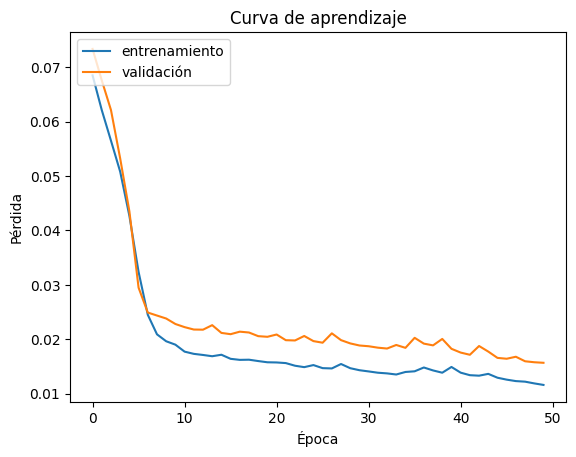

In [21]:
# Graficar la curva de aprendizaje
plt.plot(df_history2['loss'])
plt.plot(df_history2['val_loss'])
plt.title('Curva de aprendizaje')
plt.ylabel('Pérdida')
plt.xlabel('Época')
plt.legend(['entrenamiento', 'validación'], loc='upper left')
plt.show()

In [22]:
result1 = model1.evaluate(X_test_gray_ara, X_test_ara)
print("Pérdida en datos de prueba: ", result1)

1/1 [==============================] - 0s 399ms/step - loss: 0.0157
Pérdida en datos de prueba:  0.01568041741847992


In [31]:
def cargar_imagenes(path):
    imagenes = []
    for monumento in os.listdir(path):
        monumento_path = os.path.join(path, monumento)
        for filename in os.listdir(monumento_path):
            if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
                img_path = os.path.join(monumento_path, filename)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                img_100x100 = cv2.resize(img, (252, 252))
                imagenes.append(img_100x100)
    return np.array(imagenes)
imagenes_Terrassa_1 = cargar_imagenes('Terrassa antiga')
print(imagenes_Terrassa_1.shape)
imagenes_Terrassa_norm_1 = imagenes_Terrassa_1/255.0

(14, 252, 252)


In [32]:
# Hacer las predicciones
reconstrucciones1 = model1.predict(imagenes_Terrassa_norm_1)

1/1 [==============================] - 1s 638ms/step


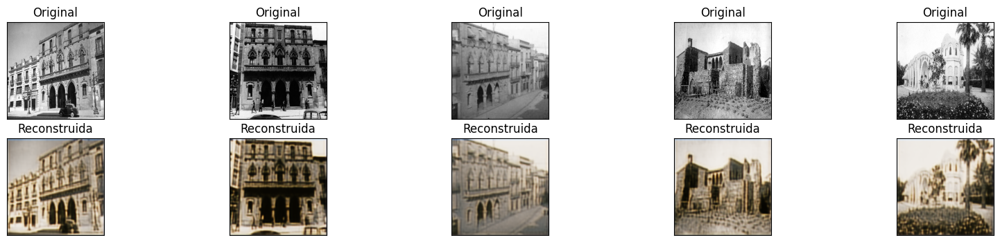

In [111]:
# Mostrar las imágenes
n = 5  # número de imágenes a mostrar
plt.figure(figsize=(20, 4))
for i in range(n):
    # mostrar la imagen original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(imagenes_Terrassa_norm_1[i])
    plt.title("Original")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # mostrar la imagen reconstruida
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(reconstrucciones1[i])
    plt.title("Reconstruida")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()


In [112]:
# Crear una carpeta para guardar los resultados
if not os.path.exists("Resultados_train_monumentos"):
    os.makedirs("Resultados_train_monumentos")

# Iterar sobre las imágenes y sus reconstrucciones y guardarlas en la carpeta resultados1
for i in range(len(imagenes_Terrassa_norm_1)):
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4)) # Crear una figura con dos subplots

    # Mostrar las imágenes en los subplots
    axs[0].imshow(imagenes_Terrassa_norm_1[i], cmap='gray')
    axs[0].set_title("Terrassa en blanco y negro")
    axs[1].imshow(reconstrucciones1[i])
    axs[1].set_title("Terrassa en color")

    # Guardar la figura en la carpeta resultados1 con un nombre descriptivo
    plt.savefig(f"resultados1/terrasa_{i}_colorized.png")
    
    # Cerrar la figura
    plt.close(fig)


In [34]:
# Iterar sobre las imágenes y sus reconstrucciones y guardar solo las reconstrucciones en la carpeta "Resultados Ajuntament"
for i in range(len(imagenes_Terrassa_norm_1)):
    # Verificar si el archivo ya existe antes de guardarlo
    if not os.path.isfile(f"Resultados_train_monumentos/entrenamentterrassa_{i}_colorized.png"):
        plt.imsave(f"Resultados_train_monumentos/entrenamentterrassa_{i}_colorized.png", reconstrucciones[i])

## Modelo 1 - Colorful Image Colorization:

El modelo Colorful Image Colorization fue desarrollado por Richard Zhang, Phillip Isola, and Alexei A. Efros en 2016, y se hizo famoso por su capacidad para agregar colores precisos a imágenes en blanco y negro utilizando técnicas avanzadas de aprendizaje profundo.

In [9]:
model_path  = 'C:/Users/Lidia/Desktop/TFG/colorization_release_v2.caffemodel'
prototxt_path  = 'C:/Users/Lidia/Desktop/TFG/colorization_deploy_v2.prototxt'
kernel_path = 'C:/Users/Lidia/Desktop/TFG/pts_in_hull.npy'
image_path='C:/Users/Lidia/Desktop/TFG/ajuntament_antic_internet.jpg'

# Cargar el modelo de Caffe
net = cv2.dnn.readNetFromCaffe(prototxt_path, model_path)

In [10]:
for i in range(net.getLayerNames().__len__()):
    print(i, net.getLayerNames()[i])

0 conv1_1
1 relu1_1
2 conv1_2
3 relu1_2
4 conv1_2norm
5 conv2_1
6 relu2_1
7 conv2_2
8 relu2_2
9 conv2_2norm
10 conv3_1
11 relu3_1
12 conv3_2
13 relu3_2
14 conv3_3
15 relu3_3
16 conv3_3norm
17 conv4_1
18 relu4_1
19 conv4_2
20 relu4_2
21 conv4_3
22 relu4_3
23 conv4_3norm
24 conv5_1
25 relu5_1
26 conv5_2
27 relu5_2
28 conv5_3
29 relu5_3
30 conv5_3norm
31 conv6_1
32 relu6_1
33 conv6_2
34 relu6_2
35 conv6_3
36 relu6_3
37 conv6_3norm
38 conv7_1
39 relu7_1
40 conv7_2
41 relu7_2
42 conv7_3
43 relu7_3
44 conv7_3norm
45 conv8_1
46 relu8_1
47 conv8_2
48 relu8_2
49 conv8_3
50 relu8_3
51 conv8_313
52 conv8_313_rh
53 class8_313_rh
54 class8_ab
55 Silence


In [9]:
image_folder = 'Terrassa antiga'

# Obtener todas las rutas a los archivos de imagen en la carpeta y sus subcarpetas

for root, dirs, files in os.walk(image_folder):
    for file in files:
        if file.endswith('.jpg') or file.endswith('.jpeg') or file.endswith('.png'):
            img_path = os.path.join(root, file)
            img = cv2.imread(img_path)
            print(f"Imagen: {file}, Tamaño: {img.shape}, Tipo: {img.dtype}")




Imagen: 023524.jpg, Tamaño: (328, 600, 3), Tipo: uint8
Imagen: 4 01-A47-033844.jpg, Tamaño: (955, 1600, 3), Tipo: uint8
Imagen: default.jpg, Tamaño: (598, 800, 3), Tipo: uint8
Imagen: resize.jpg, Tamaño: (195, 210, 3), Tipo: uint8
Imagen: 023743.jpg, Tamaño: (484, 600, 3), Tipo: uint8
Imagen: 18-77-02-104-001050a.jpg, Tamaño: (977, 1600, 3), Tipo: uint8
Imagen: vista-general-de-lesglesia-i-el-castell-amb-sant-llorenc-del-munt-al-fons-als-anys-20.png, Tamaño: (966, 1600, 3), Tipo: uint8
Imagen: FE0306701.jpg, Tamaño: (563, 907, 3), Tipo: uint8
Imagen: images.jpg, Tamaño: (172, 262, 3), Tipo: uint8
Imagen: p109.jpg, Tamaño: (480, 640, 3), Tipo: uint8
Imagen: 01-A47-033998.jpg, Tamaño: (860, 1600, 3), Tipo: uint8
Imagen: 01-A47-033999.jpg, Tamaño: (1028, 1600, 3), Tipo: uint8
Imagen: 110549735.jpg, Tamaño: (237, 411, 3), Tipo: uint8
Imagen: descarga.jpg, Tamaño: (178, 284, 3), Tipo: uint8


Probar con una foto

In [12]:
# Crea la carpeta de salida si no existe
if not os.path.exists("output"):
    os.makedirs("output")
    

net = cv2.dnn.readNetFromCaffe(prototxt_path,model_path)
points = np.load(kernel_path)
points = points.transpose().reshape(2,313,1,1)
net.getLayer(net.getLayerId("class8_ab")).blobs = [points.astype(np.float32)]
net.getLayer(net.getLayerId("conv8_313_rh")).blobs= [np.full([1,313],2.606,dtype="float32")]

bw_image = cv2.imread(image_path)
normalized = bw_image.astype("float32") / 255.0
lab = cv2.cvtColor (normalized, cv2.COLOR_BGR2LAB)


resized = cv2.resize(lab, (224,224))

L=cv2.split(resized)[0]
L -= 50

net.setInput(cv2.dnn.blobFromImage(L))
ab = net.forward()[0,:,:,:].transpose((1,2,0))
ab = cv2.resize(ab,(bw_image.shape[1], bw_image.shape[0]))
L=cv2.split(lab)[0]


colorized = np.concatenate((L[:,:,np.newaxis], ab), axis =2)
colorized = cv2.cvtColor(colorized, cv2.COLOR_LAB2BGR)
colorized = (255.0 * colorized).astype("uint8")


output_path = os.path.join("output", os.path.basename(image_path))
cv2.imwrite(output_path, colorized)


True

In [13]:
image_path='C:/Users/Lidia/Desktop/TFG/Masia Antiga.jpg'

In [14]:
# Crea la carpeta de salida si no existe
if not os.path.exists("output"):
    os.makedirs("output")

image_paths = []

# Obtener todas las rutas de archivo de las imágenes en las subcarpetas de Terrassa antiga
for root, dirs, files in os.walk('Terrassa antiga'):
    for file in files:
        if file.endswith(".jpg") or file.endswith('.jpeg') or file.endswith(".png"):
            image_paths.append(os.path.join(root, file))

# Iterar a través de la lista de rutas de archivo y realizar el proceso de colorización
for image_path in image_paths:
    bw_image = cv2.imread(image_path)
    normalized = bw_image.astype("float32") / 255.0
    lab = cv2.cvtColor(normalized, cv2.COLOR_BGR2LAB)
    resized = cv2.resize(lab, (224,224))
    L=cv2.split(resized)[0]
    L -= 50

    net.setInput(cv2.dnn.blobFromImage(L))
    ab = net.forward()[0, :, :,:].transpose((1,2,0))

    ab = cv2.resize(ab, (bw_image.shape[1] , bw_image.shape[0]))
    L=cv2.split(lab)[0]
    colorized = np.concatenate((L[:,:,np.newaxis], ab), axis =2)
    colorized = cv2.cvtColor(colorized , cv2.COLOR_LAB2BGR)
    colorized = (255.0 * colorized).astype("uint8")

    # Guarda la imagen colorizada en la carpeta de salida
    output_path = os.path.join("output", os.path.basename(image_path))
    cv2.imwrite(output_path, colorized)



In [ ]:
# Crea la carpeta de salida si no existe
if not os.path.exists("output"):
    os.makedirs("output")

image_paths = []

# Obtener todas las rutas de archivo de las imágenes en las subcarpetas de Terrassa antiga
for root, dirs, files in os.walk('Terrassa antiga'):
    for file in files:
        if file.endswith(".jpg") or file.endswith(".png"):
            image_paths.append(os.path.join(root, file))

# Iterar a través de la lista de rutas de archivo y realizar el proceso de colorización
for image_path in image_paths:
    bw_image = cv2.imread(image_path)
    normalized = bw_image.astype("float32") / 255.0
    lab = cv2.cvtColor(normalized, cv2.COLOR_BGR2LAB)
    resized = cv2.resize(lab, (224,224))
    L=cv2.split(resized)[0]
    L -= 50

    net.setInput(cv2.dnn.blobFromImage(L))
    ab = net.forward()[0, :, :,:].transpose((1,2,0))

    ab = cv2.resize(ab, (bw_image.shape[1] , bw_image.shape[0]))
    L=cv2.split(lab)[0]
    colorized = np.concatenate((L[:,:,np.newaxis], ab), axis =2)
    colorized = cv2.cvtColor(colorized , cv2.COLOR_LAB2BGR)
    colorized = (255.0 * colorized).astype("uint8")

    # Guarda la imagen colorizada en la carpeta de salida
    output_path = os.path.join("output", os.path.basename(image_path))
    cv2.imwrite(output_path, colorized)



## FINE - TUNNING - Ajuntament

In [3]:
# Cargar el modelo
modelo0 = load_model('modelo0.h5')

In [12]:
ajuntament_array_ara = np.load('ajuntament_array_ara.npy')
ajuntament_gray_ara = np.load('ajuntament_gray_ara.npy')

In [14]:
# Entrenamiento del modelo
epochs = 50
batch_size = 32

history20 = modelo0.fit(ajuntament_gray_ara, ajuntament_array_ara, epochs=epochs, batch_size=32)


Epoch 1/50
2/2 [==============================] - 2s 271ms/step - loss: 0.0029
Epoch 2/50
2/2 [==============================] - 1s 270ms/step - loss: 0.0028
Epoch 3/50
2/2 [==============================] - 2s 272ms/step - loss: 0.0028
Epoch 4/50
2/2 [==============================] - 1s 261ms/step - loss: 0.0028
Epoch 5/50
2/2 [==============================] - 2s 266ms/step - loss: 0.0027
Epoch 6/50
2/2 [==============================] - 2s 261ms/step - loss: 0.0028
Epoch 7/50
2/2 [==============================] - 2s 275ms/step - loss: 0.0028
Epoch 8/50
2/2 [==============================] - 2s 268ms/step - loss: 0.0028
Epoch 9/50
2/2 [==============================] - 2s 271ms/step - loss: 0.0029
Epoch 10/50
2/2 [==============================] - 2s 261ms/step - loss: 0.0028
Epoch 11/50
2/2 [==============================] - 2s 263ms/step - loss: 0.0027
Epoch 12/50
2/2 [==============================] - 2s 257ms/step - loss: 0.0027
Epoch 13/50
2/2 [==============================] 

In [16]:
reconstrucciones_ajuntament_20 = modelo0.predict(imagenes_Terrassa_ajuntament_norm)

1/1 [==============================] - 0s 109ms/step


Ajuntament de Terrassa en blanco y negro	 Ajuntament de Terrassa en color


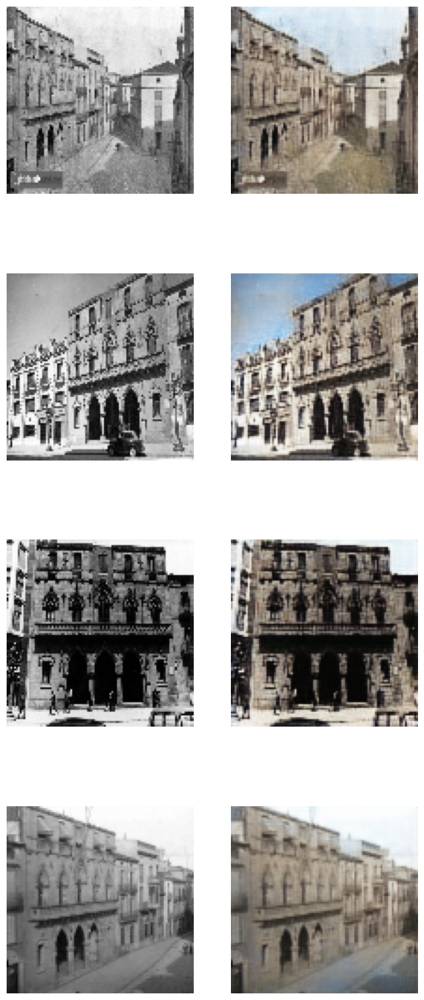

In [17]:
import matplotlib.pyplot as plt

# Crear una figura con dos subplots
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(8, 20))

print("Ajuntament de Terrassa en blanco y negro\t Ajuntament de Terrassa en color")

# Iterar sobre las imágenes y sus reconstrucciones y mostrarlas en los subplots
for i in range(4):
    axs[i, 0].imshow(imagenes_Terrassa_ajuntament_norm[i], cmap='gray')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(reconstrucciones_ajuntament_20[i])
    axs[i, 1].axis('off')

# Mostrar la figura
plt.show()


In [20]:
# Crear una carpeta para guardar los resultados
if not os.path.exists("Resultados FINE TUNNING Ajuntament"):
    os.makedirs("Resultados FINE TUNNING Ajuntament")

# Iterar sobre las imágenes y sus reconstrucciones y guardarlas en la carpeta resultados
for i in range(len(imagenes_Terrassa_ajuntament_norm)):
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4)) # Crear una figura con dos subplots

    # Mostrar las imágenes en los subplots
    axs[0].imshow(imagenes_Terrassa_ajuntament_norm[i], cmap='gray')
    axs[0].set_title("Castell en blanco y negro")
    axs[1].imshow(reconstrucciones_ajuntament_20[i])
    axs[1].set_title("Castell en color")

    # Guardar la figura en la carpeta resultados con un nombre descriptivo
    plt.savefig(f"Resultados FINE TUNNING Ajuntament/AjuntamentFINE TUNNING_{i}_colorized.png")

    
    # Cerrar la figura
    plt.close(fig)

In [21]:
# Crear la carpeta "Resultados Ajuntament" si no existe
if not os.path.exists("Resultados FINE TUNNING Ajuntament"):
    os.makedirs("Resultados FINE TUNNING Ajuntament")

# Iterar sobre las imágenes y sus reconstrucciones y guardar solo las reconstrucciones en la carpeta "Resultados Ajuntament"
for i in range(len(imagenes_Terrassa_ajuntament_norm)):
    # Verificar si el archivo ya existe antes de guardarlo
    if not os.path.isfile(f"Resultados FINE TUNNING Ajuntament/ajuntamentsoloFINE TUNNING_{i}_colorized.png"):
        plt.imsave(f"Resultados FINE TUNNING Ajuntament/ajuntamentsoloFINE TUNNING_{i}_colorized.png", reconstrucciones_ajuntament_20[i])

## Finetunning mercat

In [30]:
modelo0 = load_model('modelo0.h5')

In [22]:
castell_cartoixa_array_ara = np.load('castell_cartoixa_array_ara.npy')
castell_cartoixa_gray_ara = np.load('castell_cartoixa_gray_ara.npy')

In [31]:
# Entrenamiento del modelo
epochs = 50
batch_size = 32

history22 = modelo0.fit(castell_cartoixa_gray_ara, castell_cartoixa_array_ara, epochs=epochs, batch_size=32)


Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.0074
Epoch 2/50
1/1 [==============================] - 1s 1s/step - loss: 0.0073
Epoch 3/50
1/1 [==============================] - 1s 1s/step - loss: 0.0067
Epoch 4/50
1/1 [==============================] - 1s 1s/step - loss: 0.0061
Epoch 5/50
1/1 [==============================] - 1s 1s/step - loss: 0.0056
Epoch 6/50
1/1 [==============================] - 1s 1s/step - loss: 0.0058
Epoch 7/50
1/1 [==============================] - 1s 1s/step - loss: 0.0060
Epoch 8/50
1/1 [==============================] - 1s 1s/step - loss: 0.0059
Epoch 9/50
1/1 [==============================] - 1s 1s/step - loss: 0.0054
Epoch 10/50
1/1 [==============================] - 1s 1s/step - loss: 0.0052
Epoch 11/50
1/1 [==============================] - 1s 1s/step - loss: 0.0051
Epoch 12/50
1/1 [==============================] - 1s 1s/step - loss: 0.0052
Epoch 13/50
1/1 [==============================] - 1s 1s/step - loss: 0.0053
Epoch 14

In [32]:
def cargar_imagenes(path):
    imagenes = []
    ajuntament_path = os.path.join(path, 'Castell Cartoixa')
    for filename in os.listdir(ajuntament_path):
        if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
            img_path = os.path.join(ajuntament_path, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            img_100x100 = cv2.resize(img, (100, 100))
            imagenes.append(img_100x100)
    return np.array(imagenes)

imagenes_Terrassa_castell = cargar_imagenes('Terrassa antiga')
print(imagenes_Terrassa_castell.shape)
imagenes_Terrassa_castell_norm = imagenes_Terrassa_castell/255.0

(3, 100, 100)


In [33]:
reconstrucciones_castell_20 = modelo0.predict(imagenes_Terrassa_castell_norm)

1/1 [==============================] - 0s 230ms/step


Castell en blanco y negro	 Castell en color


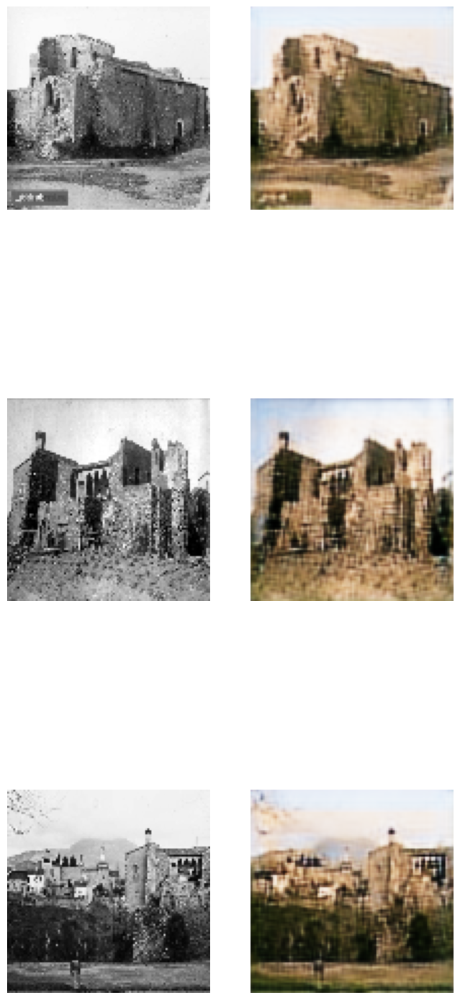

In [35]:
# Crear una figura con dos subplots
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(8, 20))

print("Castell en blanco y negro\t Castell en color")

# Iterar sobre las imágenes y sus reconstrucciones y mostrarlas en los subplots
for i in range(3):
    axs[i, 0].imshow(imagenes_Terrassa_castell_norm[i], cmap='gray')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(reconstrucciones_castell_20[i])
    axs[i, 1].axis('off')

# Mostrar la figura
plt.show()


In [36]:
# Crear una carpeta para guardar los resultados
if not os.path.exists("Resultados FINE TUNNING Castell"):
    os.makedirs("Resultados FINE TUNNING Castell")

# Iterar sobre las imágenes y sus reconstrucciones y guardarlas en la carpeta resultados
for i in range(len(imagenes_Terrassa_castell_norm)):
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4)) # Crear una figura con dos subplots

    # Mostrar las imágenes en los subplots
    axs[0].imshow(imagenes_Terrassa_castell_norm[i], cmap='gray')
    axs[0].set_title("Castell en blanco y negro")
    axs[1].imshow(reconstrucciones_castell_20[i])
    axs[1].set_title("Castell en color")

    # Guardar la figura en la carpeta resultados con un nombre descriptivo
    plt.savefig(f"Resultados FINE TUNNING Castell/CastellFINE TUNNING_{i}_colorized.png")

    
    # Cerrar la figura
    plt.close(fig)

In [37]:
# Iterar sobre las imágenes y sus reconstrucciones y guardar solo las reconstrucciones en la carpeta "Resultados Ajuntament"
for i in range(len(imagenes_Terrassa_castell_norm)):
    # Verificar si el archivo ya existe antes de guardarlo
    if not os.path.isfile(f"Resultados FINE TUNNING Castell/CastellsoloFINE TUNNING_{i}_colorized.png"):
        plt.imsave(f"Resultados FINE TUNNING Castell/CastellsoloFINE TUNNING_{i}_colorized.png", reconstrucciones_castell_20[i])

# Fine tunning Mercat

In [38]:
modelo0 = load_model('modelo0.h5')

In [24]:
def cargar_imagenes(path):
    imagenes = []
    ajuntament_path = os.path.join(path, 'Mercat de la independencia')
    for filename in os.listdir(ajuntament_path):
        if filename.endswith('.jpg') or filename.endswith('.jpeg'):
            img_path = os.path.join(ajuntament_path, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            img_100x100 = cv2.resize(img, (100, 100))
            imagenes.append(img_100x100)
    return np.array(imagenes)

imagenes_Terrassa_mercat = cargar_imagenes('Terrassa antiga')
print(imagenes_Terrassa_mercat.shape)
imagenes_Terrassa_mercat_norm = imagenes_Terrassa_mercat/255.0

(4, 100, 100)


In [39]:
mercat_independencia_array_ara = np.load('mercat_independencia_array_ara.npy')
mercat_independencia_gray_ara = np.load('mercat_independencia_gray_ara.npy')

In [40]:
# Entrenamiento del modelo
epochs = 50
batch_size = 32

history22 = modelo0.fit(mercat_independencia_gray_ara, mercat_independencia_array_ara, epochs=epochs, batch_size=32)


Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.0081
Epoch 2/50
1/1 [==============================] - 1s 1s/step - loss: 0.0084
Epoch 3/50
1/1 [==============================] - 1s 1s/step - loss: 0.0079
Epoch 4/50
1/1 [==============================] - 1s 1s/step - loss: 0.0076
Epoch 5/50
1/1 [==============================] - 1s 986ms/step - loss: 0.0071
Epoch 6/50
1/1 [==============================] - 1s 1s/step - loss: 0.0071
Epoch 7/50
1/1 [==============================] - 1s 1s/step - loss: 0.0070
Epoch 8/50
1/1 [==============================] - 1s 1s/step - loss: 0.0070
Epoch 9/50
1/1 [==============================] - 1s 956ms/step - loss: 0.0066
Epoch 10/50
1/1 [==============================] - 1s 1s/step - loss: 0.0065
Epoch 11/50
1/1 [==============================] - 1s 955ms/step - loss: 0.0063
Epoch 12/50
1/1 [==============================] - 1s 992ms/step - loss: 0.0063
Epoch 13/50
1/1 [==============================] - 1s 993ms/step - loss: 

In [41]:
reconstrucciones_mercat_20 = modelo0.predict(imagenes_Terrassa_mercat_norm)

1/1 [==============================] - 0s 361ms/step


Ajuntament de Mercat en blanco y negro	 Mercat de Terrassa en color


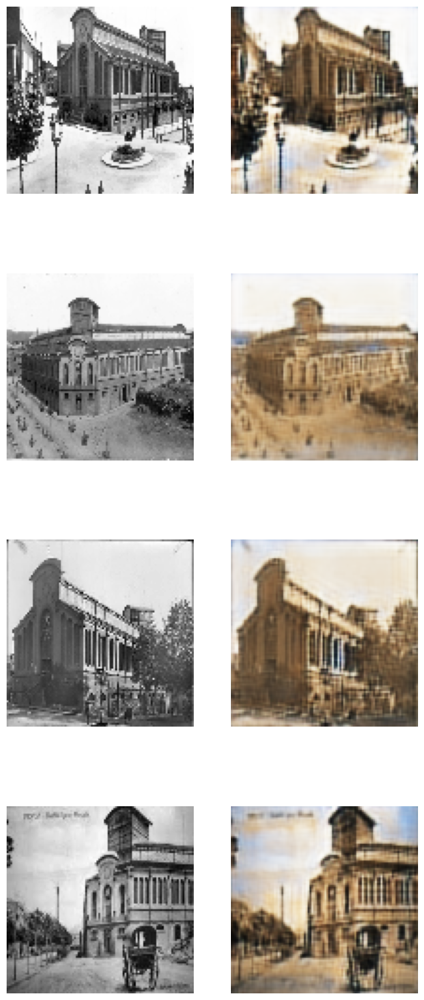

In [42]:
# Crear una figura con dos subplots
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(8, 20))

print("Ajuntament de Mercat en blanco y negro\t Mercat de Terrassa en color")

# Iterar sobre las imágenes y sus reconstrucciones y mostrarlas en los subplots
for i in range(4):
    axs[i, 0].imshow(imagenes_Terrassa_mercat_norm[i], cmap='gray')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(reconstrucciones_mercat_20[i])
    axs[i, 1].axis('off')

# Mostrar la figura
plt.show()


In [43]:
# Crear una carpeta para guardar los resultados
if not os.path.exists("Resultados FINE TUNNING Mercat"):
    os.makedirs("Resultados FINE TUNNING Mercat")

# Iterar sobre las imágenes y sus reconstrucciones y guardarlas en la carpeta resultados
for i in range(len(imagenes_Terrassa_mercat_norm)):
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4)) # Crear una figura con dos subplots

    # Mostrar las imágenes en los subplots
    axs[0].imshow(imagenes_Terrassa_mercat_norm[i], cmap='gray')
    axs[0].set_title("Castell en blanco y negro")
    axs[1].imshow(reconstrucciones_mercat_20[i])
    axs[1].set_title("Castell en color")

    # Guardar la figura en la carpeta resultados con un nombre descriptivo
    plt.savefig(f"Resultados FINE TUNNING Mercat/MercatFINE TUNNING_{i}_colorized.png")

    
    # Cerrar la figura
    plt.close(fig)

In [44]:
# Iterar sobre las imágenes y sus reconstrucciones y guardar solo las reconstrucciones en la carpeta "Resultados Ajuntament"
for i in range(len(imagenes_Terrassa_mercat_norm)):
    # Verificar si el archivo ya existe antes de guardarlo
    if not os.path.isfile(f"Resultados FINE TUNNING Mercat/MercatsoloFINE TUNNING_{i}_colorized.png"):
        plt.imsave(f"Resultados FINE TUNNING Mercat/MercatsoloFINE TUNNING_{i}_colorized.png", reconstrucciones_mercat_20[i])

# Fine tunning Masia Freixa

In [46]:
modelo0 = load_model('modelo0.h5')

In [45]:
masia_freixa_array_ara = np.load('masia_freixa_array_ara.npy')
masia_freixa_gray_ara = np.load('masia_freixa_gray_ara.npy')

In [50]:
def cargar_imagenes(path):
    imagenes = []
    ajuntament_path = os.path.join(path, 'Masia Freixa')
    for filename in os.listdir(ajuntament_path):
        if filename.endswith('.jpg') or filename.endswith('.jpeg'):
            img_path = os.path.join(ajuntament_path, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            img_100x100 = cv2.resize(img, (100, 100))
            imagenes.append(img_100x100)
    return np.array(imagenes)

imagenes_Terrassa_masia = cargar_imagenes('Terrassa antiga')
print(imagenes_Terrassa_masia.shape)
imagenes_Terrassa_masia_norm = imagenes_Terrassa_masia/255.0

(3, 100, 100)


In [47]:
# Entrenamiento del modelo
epochs = 50
batch_size = 32

history23 = modelo0.fit(masia_freixa_gray_ara, masia_freixa_array_ara, epochs=epochs, batch_size=32)


Epoch 1/50
1/1 [==============================] - 3s 3s/step - loss: 0.0098
Epoch 2/50
1/1 [==============================] - 1s 1s/step - loss: 0.0096
Epoch 3/50
1/1 [==============================] - 1s 1s/step - loss: 0.0068
Epoch 4/50
1/1 [==============================] - 1s 1s/step - loss: 0.0070
Epoch 5/50
1/1 [==============================] - 1s 1s/step - loss: 0.0073
Epoch 6/50
1/1 [==============================] - 1s 1s/step - loss: 0.0073
Epoch 7/50
1/1 [==============================] - 1s 1s/step - loss: 0.0060
Epoch 8/50
1/1 [==============================] - 1s 1s/step - loss: 0.0064
Epoch 9/50
1/1 [==============================] - 1s 970ms/step - loss: 0.0063
Epoch 10/50
1/1 [==============================] - 1s 1s/step - loss: 0.0063
Epoch 11/50
1/1 [==============================] - 1s 982ms/step - loss: 0.0060
Epoch 12/50
1/1 [==============================] - 1s 1s/step - loss: 0.0061
Epoch 13/50
1/1 [==============================] - 1s 1s/step - loss: 0.0059
Ep

In [51]:
reconstrucciones_masia_20 = modelo0.predict(imagenes_Terrassa_masia_norm)

1/1 [==============================] - 0s 232ms/step


Masia en blanco y negro	 Masia en color


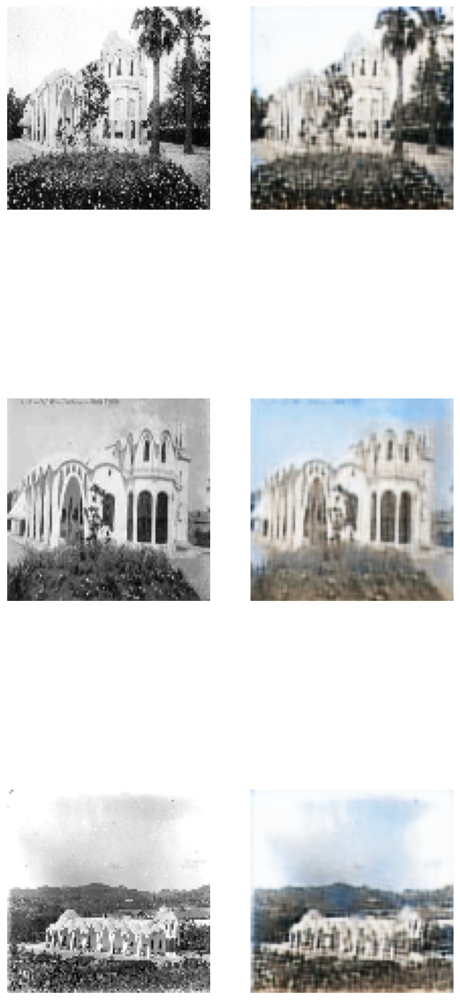

In [53]:
# Crear una figura con dos subplots
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(8, 20))

print("Masia en blanco y negro\t Masia en color")

# Iterar sobre las imágenes y sus reconstrucciones y mostrarlas en los subplots
for i in range(3):
    axs[i, 0].imshow(imagenes_Terrassa_masia_norm[i], cmap='gray')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(reconstrucciones_masia_20[i])
    axs[i, 1].axis('off')

# Mostrar la figura
plt.show()


In [54]:
# Crear una carpeta para guardar los resultados
if not os.path.exists("Resultados FINE TUNNING Masia"):
    os.makedirs("Resultados FINE TUNNING Masia")

# Iterar sobre las imágenes y sus reconstrucciones y guardarlas en la carpeta resultados
for i in range(len(imagenes_Terrassa_masia_norm)):
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4)) # Crear una figura con dos subplots

    # Mostrar las imágenes en los subplots
    axs[0].imshow(imagenes_Terrassa_masia_norm[i], cmap='gray')
    axs[0].set_title("Masia en blanco y negro")
    axs[1].imshow(reconstrucciones_masia_20[i])
    axs[1].set_title("Masia en color")

    # Guardar la figura en la carpeta resultados con un nombre descriptivo
    plt.savefig(f"Resultados FINE TUNNING Masia/MasiaFINE TUNNING_{i}_colorized.png")

    
    # Cerrar la figura
    plt.close(fig)

In [55]:
# Iterar sobre las imágenes y sus reconstrucciones y guardar solo las reconstrucciones en la carpeta "Resultados Ajuntament"
for i in range(len(imagenes_Terrassa_masia_norm)):
    # Verificar si el archivo ya existe antes de guardarlo
    if not os.path.isfile(f"Resultados FINE TUNNING Masia/MasiasoloFINE TUNNING_{i}_colorized.png"):
        plt.imsave(f"Resultados FINE TUNNING Masia/MasiasoloFINE TUNNING_{i}_colorized.png", reconstrucciones_masia_20[i])